In [2]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
from sklearn import preprocessing
from sklearn.cluster import KMeans

In [16]:
df = pd.read_excel("week2_dataset.xlsx")
df.head()

,Bearer Id,Start,Start ms,End,End ms,Dur. (ms),IMSI,MSISDN/Number,IMEI,Last Location Name,...,Youtube DL (Bytes),Youtube UL (Bytes),Netflix DL (Bytes),Netflix UL (Bytes),Gaming DL (Bytes),Gaming UL (Bytes),Other DL (Bytes),Other UL (Bytes),Total UL (Bytes),Total DL (Bytes)
0,13114483460844900352,2019-04-04 12:01:18,770.0,2019-04-25 14:35:31,662.0,1823652.0,2.082014e+14,3.366496e+10,3.552121e+13,9164566995485190,...,15854611.0,2501332.0,8198936.0,9656251.0,278082303.0,14344150.0,171744450.0,8814393.0,36749741.0,308879636.0
1,13114483482878900224,2019-04-09 13:04:04,235.0,2019-04-25 08:15:48,606.0,1365104.0,2.082019e+14,3.368185e+10,3.579401e+13,L77566A,...,20247395.0,19111729.0,18338413.0,17227132.0,608750074.0,1170709.0,526904238.0,15055145.0,53800391.0,653384965.0
2,13114483484080500736,2019-04-09 17:42:11,1.0,2019-04-25 11:58:13,652.0,1361762.0,2.082003e+14,3.376063e+10,3.528151e+13,D42335A,...,19725661.0,14699576.0,17587794.0,6163408.0,229584621.0,395630.0,410692588.0,4215763.0,27883638.0,279807335.0
3,13114483485442799616,2019-04-10 00:31:25,486.0,2019-04-25 07:36:35,171.0,1321509.0,2.082014e+14,3.375034e+10,3.535661e+13,T21824A,...,21388122.0,15146643.0,13994646.0,1097942.0,799538153.0,10849722.0,749039933.0,12797283.0,43324218.0,846028530.0
4,13114483499480700928,2019-04-12 20:10:23,565.0,2019-04-25 10:40:32,954.0,1089009.0,2.082014e+14,3.369980e+10,3.540701e+13,D88865A,...,15259380.0,18962873.0,17124581.0,415218.0,527707248.0,3529801.0,550709500.0,13910322.0,38542814.0,569138589.0


In [3]:
dfengag = pd.read_csv("engagement_metrics.csv")
dfengag.head()

,Unnamed: 0,Session Number,Dur. (ms).1,Total_downloads,kmeans_labels
0,0,2.0,1.823653e+09,345629377.0,2
1,1,2.0,1.365104e+09,707185356.0,1
2,2,1.0,1.361763e+09,307690973.0,2
3,3,1.0,1.321510e+09,889352748.0,1
4,4,1.0,1.089009e+09,607681403.0,0


In [5]:
#normalizing the engagement metrics
x1= dfengag[['Session Number','Dur. (ms).1', 'Total_downloads']]
min_max_scaler = preprocessing.MinMaxScaler()
x_scaled = min_max_scaler.fit_transform(x1)
df_xscaled = pd.DataFrame(x_scaled,columns = ['xDr sessions', 'Session Duration', 'Total Downloads'])

In [6]:
#run k_mean
kmean = KMeans(n_clusters=3, init='k-means++', random_state=22)
kmean.fit(df_xscaled)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=22, tol=0.0001, verbose=0)

In [10]:
#cluster center for the least cluster 2 of engagement metrics
cluster_center = kmean.cluster_centers_[:,2]
cluster_center

array([0.50208931, 0.80684791, 0.19780182])

In [12]:
from scipy.spatial import distance

In [13]:
#function to calculate the euclidian distance
def calculate_distance(centroid, X, Y,Z):
    distances = []
    # Unpack the x and y coordinates of the centroid
    c_x, c_y,c_z = centroid
    # Iterate over the data points and calculate the distance using the           # given formula
    for x, y,z in list(zip(X, Y,Z)):
        root_diff_x = (x - c_x) ** 2
        root_diff_y = (y - c_y) ** 2
        root_diff_z = (z - c_z) ** 2
        distance = np.sqrt(root_diff_x + root_diff_y + root_diff_z)
        distances.append(distance)
    return distances

In [14]:
x1['Engagement Score'] = calculate_distance(cluster_center, x1['Session Number'], x1['Dur. (ms).1'],x1['Total_downloads'])
x1.head()

C:\Users\Jeannette\anaconda3\lib\site-packages\ipykernel_launcher.py:1: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  """Entry point for launching an IPython kernel.


,Session Number,Dur. (ms).1,Total_downloads,Engagement Score
0,2.0,1.823653e+09,345629377.0,1.856117e+09
1,2.0,1.365104e+09,707185356.0,1.537407e+09
2,1.0,1.361763e+09,307690973.0,1.396091e+09
3,1.0,1.321510e+09,889352748.0,1.592902e+09
4,1.0,1.089009e+09,607681403.0,1.247084e+09


In [4]:
dfexp = pd.read_csv("Experience_metrics.csv")
dfexp.head()

,Unnamed: 0,TCP retransmission,Average Throughput,RTT average,kmean_label
0,0,21569572.94,67.0,47.000000,2
1,1,21569572.94,42.0,70.000000,2
2,2,21569572.94,15.0,127.458589,0
3,3,21569572.94,88.0,127.458589,0
4,4,21569572.94,15.0,127.458589,0


In [7]:
#Using the experience metrics above, perform a k-means clustering 
exp_metrics = dfexp[['TCP retransmission', 'Average Throughput', 'RTT average']]
min_max_scaler = preprocessing.MinMaxScaler()
exp_metrics2 = min_max_scaler.fit_transform(exp_metrics)
df_exp_metrics2 = pd.DataFrame(exp_metrics2 ,columns = ['Norm TCP', 'Norm Throughpt', 'Norm RTT'])

In [8]:
kmeans = KMeans(n_clusters=3, init='k-means++', random_state=22)
kmeans.fit(df_exp_metrics2)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=3, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=22, tol=0.0001, verbose=0)

In [11]:
#cluster center for the least cluster 2 of experience score
cluster_center1 = kmeans.cluster_centers_[:,1]
cluster_center1

array([0.0397736 , 0.60710619, 0.03129843])

In [15]:
#experience score
exp_metrics['Experience Score'] = calculate_distance(cluster_center1, exp_metrics['TCP retransmission'], exp_metrics['Average Throughput'],exp_metrics['RTT average'])
exp_metrics.head()

C:\Users\Jeannette\anaconda3\lib\site-packages\ipykernel_launcher.py:2: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  


,TCP retransmission,Average Throughput,RTT average,Experience Score
0,21569572.94,67.0,47.000000,2.156957e+07
1,21569572.94,42.0,70.000000,2.156957e+07
2,21569572.94,15.0,127.458589,2.156957e+07
3,21569572.94,88.0,127.458589,2.156957e+07
4,21569572.94,15.0,127.458589,2.156957e+07


In [18]:
#combing the three data frames
new_df= pd.concat([df['MSISDN/Number'], x1, exp_metrics ], axis=1)
new_df.head()

,MSISDN/Number,Session Number,Dur. (ms).1,Total_downloads,Engagement Score,TCP retransmission,Average Throughput,RTT average,Experience Score
0,3.366496e+10,2.0,1.823653e+09,345629377.0,1.856117e+09,21569572.94,67.0,47.000000,2.156957e+07
1,3.368185e+10,2.0,1.365104e+09,707185356.0,1.537407e+09,21569572.94,42.0,70.000000,2.156957e+07
2,3.376063e+10,1.0,1.361763e+09,307690973.0,1.396091e+09,21569572.94,15.0,127.458589,2.156957e+07
3,3.375034e+10,1.0,1.321510e+09,889352748.0,1.592902e+09,21569572.94,88.0,127.458589,2.156957e+07
4,3.369980e+10,1.0,1.089009e+09,607681403.0,1.247084e+09,21569572.94,15.0,127.458589,2.156957e+07


In [20]:
#finding the satsifaction score as the average og the two score
new_df['Satisfaction Score'] = (new_df['Engagement Score'] + new_df['Experience Score'])/2
new_df.head()

,MSISDN/Number,Session Number,Dur. (ms).1,Total_downloads,Engagement Score,TCP retransmission,Average Throughput,RTT average,Experience Score,Satisfaction Score
0,3.366496e+10,2.0,1.823653e+09,345629377.0,1.856117e+09,21569572.94,67.0,47.000000,2.156957e+07,9.388432e+08
1,3.368185e+10,2.0,1.365104e+09,707185356.0,1.537407e+09,21569572.94,42.0,70.000000,2.156957e+07,7.794884e+08
2,3.376063e+10,1.0,1.361763e+09,307690973.0,1.396091e+09,21569572.94,15.0,127.458589,2.156957e+07,7.088305e+08
3,3.375034e+10,1.0,1.321510e+09,889352748.0,1.592902e+09,21569572.94,88.0,127.458589,2.156957e+07,8.072357e+08
4,3.369980e+10,1.0,1.089009e+09,607681403.0,1.247084e+09,21569572.94,15.0,127.458589,2.156957e+07,6.343267e+08


In [21]:
#top 10 satisified customer
new_df1 = new_df[['MSISDN/Number', 'Engagement Score','Experience Score', 'Satisfaction Score']]
new_df1.sort_values(by = 'Satisfaction Score', ascending = False).head(10)

,MSISDN/Number,Engagement Score,Experience Score,Satisfaction Score
67481,3.366613e+10,9.227891e+08,4.211258e+09,2.567023e+09
41182,3.365863e+10,8.353169e+08,4.254660e+09,2.544988e+09
122572,3.365908e+10,8.277785e+08,4.093217e+09,2.460498e+09
77950,3.376211e+10,6.221702e+08,4.294432e+09,2.458301e+09
39608,3.366491e+10,6.232095e+08,4.268647e+09,2.445928e+09
34636,3.366045e+10,5.431857e+08,4.344116e+09,2.443651e+09
65135,NaN,7.004525e+08,4.183368e+09,2.441910e+09
119416,3.366682e+10,8.454386e+08,3.968121e+09,2.406780e+09
3741,3.365871e+10,5.233156e+08,4.288121e+09,2.405718e+09
78810,3.366486e+10,8.755380e+08,3.912420e+09,2.393979e+09


In [22]:
#attributes and labels for prediction 
X = new_df['Engagement Score'].values.reshape(-1,1)
Y = new_df['Satisfaction Score'].values.reshape(-1,1)

In [23]:
#split data into training and test set
from sklearn.model_selection import train_test_split
X_train, X_test, y_train, y_test = train_test_split(X, Y, test_size=0.2, random_state=0)

In [24]:
#training the linear regression model
from sklearn.linear_model import LinearRegression
regressor = LinearRegression()
regressor.fit(X_train, y_train)

LinearRegression(copy_X=True, fit_intercept=True, n_jobs=None, normalize=False)

In [25]:
#To get the intercept:
print(regressor.intercept_)
#For getting the slope:
print(regressor.coef_)

[11180431.85182855]
[[0.49907913]]


In [26]:
y_pred = regressor.predict(X_test)
#comparing the actual value and the predicted value
df_comp = pd.DataFrame({'Actual': y_test.flatten(), 'Predicted': y_pred.flatten()})
df_comp

,Actual,Predicted
0,3.418299e+08,3.472076e+08
1,6.061772e+07,7.009318e+07
2,3.557779e+08,3.555382e+08
3,4.487552e+08,4.574731e+08
4,3.343836e+08,3.448916e+08
...,...,...
29996,2.662099e+08,2.768312e+08
29997,8.113540e+07,9.083771e+07
29998,1.403251e+08,1.404822e+08
29999,3.563109e+08,3.668271e+08


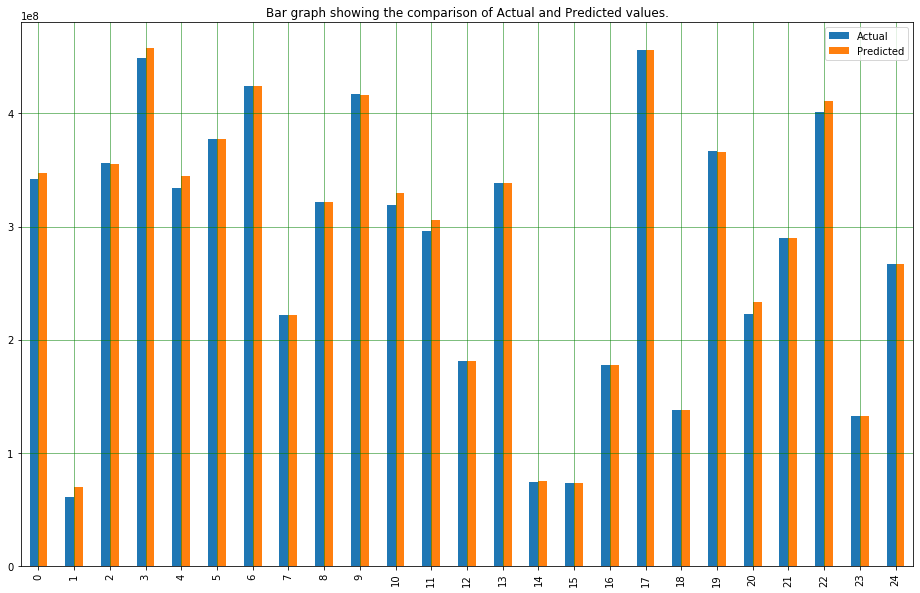

In [27]:
#visualizing the comparison graph with just 25 first element
df_comp1 = df_comp.head(25)
df_comp1.plot(kind='bar',figsize=(16,10))
plt.grid(which='major', linestyle='-', linewidth='0.5', color='green')
plt.grid(which='minor', linestyle=':', linewidth='0.5', color='black')
plt.title("Bar graph showing the comparison of Actual and Predicted values.")
plt.show()

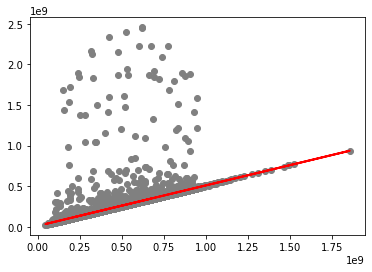

In [28]:
#plot shows straight line with the test data 
plt.scatter(X_test, y_test,  color='gray')
plt.plot(X_test, y_pred, color='red', linewidth=2)
plt.show()

In [29]:
#Run a k-means (k=2) on the engagement & the experience score 
engage_expDf = new_df[['Engagement Score', 'Experience Score']]
min_max_scaler = preprocessing.MinMaxScaler()
engage_exp = min_max_scaler.fit_transform(engage_expDf)
engage_exp
engage_normexpDf = pd.DataFrame(engage_exp ,columns = ['Engagement scoreNorm', 'Experience scoreNorm'])
engage_normexpDf.head()

,Engagement scoreNorm,Experience scoreNorm
0,0.897950,0.004965
1,0.739763,0.004965
2,0.669623,0.004965
3,0.767307,0.004965
4,0.595665,0.004965


In [30]:
#run k_mean
kmean1 = KMeans(n_clusters=2, init='k-means++', random_state=22)
kmean1.fit(engage_normexpDf)

KMeans(algorithm='auto', copy_x=True, init='k-means++', max_iter=300,
       n_clusters=2, n_init=10, n_jobs=None, precompute_distances='auto',
       random_state=22, tol=0.0001, verbose=0)

In [31]:
engage_normexpDf['score_clusters'] =  kmean1.labels_
engage_normexpDf.head()

,Engagement scoreNorm,Experience scoreNorm,score_clusters
0,0.897950,0.004965,0
1,0.739763,0.004965,0
2,0.669623,0.004965,0
3,0.767307,0.004965,0
4,0.595665,0.004965,0


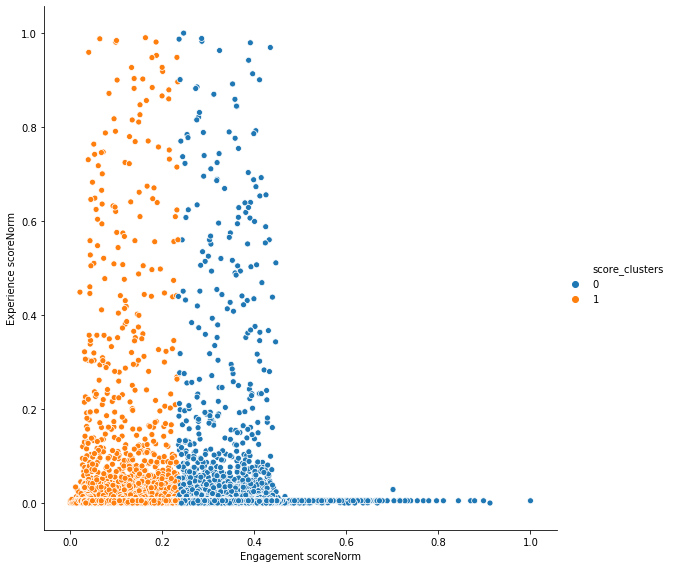

In [32]:
sns.relplot(x='Engagement scoreNorm', y='Experience scoreNorm', height= 8, aspect=1, hue="score_clusters", data= engage_normexpDf)

In [33]:
#Aggregate the average satisfaction & experience score per cluster
new_df['score_cluster'] = kmean.labels_
aggregation1 = new_df.groupby(['score_cluster']).agg({'Experience Score': ['sum']})
aggregation1.reset_index()

,score_cluster,Experience Score
,,sum
0,0,1.073352e+12
1,1,1.060892e+12
2,2,1.101343e+12


In [34]:
aggregation2 = new_df.groupby(['score_cluster']).agg({'Satisfaction Score': ['sum']})
aggregation2.reset_index()

,score_cluster,Satisfaction Score
,,sum
0,0,1.336985e+13
1,1,2.029184e+13
2,2,6.688339e+12


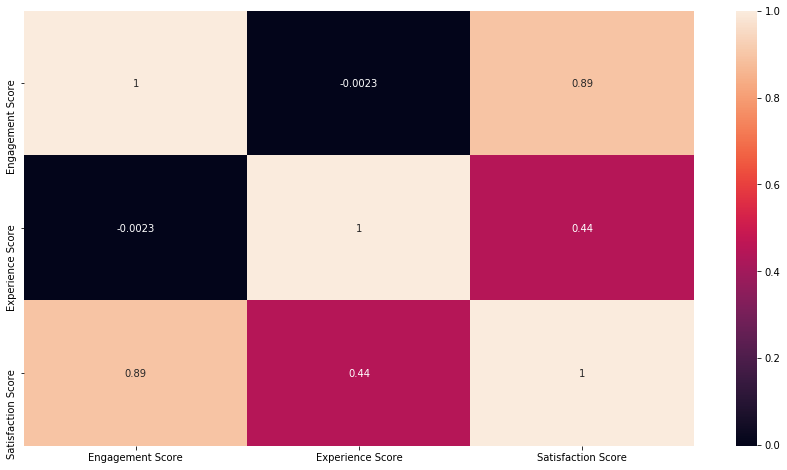

In [35]:
corr = new_df[['Engagement Score', 'Experience Score', 'Satisfaction Score']] .corr()
f, ax = plt.subplots(figsize=(15, 8))
sns.heatmap(corr,annot=True,
            xticklabels=corr.columns.values,
            yticklabels=corr.columns.values)

In [40]:
#Export your final table containing all user id + engagement, experience & satisfaction scores in your local MySQL database#
import sqlite3
conn = sqlite3.connect('Test2DB2.db')
c = conn.cursor()
c.execute('CREATE TABLE Users_Scores(User Id, Engagement Score, Experience Score, Satisfaction Score)')
conn.commit()
new_df1.to_sql('Users_Scores', conn, if_exists='replace', index = False)
 
c.execute('''  
SELECT * FROM Users_Scores
          ''')

for row in c.fetchall():
    print (row)

(33664962239.0, 1856116788.8001604, 21569572.900379717, 938843180.85027)
(33681854413.0, 1537407255.4081187, 21569572.900379602, 779488414.1542492)
(33760627129.0, 1396091418.999859, 21569572.900607605, 708830495.9502333)
(33750343200.0, 1592901803.451677, 21569572.900779843, 807235688.1762285)
(33699795932.0, 1247083852.3870282, 21569572.900607605, 634326712.6438179)
(33668185951.0, 1330674745.4780998, 21569572.900955748, 676122159.1895278)
(33665368271.0, 1042020021.9844807, 21569572.90057341, 531794797.44252706)
(33763490140.0, 1265222007.109896, 779189.4846213968, 633000598.2972586)
(33698743617.0, 1305315174.4319236, 21569572.900809344, 663442373.6663665)
(33659219748.0, 1228591969.6782424, 3238633.244899529, 615915301.461571)
(33665646348.0, 1069894195.2188007, 21569572.900607605, 545731884.0597042)
(33664473872.0, 1056101673.2164893, 6034735.329554936, 531068204.2730221)
(33603291937.0, 1201774826.4050684, 21569572.900906138, 611672199.6529872)
(33659219748.0, 1025197793.1113828

(33664342446.0, 889413015.7623446, 15324535.627587674, 452368775.69496614)
(33650574745.0, 349933458.1709402, 109721.61527972235, 175021589.89310998)
(33651784503.0, 236469192.10819504, 21569572.900442533, 129019382.50431879)
(33658474071.0, 730939031.4295053, 626783.1314250701, 365782907.2804652)
(33650896825.0, 173924814.2511429, 21569572.90046191, 97747193.5758024)
(33763932519.0, 774363341.4271787, 5844980.205535913, 390104160.8163573)
(33659604789.0, 170173027.02771947, 6949724.570387489, 88561375.79905348)
(33783964782.0, 122019186.56952639, 21569572.900357477, 71794379.73494193)
(33663047808.0, 197972537.3783702, 12823.593683871508, 98992680.48602703)
(33672450536.0, 753983117.5205939, 1751539.0454870895, 377867328.28304046)
(33677031289.0, 220997205.37829447, 9832.669291963712, 110503519.02379322)
(33652835070.0, 823648371.5631088, 682491.0242469286, 412165431.29367787)
(33679069693.0, 131344549.76936623, 3094667.900158638, 67219608.83476244)
(33761022146.0, 387121600.5010794, 

(33616720564.0, 363999558.9838177, 123648.03592121282, 182061603.50986946)
(33669066586.0, 628828542.3604891, 21569607.890120085, 325199075.1253046)
(33645618461.0, 743123375.2820909, 13753330.654492768, 378438352.9682918)
(33650272492.0, 607760667.6390517, 1951779.9314989634, 304856223.78527534)
(33652813347.0, 815328477.1186562, 1616672.9654347093, 408472575.0420454)
(33650817386.0, 581643706.6475247, 52226.10189059756, 290847966.37470764)
(33663991317.0, 322281718.7186624, 233052.01359758092, 161257385.36613)
(33624336392.0, 744526165.8838016, 144429.0307427467, 372335297.4572722)
(33681807455.0, 252800961.3626139, 113371.67813079485, 126457166.52037235)
(33663477858.0, 494847527.3954495, 281268.04780481895, 247564397.72162718)
(33622727055.0, 664846174.2137774, 2484213.6195118236, 333665193.91664463)
(33661616582.0, 256745700.3118228, 17299155.62073946, 137022427.96628112)
(33665222985.0, 507302249.90083355, 326195.32032347505, 253814222.6105785)
(33622981508.0, 540169895.7391682, 

(33762486877.0, 764576679.5064466, 422339.126548276, 382499509.31649745)
(33658227460.0, 484603269.6848405, 15067381.86442942, 249835325.77463496)
(33762861573.0, 656399256.0845811, 90884.5249547164, 328245070.3047679)
(33652859319.0, 741129582.0014307, 769404.7284454766, 370949493.36493814)
(33662915118.0, 726952403.4655291, 21569572.900602933, 374260988.183066)
(33667087878.0, 348611531.5692489, 156420162.86934817, 252515847.21929854)
(33663954329.0, 344802301.63434803, 45888231.05780939, 195345266.34607872)
(33663562722.0, 183110108.33003777, 1854543.8043398634, 92482326.06718881)
(33668799144.0, 543678099.1896048, 100325388.96286616, 322001744.0762355)
(33660096586.0, 312422293.1716349, 21569572.900384746, 166995933.03600982)
(33662952306.0, 829524284.5361, 2634491.5645698416, 416079388.05033493)
(33760418574.0, 832697645.0346901, 1884477.6561919197, 417291061.34544104)
(33659441533.0, 210758170.72113553, 1563818.6280699288, 106160994.67460273)
(33662121151.0, 328806186.73334765, 8

(33761614905.0, 146757357.43535784, 2051734.8292263725, 74404546.1322921)
(33661923290.0, 222503725.45014468, 49015401.72598721, 135759563.58806595)
(33698649681.0, 904644849.6590958, 21569572.900349583, 463107211.2797227)
(33662791880.0, 634817045.046762, 276016.07539758616, 317546530.5610798)
(33659260457.0, 551839234.8612416, 1119734.4923881222, 276479484.67681485)
(33760348516.0, 869884530.774441, 94075.77701660099, 434989303.2757288)
(33661782058.0, 668571709.5719476, 1708328298.9602509, 1188450004.2660992)
(33664208377.0, 518612330.78977084, 12109108.03598514, 265360719.41287798)
(33661469685.0, 359460510.7273526, 21569572.90060903, 190515041.81398082)
(33761727703.0, 535193363.2824899, 3620717.6237463937, 269407040.45311815)
(33661109425.0, 891926092.0347291, 458617.45223249507, 446192354.7434808)
(33634274878.0, 426481352.8918559, 19074.00584394951, 213250213.44884992)
(33660294366.0, 696851972.4075887, 113858421.96031839, 405355197.1839535)
(33665976839.0, 386871231.3716225, 3

(33603455249.0, 906807640.4629915, 112035.03791122227, 453459837.7504513)
(33603455249.0, 124375068.7465207, 21569572.900397036, 72972320.82345887)
(33669495482.0, 574923678.8505884, 764810.825556669, 287844244.83807254)
(33668356628.0, 573615451.5244076, 1999007.2357277018, 287807229.38006765)
(33660296534.0, 709867653.7344717, 21569572.903552767, 365718613.3190122)
(33762391778.0, 715886585.0853765, 1178639.57450394, 358532612.3299402)
(33762222909.0, 385379926.05279464, 286576.0400284406, 192833251.04641154)
(33662229479.0, 494990445.20507044, 10405923.403640164, 252698184.3043553)
(33763423698.0, 355275832.5285167, 2160403.691965986, 178718118.11024135)
(33763449826.0, 805371858.8758943, 3235836.9632695853, 404303847.91958195)
(33658354153.0, 860608982.7762675, 74125.96031256882, 430341554.36829007)
(33681638927.0, 865357542.713835, 4101039.9766965644, 434729291.3452658)
(33620721919.0, 237248972.91975015, 763618.5958024696, 119006295.7577763)
(33620721919.0, 933320159.3889023, 215

(33666057247.0, 292455372.1863616, 2813197.6310276957, 147634284.90869465)
(33665955141.0, 117430893.24226032, 21569572.90031698, 69500233.07128865)
(33659871265.0, 340782128.3026255, 26410791.616353244, 183596459.95948935)
(33663446370.0, 681475054.9216582, 3745974.951427658, 342610514.9365429)
(33667637790.0, 602602465.469653, 5976026.047698675, 304289245.7586758)
(33760406631.0, 220222098.01932943, 2038248.4224844184, 111130173.22090693)
(33658590810.0, 634524196.1984378, 1769747.5241393757, 318146971.8612886)
(33761249975.0, 560087508.3068551, 33371498.02618573, 296729503.1665204)
(33617043184.0, 408927634.580812, 139919.21280759477, 204533776.8968098)
(33763782729.0, 481764313.14686316, 1997096.7755996794, 241880704.9612314)
(33659169807.0, 111063779.07790212, 2088474.2175020545, 56576126.64770209)
(33698334086.0, 282120374.0417677, 46002645.96048852, 164061510.0011281)
(33663688053.0, 526111792.74595773, 48748372.960487604, 287430082.85322267)
(33650416698.0, 356385159.60850626, 

(33658164867.0, 100011195.25867996, 3057947.9636510722, 51534571.611165516)
(33761547574.0, 731915144.8758087, 1794832.7053449817, 366854988.7905769)
(33627801818.0, 213889633.53918877, 646840.9746086702, 107268237.25689872)
(33643279096.0, 714807027.5460026, 762294.7542172171, 357784661.15010995)
(33658335109.0, 407320326.97921383, 2293298.3929393366, 204806812.68607658)
(33667384586.0, 423720894.80616564, 50090.24146783598, 211885492.52381673)
(33660351010.0, 776268143.3996288, 21569572.90998079, 398918858.15480477)
(33699748167.0, 718697145.1786176, 422469.4757449139, 359559807.3271813)
(33663051311.0, 203523285.1531055, 1443691.9595883107, 102483488.55634691)
(33658473092.0, 116943999.62618233, 16031451.575978925, 66487725.601080626)
(33662941309.0, 162002035.3717601, 2562251.811173713, 82282143.5914669)
(33662899825.0, 420195157.6634528, 1169396.7946766193, 210682277.2290647)
(33658815335.0, 624846472.4731239, 1958460.668330702, 313402466.5707273)
(33667386777.0, 189227185.3184801

(33762325529.0, 243665082.5885801, 3320287.3565704823, 123492684.97257529)
(33761170813.0, 615916255.3666165, 1641322.2930016664, 308778788.82980907)
(33667683653.0, 923103577.4184759, 34230435.03363344, 478667006.22605467)
(33650040824.0, 274980258.7258317, 21491393.96081427, 148235826.343323)
(33762165148.0, 678763237.5169792, 289434.74296131096, 339526336.12997025)
(33658579681.0, 161090667.5344907, 818866.3034514433, 80954766.91897108)
(33763166863.0, 694082978.6516107, 1731108.5365184094, 347907043.5940646)
(33662638556.0, 792696099.7465752, 55212.47561708255, 396375656.11109614)
(33668252101.0, 107243311.24851722, 3590821.2308240067, 55417066.23967061)
(33663331846.0, 173255533.95409438, 3292323.3239509924, 88273928.6390227)
(33761443009.0, 381924279.1874388, 2337176.7245125975, 192130727.95597568)
(33699409465.0, 696081600.9793069, 4136416.222299169, 350109008.6008031)
(33661523372.0, 729482024.7215818, 6643.22975856888, 364744333.9756702)
(33666013957.0, 634255603.8377942, 1949

(33758132777.0, 171628228.07814443, 1136629.9242277653, 86382429.0011861)
(33668172633.0, 193918924.50244612, 461579.32624028006, 97190251.9143432)
(33621452320.0, 373638785.27861816, 21569572.900600202, 197604179.08960918)
(33699336604.0, 272329029.07021433, 30279.80215391894, 136179654.43618414)
(33667435630.0, 560220879.2439384, 8060595.633885114, 284140737.4389118)
(33659092105.0, 561095181.2172918, 230587.73943455948, 280662884.4783632)
(33760554392.0, 781333703.2665479, 149889.02419559588, 390741796.14537174)
(33760554392.0, 732891224.8753518, 21569572.9005715, 377230398.8879616)
(33783161844.0, 849328647.4025074, 81812.0813911192, 424705229.74194926)
(33673905329.0, 720005946.8123958, 201270.00563623643, 360103608.409016)
(33673905329.0, 237803733.10019174, 21569572.90047254, 129686653.00033215)
(33665122920.0, 244461200.4914653, 72949.68844926535, 122267075.08995728)
(33677192902.0, 467519536.26275736, 21569572.90044114, 244544554.58159924)
(33664712596.0, 275517745.3338943, 22

(33615024323.0, 107517546.16323335, 899630.8032554045, 54208588.48324438)
(33769146595.0, 293504214.37137055, 21569572.90046374, 157536893.63591716)
(33769258184.0, 119543209.34556265, 21569572.900818188, 70556391.12319042)
(33630149424.0, 313981888.50280595, 21569572.913073905, 167775730.70793992)
(None, 885191390.010126, 49971.12374594959, 442620680.56693596)
(33698135296.0, 529660887.34157825, 21569572.900471635, 275615230.12102497)
(None, 854828140.9616163, 3180469.9653969104, 429004305.4635066)
(33628911334.0, 160721734.94049403, 41543.44752298872, 80381639.19400851)
(33658967844.0, 842531391.216337, 46687.63819054168, 421289039.42726374)
(33764472898.0, 915445828.4188471, 21569572.9007742, 468507700.65981066)
(33666572888.0, 349834662.4395438, 279652.4681370683, 175057157.45384043)
(33627488961.0, 295888437.1608699, 21569572.900836434, 158729005.03085315)
(33662735387.0, 712719250.0584689, 21569572.900458034, 367144411.47946346)
(33659620258.0, 91660705.1079617, 1752039.966120407

(33668602018.0, 924185103.8498876, 21569572.90080499, 472877338.3753463)
(33667185159.0, 427404818.1445469, 2777916978.1294637, 1602660898.1370053)
(33670003022.0, 97865686.84962416, 4994052.626943642, 51429869.7382839)
(33670003022.0, 508737602.28863525, 21569572.900439497, 265153587.59453738)
(33661379911.0, 577489316.6982086, 35607.17917428482, 288762461.93869144)
(33680913087.0, 872104570.1156783, 816811.6992656953, 436460690.907472)
(33659574416.0, 127227338.98939039, 21569572.900700662, 74398455.94504553)
(33669165983.0, 194384810.37326524, 21569572.900738083, 107977191.63700166)
(33631465850.0, 848022223.3446597, 21569572.90045297, 434795898.1225563)
(33782231913.0, 691534717.0515409, 21569572.900337957, 356552144.9759394)
(33630782468.0, 402968602.2722394, 21569572.900841113, 212269087.58654025)
(33666857322.0, 695702723.4577817, 850114.6989476159, 348276419.0783647)
(33661952794.0, 604340793.5469644, 900928.4901184033, 302620861.0185414)
(33699904865.0, 906963681.1429954, 1421

(33666830933.0, 282377115.4849436, 30536465.961208526, 156456790.72307608)
(33658409116.0, 170353351.08498067, 21569572.90039361, 95961461.99268714)
(33617539162.0, 298604313.6319009, 1067202.3799818484, 149835758.0059414)
(33661466330.0, 180421006.58570543, 21277956.484373607, 100849481.53503951)
(33660211348.0, 654354366.7709231, 273940.6567696661, 327314153.7138464)
(33777915953.0, 202063887.15038908, 21569572.900885295, 111816730.02563718)
(33611232225.0, 635070761.6659509, 32453.565025113283, 317551607.615488)
(33645587372.0, 216290851.16175452, 759888.9490940751, 108525370.0554243)
(33645587372.0, 635853799.6526425, 21569572.900734562, 328711686.2766885)
(33668342577.0, 606522864.248551, 11942076.01281778, 309232470.1306844)
(33659194091.0, 749272843.15759, 21569572.900425673, 385421208.02900785)
(33638973211.0, 737581333.2045916, 21569572.90039688, 379575453.0524942)
(33758758814.0, 602071399.6713771, 1394800.1846418006, 301733099.92800945)
(33660189612.0, 858791339.6161958, 215

(33698638111.0, 184964983.33143723, 21569572.903241433, 103267278.11733933)
(33686030074.0, 567977189.0179435, 21569572.900602803, 294773380.95927316)
(33627087891.0, 486387980.6720099, 1313082.7813866301, 243850531.72669825)
(33668102043.0, 456935217.4664207, 857637.0567190555, 228896427.2615699)
(33679192685.0, 296098624.2856051, 3412312.681912854, 149755468.48375896)
(33610312007.0, 662949708.0150274, 267876.76022084575, 331608792.38762414)
(33767018625.0, 816127326.2103742, 21569572.901604503, 418848449.5559894)
(33619352870.0, 832911137.4589429, 532021.9754024292, 416721579.7171727)
(33781593313.0, 118745111.3761503, 75676.37354283714, 59410393.87484656)
(33635197963.0, 919279667.3619452, 1103205.0928242502, 460191436.2273847)
(33659272252.0, 517844537.50253457, 21569572.900498297, 269707055.20151645)
(33612814445.0, 125848506.25312223, 766699.0959112989, 63307602.67451676)
(33601722690.0, 742360667.250438, 1423355.6923747205, 371892011.47140634)
(33686869542.0, 259640303.70744973

(33663921656.0, 847589432.1017311, 38920.82041259639, 423814176.46107185)
(None, 316769701.0332925, 7733912.750973953, 162251806.8921332)
(33667978845.0, 531690285.8389396, 20900.41933166796, 265855593.12913564)
(33699290105.0, 616606666.7827438, 23082.013798840242, 308314874.3982713)
(33610704859.0, 719253200.6678287, 186437.08390429977, 359719818.8758665)
(33610704859.0, 526810309.20846736, 21569572.900524933, 274189941.05449617)
(33682083932.0, 280689314.89865255, 1766013.4903517184, 141227664.19450215)
(33621737429.0, 770321547.6405851, 423895.71126532037, 385372721.6759252)
(33781571259.0, 268511274.6332941, 21569575.2408691, 145040424.9370816)
(33781571259.0, 676830692.9507036, 21569572.900479868, 349200132.92559177)
(33658590561.0, 812685177.1374496, 189073.79566070065, 406437125.4665552)
(33662378832.0, 525448920.72008693, 14961040.740594817, 270204980.7303409)
(33662378832.0, 100458807.31066422, 21569572.90045475, 61014190.10555948)
(33668141452.0, 922383267.527831, 21569572.9

(33660762443.0, 343888861.52812546, 21569572.9003978, 182729217.21426162)
(33663861429.0, 499184366.88807046, 21569572.900666434, 260376969.89436844)
(33637484044.0, 694768371.4148113, 12953432.381027495, 353860901.89791936)
(33682179696.0, 645735523.0686722, 21569572.905428573, 333652547.98705035)
(33604178894.0, 434636315.94157314, 759697.3028478351, 217698006.6222105)
(33645281432.0, 316587418.051154, 94885.85664876727, 158341151.95390138)
(33782916612.0, 418539578.71800864, 21569572.900602803, 220054575.80930573)
(33650541463.0, 145305489.0731263, 125742.19598818476, 72715615.63455723)
(33782916612.0, 540089288.3894689, 21569572.90060281, 280829430.64503586)
(33660757107.0, 264063946.87027624, 21569572.91432942, 142816759.89230284)
(33660757107.0, 215021542.45014447, 21569572.90062104, 118295557.67538276)
(33669541136.0, 495819521.62658274, 11056621.249079047, 253438071.4378309)
(33782916612.0, 503592105.7248479, 21569572.900695957, 262580839.31277195)
(33684780396.0, 193760593.465

(33650896825.0, 670508154.8464216, 784568.7382564724, 335646361.792339)
(33662226630.0, 322101777.9053605, 42016.594197207654, 161071897.24977887)
(33761536503.0, 703061124.5344304, 8359038.06202909, 355710081.29822975)
(33650409946.0, 466976612.8241839, 21569572.900414594, 244273092.86229923)
(33662226630.0, 874034239.6916584, 21569572.90055887, 447801906.2961086)
(33630200372.0, 423766633.7690269, 21569572.900432464, 222668103.33472967)
(33659223918.0, 643941080.247013, 21569572.929079086, 332755326.588046)
(33650115528.0, 448906907.08324224, 42534678.960485354, 245720793.0218638)
(33650115528.0, 209856904.25362718, 21569572.90051789, 115713238.57707253)
(33663116614.0, 217512862.5319084, 47820.4102190821, 108780341.47106373)
(33782405086.0, 328634325.64061224, 467694.988324927, 164551010.3144686)
(33650856820.0, 419674807.9970674, 629339.524901992, 210152073.7609847)
(33663128144.0, 192623429.061742, 4888029.515851866, 98755729.28879693)
(33663128144.0, 329450468.879124, 21569572.90

(33661802726.0, 618028144.7876768, 20810944.5184618, 319419544.6530693)
(33668458599.0, 565432304.6902032, 21569572.900602847, 293500938.795403)
(33659384951.0, 841595524.496048, 21569572.90051562, 431582548.6982818)
(33659378279.0, 746246580.6795083, 21569572.90048882, 383908076.7899986)
(33659254939.0, 822369367.670828, 331743.01392234775, 411350555.34237516)
(33661180332.0, 651327844.5123628, 758098.9716496422, 326042971.74200624)
(33659254939.0, 91903745.50525491, 21569572.90050202, 56736659.20287846)
(33781829627.0, 853212599.1126106, 21569572.900638293, 437391086.00662446)
(33699466304.0, 277434676.86959976, 21569572.900880203, 149502124.88524)
(33667896419.0, 548875107.6923215, 3586503.120116267, 276230805.4062189)
(33658289543.0, 817543962.9786838, 21569572.900457557, 419556767.93957067)
(33664296922.0, 752359893.7807847, 351670.8035761645, 376355782.2921804)
(33674624573.0, 700517778.2983638, 21569572.90040243, 361043675.5993831)
(33663428627.0, 459814304.71732616, 21569572.90

(33629620521.0, 347581514.6222237, 21569572.900607605, 184575543.76141563)
(33602671269.0, 109518218.44882093, 21569573.18658048, 65543895.81770071)
(33686475887.0, 403200262.79739577, 93156.78452930415, 201646709.79096255)
(33661580399.0, 521320225.3517687, 1275110.8796123217, 261297668.1156905)
(33621525829.0, 610113969.767526, 21569572.900394376, 315841771.3339602)
(33686475887.0, 203535010.26894015, 21569572.900393363, 112552291.58466676)
(33660433962.0, 484639510.06996423, 21569572.90510121, 253104541.48753273)
(33665049098.0, 574393816.2152836, 21569572.901121743, 297981694.5582027)
(33665049098.0, 84196573.32614698, 21569572.900734562, 52883073.11344077)
(33698412276.0, 145299264.3383211, 773681.4220928644, 73036472.88020697)
(33685719520.0, 310261588.105472, 2282789.836324361, 156272188.97089818)
(33646870250.0, 368058079.7358583, 21569572.908871625, 194813826.322365)
(33617986858.0, 325997033.7932941, 14835860.764758002, 170416447.27902603)
(33640171585.0, 756318193.816338, 21

(33659585899.0, 844004290.9506034, 21569572.90062861, 432786931.92561597)
(33760300965.0, 335991533.13877773, 36537.689581038976, 168014035.41417938)
(33760300965.0, 877853232.0546973, 21569572.90038538, 449711402.4775413)
(33665348356.0, 328457228.3701988, 2403734.882434374, 165430481.62631658)
(33619080335.0, 255191375.04599595, 767605.1896895799, 127979490.11784276)
(33675373258.0, 790039077.0286468, 21569572.900444835, 405804324.96454585)
(33603681546.0, 656415428.182517, 60468.68862019331, 328237948.43556863)
(33665113788.0, 459998135.10405374, 292407.96419152746, 230145271.53412265)
(33770337828.0, 289540378.8223397, 80758.5308336721, 144810568.6765867)
(33650612772.0, 593477734.3391439, 21569572.900720954, 307523653.6199324)
(33612737681.0, 160137293.4259636, 759752.2782954662, 80448522.85212953)
(33669995252.0, 845146954.5845178, 4134914.02945593, 424640934.30698687)
(33669995252.0, 430171943.67301255, 21569572.900512516, 225870758.28676254)
(33666054940.0, 84325391.73552619, 1

(33699447743.0, 831102117.0713367, 21569572.900607605, 426335844.98597217)
(33699988302.0, 146963216.90555164, 20811244.547695357, 83887230.7266235)
(33698857465.0, 522576390.90704584, 21569573.056053832, 272072981.98154986)
(33603753992.0, 406411710.9246082, 21569574.957072377, 213990642.94084027)
(33603753992.0, 849308720.6326104, 21569572.900576863, 435439146.76659364)
(33651396651.0, 246970580.3733636, 57804.93855673299, 123514192.65596017)
(33608045497.0, 580412932.487682, 20813946.711555816, 300613439.5996189)
(33781596807.0, 264297273.5828837, 28468.1826512753, 132162870.88276748)
(33645598188.0, 260809874.04526153, 468831.06948217953, 130639352.55737185)
(33645598188.0, 93906541.67595075, 20811208.230975244, 57358874.953462996)
(33621567828.0, 605771265.5974168, 21569572.900517546, 313670419.2489672)
(33608645229.0, 542981201.6999207, 145270.5984984571, 271563236.14920956)
(33685652136.0, 631021689.4505422, 21569572.900922257, 326295631.17573225)
(33668086656.0, 548666422.28840

(33762241210.0, 702800530.8301781, 6042685.305978266, 354421608.0680782)
(33618387222.0, 266715510.97269356, 175674.40571180682, 133445592.68920268)
(33761533735.0, 891034187.8529657, 21569572.97711116, 456301880.41503847)
(33762450750.0, 536918883.6476569, 20819335.511455867, 278869109.5795564)
(33659605174.0, 894189707.5067214, 50451.666045610924, 447120079.5863835)
(33661796532.0, 169232514.7637409, 761958.7679211462, 84997236.76583102)
(33621312285.0, 834169259.9178026, 21569573.128152445, 427869416.52297753)
(33782360168.0, 669403712.962574, 764993.9844640215, 335084353.473519)
(33678246208.0, 619610754.4202483, 315743.28396939544, 309963248.85210884)
(33662137358.0, 105793224.34144534, 896206.9707992332, 53344715.65612229)
(33662137358.0, 312949637.1709928, 21569572.900391903, 167259605.03569233)
(33669904437.0, 511859350.77024543, 583460.7790862662, 256221405.77466586)
(33669904437.0, 127227072.21666877, 21569572.90045128, 74398322.55856003)
(33668334988.0, 432381777.0687638, 21

(33688644297.0, 686768937.1924515, 21569572.906005226, 354169255.04922837)
(33668538390.0, 333940139.97649366, 774972.012928121, 167357555.9947109)
(33650879370.0, 794753950.3653436, 21569572.900363516, 408161761.63285357)
(33669777805.0, 609038751.5430921, 5347.155688503914, 304522049.3493903)
(33782272185.0, 325581393.1644481, 349583.9875014415, 162965488.57597476)
(33782272185.0, 213715031.3017658, 21569572.900424145, 117642302.10109498)
(33666419787.0, 241977035.60382172, 21569572.900596343, 131773304.25220904)
(33650612772.0, 135687470.8265073, 16315.632791552645, 67851893.22964942)
(33658990262.0, 476887714.2152243, 13272.708221954617, 238450493.46172315)
(33626318572.0, 500554087.91319054, 19914122.033007044, 260234104.97309878)
(33667005711.0, 421766566.49645597, 21569572.900602847, 221668069.69852942)
(None, 650945032.2939099, 2109312.9161135787, 326527172.60501176)
(33662281310.0, 817007614.2075583, 21569585.651155196, 419288599.92935675)
(33631759108.0, 876162951.9472911, 33

(33698565103.0, 726879563.2968179, 2461482.884885264, 364670523.0908516)
(33673127478.0, 871704940.65362, 21569572.903829444, 446637256.77872473)
(33668695922.0, 243202335.40450448, 766308.6353383351, 121984322.0199214)
(33698437210.0, 480952312.0447863, 21569572.90043125, 251260942.47260877)
(33661220612.0, 891654843.8717319, 165948081.00910997, 528801462.4404209)
(33698101255.0, 909990885.1018696, 766172.6682496172, 455378528.8850596)
(33645753423.0, 854070474.121516, 21569572.90050961, 437820023.5110128)
(33699835097.0, 661552590.0075694, 4717895.844761797, 333135242.92616564)
(33681232266.0, 438963594.5359232, 781860.7553983607, 219872727.64566076)
(33624140480.0, 351708935.4085568, 2399884.6380805457, 177054410.02331868)
(33658906556.0, 412180833.2807656, 72660.7787354779, 206126747.02975053)
(33698740579.0, 552376144.9369702, 58816.41604346844, 276217480.6765069)
(33660041326.0, 394812326.4128813, 1126040.2006435595, 197969183.30676243)
(33620397839.0, 805533861.836136, 1425686.2

(33638171150.0, 823093617.7398535, 21569572.938726414, 422331595.33928996)
(33699560325.0, 244839265.7269918, 21569572.90125077, 133204419.31412129)
(33782399293.0, 379906047.18824327, 3233627.9382385523, 191569837.56324092)
(33660908327.0, 802669100.9359844, 86118.77334512836, 401377609.85466474)
(33661723661.0, 593769289.9367499, 21569572.901526805, 307669431.4191384)
(33607833304.0, 424411920.42190063, 16853.029575464225, 212214386.72573805)
(33681205853.0, 393663115.07679754, 813319.1795164846, 197238217.12815702)
(33662241689.0, 865933749.7533964, 21569572.900602803, 443751661.3269996)
(33679722467.0, 154693941.02415967, 53710.08333708012, 77373825.55374837)
(33689548385.0, 639483769.4382148, 461099.8863757022, 319972434.6622952)
(33609381693.0, 884700628.2315618, 762031.8958672342, 442731330.0637145)
(33626686696.0, 382367274.8692988, 21569572.90716642, 201968423.88823262)
(33650919318.0, 398336061.2148356, 25713.365362464618, 199180887.29009902)
(33618882838.0, 500900338.4523886

(33675907822.0, 666828903.9843279, 60293.73274165813, 333444598.8585348)
(33675907822.0, 283299225.0072624, 21569572.90053635, 152434398.95389938)
(33612543752.0, 598063377.5304729, 294347.42405849276, 299178862.47726566)
(33763683265.0, 717772584.0347394, 21569572.913424168, 369671078.47408175)
(None, 309594068.0267329, 21569572.900788568, 165581820.46376073)
(33762780971.0, 631892416.1646018, 761606.0048945647, 316327011.0847482)
(33617744409.0, 213470839.269837, 20812191.231494486, 117141515.25066574)
(33781959526.0, 880253634.4352704, 3784253.1371672293, 442018943.7862188)
(33781959526.0, 858229787.2080469, 21569572.900435258, 439899680.05424106)
(33633845694.0, 173971066.8523179, 558093.2702712041, 87264580.06129456)
(33782579165.0, 431188528.4359975, 761050.8989323456, 215974789.6674649)
(33698410798.0, 307354982.9547225, 6091.077402370363, 153680537.01606244)
(33614843562.0, 99775593.53984529, 2885030.907266863, 51330312.22355608)
(33699506050.0, 595105697.4587855, 21569572.9003

(33659362005.0, 683807952.8308069, 21569572.900469456, 352688762.86563814)
(33650551430.0, 901638595.0544646, 20811208.230619676, 461224901.6425421)
(33665601675.0, 391775421.60865116, 21569572.943808388, 206672497.27622977)
(33650686992.0, 518253361.6610014, 21569572.900292303, 269911467.28064686)
(33760058820.0, 283185352.14232916, 4178751.7016466134, 143682051.9219879)
(33665695076.0, 885806105.2808627, 6053705.294955522, 445929905.2879091)
(33616550680.0, 502564905.48419154, 188276.7168397141, 251376591.10051563)
(33664922579.0, 580987306.0385518, 21569572.90052874, 301278439.4695403)
(33614193406.0, 575634354.9622115, 766227.8762407693, 288200291.4192261)
(33782527865.0, 893100996.5650966, 768437.9532929643, 446934717.2591948)
(33686986489.0, 611479273.696188, 21569572.900752775, 316524423.2984704)
(33614193406.0, 100338348.46808667, 21569572.900537323, 60953960.684312)
(33613490401.0, 352674440.31463134, 2100160.021690398, 177387300.16816086)
(33612580849.0, 435131621.99352723, 4

(33613732134.0, 848800947.031069, 39697.43838255894, 424420322.2347258)
(33650624008.0, 262817010.2886123, 21569572.90040672, 142193291.5945095)
(33668173911.0, 691165817.0027119, 773078.8960412336, 345969447.9493766)
(33618710068.0, 88869116.94344486, 30823.434825600412, 44449970.18913523)
(33622578221.0, 550103741.9876646, 21569572.900337372, 285836657.44400096)
(33699622612.0, 614606949.2417299, 87519.3836745912, 307347234.31270224)
(33667778820.0, 861910087.794809, 21569590.497601334, 441739839.1462052)
(33635318275.0, 528757951.5671322, 971269.189278503, 264864610.37820533)
(33626252469.0, 559026934.8219992, 39183.50516025025, 279533059.1635797)
(33637853363.0, 542181481.6105691, 10017402.124155277, 276099441.8673622)
(33662496926.0, 701489974.6137632, 175460.5139325626, 350832717.5638479)
(33662496926.0, 404822732.4898221, 21569572.900554866, 213196152.69518846)
(33622025553.0, 814857360.7478626, 132684.9094180267, 407495022.8286403)
(33615168531.0, 120794369.59079498, 21569572.9

(33670500287.0, 344680798.8166592, 8871.982109331891, 172344835.39938426)
(33621090096.0, 164833785.36359042, 30299.040087178408, 82432042.2018388)
(33666904566.0, 782958097.3863214, 764161.326581025, 391861129.3564512)
(33661935148.0, 339049559.3511869, 21569572.900456537, 180309566.1258217)
(33627911667.0, 155813241.98209694, 2346721.973777518, 79079981.97793724)
(33660642906.0, 296278650.8705049, 1181951.0573257783, 148730300.96391535)
(33622547337.0, 72619203.94042075, 21569572.90038916, 47094388.420404956)
(33643042884.0, 774385025.6582919, 21569572.90577007, 397977299.282031)
(33660191538.0, 178163747.5148409, 21569572.900430635, 99866660.20763576)
(33663062598.0, 894538577.0706902, 21569572.909407973, 458054074.99004906)
(None, 550209875.2476183, 5539.355808168431, 275107707.3017132)
(33660073303.0, 434837674.9066327, 9060931.458303073, 221949303.1824679)
(33768218787.0, 194371513.76014167, 1480454.30595492, 97925984.0330483)
(33782012029.0, 444529035.5486685, 21569584.47899904,

(33672133339.0, 372947557.30089635, 45643.117575191434, 186496600.20923576)
(33632736646.0, 867154436.7758678, 21569572.900461197, 444362004.8381645)
(33627171844.0, 203579452.28909904, 80205.40006074378, 101829828.84457989)
(33648317527.0, 107223182.87472633, 5096379.13779392, 56159781.00626012)
(33645677135.0, 468844511.44437116, 507685.0136514806, 234676098.22901133)
(33681945029.0, 319317590.093535, 20812420.23072572, 170065005.16213036)
(33681945029.0, 355012908.49319607, 21569572.900923826, 188291240.69705996)
(33688626202.0, 393870858.7522637, 50085.21466082101, 196960471.98346227)
(33688626202.0, 912268175.0801039, 21569572.900672697, 466918873.9903883)
(33760873001.0, 271709571.2240169, 21569572.901004333, 146639572.0625106)
(33637972076.0, 514858097.4603119, 1480381.8743581777, 258169239.66733503)
(33782631813.0, 174887793.18431762, 2706330.672200573, 88797061.92825909)
(33782631813.0, 189521682.97902915, 21569572.900617998, 105545627.93982357)
(33762600558.0, 150798030.99796

(33619065256.0, 532451552.13542616, 387804.98407233914, 266419678.55974925)
(33619065256.0, 97161916.75587486, 21569572.90034832, 59365744.82811159)
(33630604149.0, 157055561.2491076, 21569573.184630778, 89312567.21686919)
(33660928983.0, 109080932.65139598, 21569572.90033887, 65325252.775867425)
(33760337380.0, 204203139.76930314, 634108.557549435, 102418624.1634263)
(33625228216.0, 797484167.5086354, 21569572.900548074, 409526870.20459175)
(33648224510.0, 609159533.084513, 3731983.071293983, 306445758.07790345)
(33761304531.0, 308374272.4664002, 58162.49022466945, 154216217.47831243)
(33763917052.0, 694107607.5483072, 2798.9009438731814, 347055203.2246255)
(33669558252.0, 208551436.34928435, 21569572.900681842, 115060504.6249831)
(33675751374.0, 268120124.11694163, 20817432.231521342, 144468778.1742315)
(33667759797.0, 542960035.3094618, 4379759.204491251, 273669897.25697654)
(33651079596.0, 332354252.6631472, 2996737.735407759, 167675495.1992775)
(33663686256.0, 473759190.8480536, 9

(33650642996.0, 246854801.2794291, 222922.78141100545, 123538862.03042005)
(33646495236.0, 368532877.60631496, 61240.55416307215, 184297059.08023903)
(33645535583.0, 401963080.32814246, 21569572.900375053, 211766326.61425877)
(33699567816.0, 368323008.29989034, 4126806.67648742, 186224907.4881889)
(33678042964.0, 653973683.9352435, 761257.3435019146, 327367470.6393727)
(33646495236.0, 119911412.41327743, 21569572.900512233, 70740492.65689483)
(33663944501.0, 84500970.63908559, 6601795.96164412, 45551383.30036485)
(33620783457.0, 716325313.7744905, 304634.05749680556, 358314973.91599363)
(33606926140.0, 484043287.42219865, 948486.9819009415, 242495887.2020498)
(33602270344.0, 391869135.8642489, 21569572.917387687, 206719354.39081827)
(33605051211.0, 640612412.3736057, 770270.941450054, 320691341.65752786)
(33666605780.0, 871183818.1377068, 3775324.355033607, 437479571.2463702)
(33628184626.0, 333748560.71742064, 20815659.236754, 177282109.97708732)
(33666605780.0, 824386741.0366352, 215

(33665153836.0, 601645872.2696211, 21569572.90034292, 311607722.58498204)
(33633198633.0, 866601157.8554084, 21569573.09502115, 444085365.4752148)
(33606435856.0, 348008577.00515056, 21569572.90035134, 184789074.95275095)
(33619733914.0, 756973256.9969349, 761466.1470120372, 378867361.57197344)
(33621233414.0, 338359931.581967, 4653498.672764401, 171506715.1273657)
(33763061066.0, 638606021.6168336, 21569572.900467798, 330087797.25865066)
(33665516438.0, 101003493.10664578, 1988728.8784252398, 51496110.99253551)
(33785330339.0, 448794401.6288366, 21569572.90046902, 235181987.2646528)
(33699312280.0, 888822679.3796923, 763422.6549708445, 444793051.0173316)
(33761404312.0, 711019981.6334001, 1111155.8807170514, 356065568.75705856)
(33662259679.0, 172791755.3579316, 135591.0261287303, 86463673.19203018)
(33771202124.0, 361240482.05553496, 990763.2339338878, 181115622.6447344)
(33663432315.0, 243001855.30462337, 715207.853962981, 121858531.57929318)
(33652774926.0, 661030294.5400835, 10396

(33767741908.0, 561625650.3769798, 22303.8624606502, 280823977.1197202)
(33658334138.0, 890031458.5599387, 28196.675892902396, 445029827.6179158)
(33650786361.0, 393998839.78333527, 21569572.900392093, 207784206.3418637)
(33760400885.0, 202228424.18453676, 18689.56242560365, 101123556.87348118)
(33666732742.0, 662764929.8345573, 84857.30252007494, 331424893.56853867)
(33664804054.0, 131455200.06445713, 21569573.04564276, 76512386.55504994)
(33611144540.0, 458821471.5097843, 761842.4127921019, 229791656.96128818)
(33648679158.0, 905858840.3998399, 761710.636978733, 453310275.5184093)
(33658544691.0, 230084254.0842589, 21569572.900417, 125826913.49233796)
(33685827417.0, 521482922.2506892, 68028.96006321485, 260775475.6053762)
(33625595202.0, 564866646.4915301, 20074714.682024088, 292470680.5867771)
(33609735827.0, 491521653.8599734, 43066.19399925303, 245782360.0269863)
(33658050135.0, 558921887.4875925, 762329.644668063, 279842108.5661303)
(33760960067.0, 540053040.8981073, 21569572.90

(33650402686.0, 497825784.66742384, 1627613.8960714212, 249726699.28174764)
(33650402686.0, 691991503.8317621, 21569572.90044114, 356780538.3661016)
(33771784877.0, 867550494.840628, 21569579.308287133, 444560037.0744576)
(33771784877.0, 547615390.6467699, 21569572.900402684, 284592481.7735863)
(33758433141.0, 530735002.08296055, 23753.82021621347, 265379377.9515884)
(33633085064.0, 533218520.9451491, 795098.8528757723, 267006809.89901245)
(33686301445.0, 864553771.0575123, 21569573.04071191, 443061672.0491121)
(33663945254.0, 737199530.7758003, 147900.66356782318, 368673715.71968406)
(33662486772.0, 145976709.90415427, 801447.7167521779, 73389078.81045322)
(33671063547.0, 514363890.68312174, 9919812.522285154, 262141851.60270345)
(33671063547.0, 616735481.674174, 21569572.900507674, 319152527.2873408)
(33650983661.0, 780516267.6545823, 20829034.231447745, 400672650.943015)
(33666245053.0, 788115165.0745053, 113163.13833058451, 394114164.10641795)
(33680842424.0, 775536900.6743664, 776

(33629015299.0, 766248348.7686356, 809456.6323008774, 383528902.70046824)
(33601730392.0, 770703237.7147788, 22679.105130310632, 385362958.40995455)
(33664165324.0, 692413611.9686344, 26450.901911550693, 346220031.43527293)
(33695625652.0, 667529946.2488407, 244456.34162235443, 333887201.2952315)
(33679142712.0, 503909906.9895413, 20849824.82646477, 262379865.90800303)
(33624413643.0, 206449552.91363338, 561504.131115287, 103505528.52237433)
(33675200677.0, 849993112.1625835, 21569572.90728944, 435781342.5349364)
(33679094901.0, 230753585.77981335, 759755.558708676, 115756670.66926101)
(33607759161.0, 906517538.2233474, 20817102.24560925, 463667320.23447835)
(33674452185.0, 677079472.1010773, 21569572.90047116, 349324522.50077426)
(33663705093.0, 845040725.5939503, 2675094.175731079, 423857909.88484067)
(33674452185.0, 98800135.20738353, 21569572.900537223, 60184854.053960375)
(33669166287.0, 861548152.3900979, 774586.0346307582, 431161369.2123643)
(33667405683.0, 745433072.7795736, 21

(33663069962.0, 711212830.3911105, 21569572.90036818, 366391201.6457394)
(33619974922.0, 176067637.82260028, 21569572.900292385, 98818605.36144634)
(33616283616.0, 394213515.68325377, 764188.6924202744, 197488852.18783703)
(33666489505.0, 843666200.664443, 8596.405720698802, 421837398.53508186)
(33648760880.0, 419409921.3862491, 21569572.910266843, 220489747.14825797)
(33762807139.0, 446685203.19319093, 16289.97656190988, 223350746.58487642)
(33661820101.0, 877492863.2789991, 21569572.900327623, 449531218.0896634)
(33670404949.0, 624047615.9831176, 21569649.638693303, 322808632.81090546)
(33786152061.0, 435696179.6053685, 21569572.904436678, 228632876.2549026)
(33661489874.0, 374816930.3945645, 1021034.6299185745, 187918982.51224154)
(33750316402.0, 308787252.4050082, 611119.4448608564, 154699185.92493454)
(33607287423.0, 805480681.5110524, 107683.32912626934, 402794182.4200893)
(33763348342.0, 542845738.0219936, 56566.460385343984, 271451152.2411895)
(33668370696.0, 200963632.1107164,

(None, 298747500.76530683, 770298.6500702101, 149758899.7076885)
(33620755749.0, 233542381.01110852, 150727.01372675408, 116846554.01241763)
(33699349009.0, 402334146.3494815, 7745.706985307904, 201170946.0282334)
(33638322657.0, 116925891.93489495, 6021082.26499819, 61473487.09994657)
(33760528338.0, 188294825.00413117, 21569572.90141258, 104932198.95277187)
(33662458737.0, 241642210.48029408, 18828922.009246536, 130235566.2447703)
(33604131582.0, 320074751.1828742, 21569572.90060281, 170822162.0417385)
(33761996096.0, 66748346.61021921, 168471.31788831812, 33458408.964053765)
(33632258038.0, 556557541.6683644, 20810020.230320934, 288683780.94934267)
(33637721676.0, 846627987.4727372, 48495.7231416581, 423338241.59793943)
(None, 433525057.929109, 21569572.90039537, 227547315.4147522)
(33658272717.0, 107026087.04981644, 21569572.91578555, 64297829.982801)
(33687476172.0, 759107901.5148268, 54199.188735897755, 379581050.3517813)
(33663192485.0, 536794163.239531, 151282.7772717953, 26847

(33664869799.0, 475299920.54489285, 21569573.35690438, 248434746.95089862)
(33679008966.0, 320561298.2034168, 65914.03588279836, 160313606.1196498)
(None, 446423703.12864906, 13080.24147377642, 223218391.68506142)
(33621659510.0, 784228606.874962, 487068.1477991746, 392357837.51138055)
(33786835137.0, 666341417.2381707, 203450.88134948054, 333272434.0597601)
(33786835137.0, 91438448.14803138, 21569572.900543973, 56504010.52428768)
(33695363595.0, 576200820.3302468, 130835.42312938678, 288165827.8766881)
(33649372919.0, 486353623.4345887, 21569572.90041213, 253961598.1675004)
(33649981950.0, 411759024.0222905, 507012.7680193869, 206133018.39515495)
(33778870136.0, 742612083.6720166, 788556.6874324256, 371700320.1797245)
(33662277102.0, 647910753.5350853, 763522.6332678323, 324337138.0841766)
(33695363595.0, 399958313.8525985, 21569572.90045765, 210763943.37652808)
(33782177465.0, 504711979.623208, 1002097.5210172295, 252857038.57211262)
(33676782323.0, 751152522.9604727, 760206.05982224

(33665136131.0, 132315141.10544047, 759705.479220813, 66537423.29233064)
(33689200402.0, 589491227.7593154, 823858.6358137985, 295157543.1975646)
(33689200402.0, 93043431.89851204, 21569572.900462005, 57306502.39948702)
(None, 403483262.27946943, 21235.25821596915, 201752248.7688427)
(33668262886.0, 328149241.0035704, 21569573.442936905, 174859407.22325364)
(33647930829.0, 173378222.1289503, 3804503.329366275, 88591362.72915828)
(33628269571.0, 671177502.2320609, 799338.6502688115, 335988420.44116485)
(33638410827.0, 605143063.6247039, 13219.486304034164, 302578141.55550396)
(33667322906.0, 690382126.9827389, 796991.4250698899, 345589559.2039044)
(33669100474.0, 842717085.3145415, 5105828.454976289, 423911456.8847589)
(33658779034.0, 807288329.9055693, 21569572.900405947, 414428951.40298766)
(33614711033.0, 202753937.70746773, 21569572.90029157, 112161755.30387965)
(33644890543.0, 586437741.7571764, 21569572.90048961, 304003657.328833)
(33768189751.0, 509747370.4485012, 317322.43842796

(33668568251.0, 222057707.9296803, 892457.8463667183, 111475082.8880235)
(33698140271.0, 156644397.0336823, 31770178.9543244, 94207287.99400334)
(33602076266.0, 123272201.5008359, 774110.8979721273, 62023156.19940401)
(None, 509027458.7171098, 21569572.905362163, 265298515.811236)
(33666776320.0, 573519009.7771711, 21569572.90043339, 297544291.3388023)
(33618592733.0, 419040869.8143011, 21569573.295164797, 220305221.55473295)
(33760164286.0, 428524239.1778451, 5657.97540013867, 214264948.57662264)
(33619644348.0, 478639833.9503338, 3863.6940375320046, 239321848.82218567)
(33768669968.0, 817528370.8528765, 21569572.902797226, 419548971.8778369)
(33659339267.0, 569678996.7589651, 34543.27545763528, 284856770.0172114)
(33658529672.0, 475375649.5903234, 21569572.900704984, 248472611.24551418)
(33633267032.0, 430242448.8027012, 2601314.127928448, 216421881.4653148)
(33633267032.0, 465438306.5537102, 21569572.90036378, 243503939.727037)
(33664135736.0, 776637587.7805281, 21569572.900429487, 

(33638684372.0, 359626875.75532585, 21569576.17452491, 190598225.96492538)
(33605551700.0, 532449560.0032024, 136756.7430926427, 266293158.37314752)
(33658134782.0, 733398033.9156078, 21569578.748994745, 377483806.33230126)
(33652647628.0, 782968243.5305898, 21569572.90033063, 402268908.21546024)
(33768585331.0, 130003003.44056562, 34672.11510091859, 65018837.77783327)
(33768585331.0, 260564534.55940384, 21569572.90052754, 141067053.7299657)
(33650185974.0, 902855747.3156496, 21569572.900603067, 462212660.10812634)
(33668355657.0, 307034325.9666346, 760129.4239899891, 153897227.6953123)
(33660861688.0, 108311599.15858644, 53584.45561039153, 54182591.80709842)
(33665320260.0, 871619652.9269291, 543866.2161691868, 436081759.5715492)
(33607684325.0, 120193526.3372316, 21569572.900603067, 70881549.61891733)
(33659020581.0, 865844669.9595476, 759806.7046742337, 433302238.33211094)
(33769673912.0, 686801708.1043845, 44584.214966105166, 343423146.1596753)
(33638849854.0, 346329644.0941118, 11

(33663269426.0, 748619645.3978608, 761778.2968801558, 374690711.84737045)
(33635317405.0, 564272878.8634437, 15168591.127660166, 289720734.99555194)
(33648149622.0, 813098133.061865, 20813608.230410565, 416955870.6461378)
(33635317405.0, 760974303.0597242, 21569572.900343172, 391271937.9800337)
(33611895568.0, 374140281.3225243, 761232.0894727662, 187450756.70599854)
(33658651972.0, 783028905.2243394, 21569572.904374342, 402299239.06435686)
(33662776097.0, 166993072.09026515, 111880.2658611874, 83552476.17806317)
(33610548421.0, 550859046.1737913, 21569572.90045312, 286214309.5371222)
(33661916798.0, 365452351.5231127, 21569572.920337234, 193510962.221725)
(33663757688.0, 347243699.40283304, 21569572.90040889, 184406636.15162095)
(33664865773.0, 680629407.9769348, 21569572.90155639, 351099490.4392456)
(33624152244.0, 436790591.40082276, 21569573.022699665, 229180082.2117612)
(33609613778.0, 814839760.7385203, 21569572.91030456, 418204666.8244124)
(33624152244.0, 914791468.4444106, 2156

(33626703643.0, 658782557.5702101, 8134246.962330711, 333458402.2662704)
(33626703643.0, 185746471.39774972, 21569572.900492433, 103658022.14912108)
(33667281040.0, 185612166.15093052, 21569572.9125036, 103590869.53171706)
(33672275267.0, 539136876.4903963, 760644.1650579906, 269948760.32772714)
(33663126087.0, 104686959.43698448, 20812299.425210446, 62749629.43109746)
(33658787098.0, 85151413.38032001, 21569572.90337139, 53360493.1418457)
(33605337688.0, 137454505.0582763, 828259.2330926061, 69141382.14568445)
(33665387618.0, 591849291.7445164, 706252.2529169326, 296277771.99871665)
(33667259058.0, 631517096.8795094, 21569572.90060407, 326543334.8900567)
(33664746007.0, 694755467.6993947, 127239.21301815198, 347441353.45620644)
(33781504116.0, 359271108.15042645, 773548.8884453451, 180022328.51943588)
(33761735658.0, 622997483.3768559, 200860.66893570335, 311599172.02289575)
(33668447927.0, 859800911.1451043, 190385.6075639628, 429995648.37633413)
(33683741381.0, 692341501.1390537, 75

(33686787377.0, 861251096.8776963, 21569572.90073109, 441410334.8892137)
(33665536135.0, 692621728.0100011, 21569572.90049058, 357095650.4552458)
(33768504963.0, 853755340.0578848, 21569572.901199147, 437662456.47954196)
(33650721321.0, 825670725.0032954, 21569572.90069892, 423620148.95199716)
(33661877766.0, 827279170.8432561, 21569572.900845837, 424424371.872051)
(33667782952.0, 621033725.919908, 21569572.90115289, 321301649.41053045)
(33660567123.0, 997232890.8439714, 47307.15648851891, 498640099.00022995)
(33637785251.0, 753501992.2508197, 21569572.900534578, 387535782.57567716)
(33675877202.0, 1005130377.9353085, 21569572.900455, 513349975.4178817)
(33661828226.0, 797084419.8970289, 21569572.900462605, 409326996.3987458)
(33761215030.0, 554816537.3676499, 21569572.900607605, 288193055.13412875)
(33698017994.0, 934538420.0931705, 21569572.900317255, 478053996.4967439)
(33681557919.0, 531297121.3316364, 46365.18653884609, 265671743.25908765)
(33658423470.0, 775077080.0565295, 215695

(33786063534.0, 853883585.8343213, 21569572.900534473, 437726579.3674279)
(33761424195.0, 966008805.6500778, 21569572.900853984, 493789189.2754659)
(33669032077.0, 356263840.750646, 21569572.900519084, 188916706.82558253)
(33642030762.0, 472429618.7410345, 21569572.90073109, 246999595.8208828)
(33781245734.0, 520687991.65662044, 21569572.900771834, 271128782.2786961)
(33658580177.0, 585032572.4570416, 21569572.90082268, 303301072.67893213)
(33762392132.0, 467859925.4383108, 21569572.90040706, 244714749.16935894)
(33661204555.0, 880041026.1937546, 21569572.900533505, 450805299.54714406)
(33699399788.0, 879645317.6782308, 21569572.900343247, 450607445.28928703)
(33621780931.0, 582521484.5018356, 21569572.900557876, 302045528.70119673)
(33764565501.0, 537451247.1260694, 21569572.900403216, 279510410.01323634)
(33625309450.0, 977662646.4648226, 21569572.900521934, 499616109.68267226)
(33782325853.0, 806681933.7699277, 21569572.90082268, 414125753.3353752)
(33673325610.0, 533002933.4973784,

(33699625432.0, 404960095.2996885, 21569572.90062539, 213264834.10015696)
(33698517681.0, 314489542.4145639, 21569572.900582887, 168029557.6575734)
(33667030468.0, 479344174.397086, 21569572.900996927, 250456873.64904147)
(33664624333.0, 506101347.291189, 21569572.900343336, 263835460.0957662)
(33761579233.0, 891563345.4825608, 21569572.900274947, 456566459.1914179)
(33665244136.0, 525842523.95976746, 21569572.900827218, 273706048.4302973)
(33633157525.0, 448795825.89535946, 21569572.90091684, 235182699.39813814)
(33788352048.0, 812263573.7996348, 21569572.90058491, 416916573.3501099)
(33673444773.0, 615783906.6415757, 21569572.900818188, 318676739.77119696)
(33634711347.0, 354140068.8974418, 21569572.900551066, 187854820.89899644)
(33762199390.0, 435987613.6047546, 21569572.900525223, 228778593.25263992)
(33661981084.0, 950412605.9441897, 21569572.900418244, 485991089.422304)
(33650064521.0, 507513765.612922, 21569572.900855422, 264541669.25688872)
(33660920328.0, 724830947.855509, 21

(33650705710.0, 630768103.2065032, 21569572.900748916, 326168838.05362606)
(33669137614.0, 391158494.3260894, 21569572.900607605, 206364033.61334848)
(33610820174.0, 484455504.52291805, 21569572.90062979, 253012538.71177393)
(33661719258.0, 556401859.3899772, 21569572.90046573, 288985716.1452215)
(33687570417.0, 299666632.5393101, 21569572.900775816, 160618102.72004294)
(33763579882.0, 377763938.0714773, 21569572.90041592, 199666755.4859466)
(33699542995.0, 494791961.6804734, 21569572.900895625, 258180767.29068452)
(33782714275.0, 754544743.8404495, 21569572.900440473, 388057158.37044495)
(33770473676.0, 770744756.0127393, 21569572.900493152, 396157164.4566162)
(33650798809.0, 746206169.8731124, 434382.18514159607, 373320276.029127)
(33669352929.0, 521532818.6734648, 21569572.900996927, 271551195.78723085)
(33668133152.0, 523499312.1597172, 21569572.90036141, 272534442.5300393)
(33665343036.0, 406633749.0814419, 21569572.90042461, 214101660.99093324)
(33662264541.0, 605752863.6230758, 

(33661153321.0, 758591793.485952, 21569572.90067138, 390080683.1933117)
(33658309075.0, 329356410.23295283, 21569572.900626663, 175462991.56678975)
(33652163825.0, 669400885.6494606, 21569573.545123428, 345485229.597292)
(33662477018.0, 867084986.0543853, 21569572.900511038, 444327279.47744817)
(33643604899.0, 590856407.6865017, 21569572.900781456, 306212990.2936416)
(33680137175.0, 445252607.15931064, 21569572.90048331, 233411090.02989697)
(33650413632.0, 496687601.50820655, 21569572.900423728, 259128587.20431513)
(33752527460.0, 503586932.9672396, 21569572.900684472, 262578252.93396205)
(33651319743.0, 496692540.67614114, 21569572.90065345, 259131056.7883973)
(33764671824.0, 351306042.91196716, 21569572.90063022, 186437807.9062987)
(33642230281.0, 457703097.2246536, 21569572.90070331, 239636335.06267846)
(33665434629.0, 478681926.5809286, 21569572.90036208, 250125749.74064535)
(33666876760.0, 564617774.4698609, 20812502.230825935, 292715138.3503434)
(33672948147.0, 842617985.343295, 

(33760902361.0, 875279934.6960676, 21569572.900607605, 448424753.7983376)
(33770071834.0, 700420654.6702033, 21569572.900792208, 360995113.7854978)
(33761613246.0, 914879285.3397825, 21569572.900607605, 468224429.12019503)
(33687190038.0, 537299338.281589, 21569572.900961492, 279434455.5912753)
(33687864592.0, 515329856.8548764, 21569572.900350057, 268449714.87761325)
(33760894303.0, 425032357.06231827, 21569572.900607605, 223300964.98146293)
(33762442497.0, 616626487.1192364, 21569688.996513266, 319098088.0578748)
(33668587498.0, 231484584.2147517, 21569572.900607605, 126527078.55767965)
(33651226829.0, 481162932.2430201, 21569572.900495, 251366252.57175756)
(33761666914.0, 306166390.7076554, 21569572.900607605, 163867981.80413148)
(33647930614.0, 732721038.6353816, 21569572.900511235, 377145305.7679464)
(33664237798.0, 359529312.7476882, 21569572.900911465, 190549442.8242998)
(33699733525.0, 420678011.4104938, 21569572.90045042, 221123792.1554721)
(33760439706.0, 593892677.4350095, 2

(33618431059.0, 924729195.4741508, 21569572.900841113, 473149384.18749595)
(33762304784.0, 885134513.0743481, 21569572.90090086, 453352042.98762447)
(33667878769.0, 360077208.75148946, 21569572.900996927, 190823390.8262432)
(33762124237.0, 255228171.97522765, 21569572.900346365, 138398872.437787)
(33761006594.0, 334908235.2586723, 21569572.90073109, 178238904.0797017)
(33665038006.0, 302798195.58329153, 21569572.900534853, 162183884.2419132)
(33658415506.0, 550251741.393329, 21569572.90054083, 285910657.1469349)
(33763103355.0, 437643821.27124006, 21569572.900497153, 229606697.0858686)
(33763504134.0, 556958906.1994796, 21569572.900771834, 289264239.5501257)
(33660088032.0, 505410790.14688575, 21569572.900528345, 263490181.52370706)
(33671376470.0, 444198272.4921716, 21569572.90078392, 232883922.69647774)
(33662095923.0, 920023286.8659781, 21569572.900482778, 470796429.88323045)
(33698874172.0, 727372573.3803799, 21569572.900704984, 374471073.14054245)
(33667885986.0, 307526937.2250925

(33677734511.0, 827254577.212305, 21569572.90062791, 424412075.05646646)
(33667292649.0, 491135413.91142946, 21569572.900377613, 256352493.40590355)
(33631329939.0, 709213248.870959, 21569572.900477663, 365391410.88571835)
(33681962573.0, 515924634.3698713, 21569572.900574256, 268747103.6352228)
(33663628979.0, 930208375.080447, 21569572.900305174, 475888973.99037606)
(33777365743.0, 438418900.6978934, 21569572.900388107, 229994236.79914075)
(33767052554.0, 877881794.2197533, 21569572.900597338, 449725683.5601753)
(33668786556.0, 855239062.2527022, 21569572.900850605, 438404317.57677644)
(33760898667.0, 256319929.82489964, 21569572.900459573, 138944751.3626796)
(33635469045.0, 835383876.155013, 21569572.90082668, 428476724.5279198)
(33659542810.0, 333097731.45574784, 21569572.900467098, 177333652.17810747)
(33666595102.0, 699771462.4761491, 21569572.90102148, 360670517.6885853)
(33614358782.0, 433978852.1309036, 95121.34727441437, 217036986.739089)
(33760438009.0, 782609245.0352838, 21

(33621711219.0, 927891733.3688983, 21569572.90062789, 474730653.13476306)
(33681529426.0, 883632808.7901336, 21569572.900438152, 452601190.8452859)
(33671074813.0, 554817222.2679603, 21569572.90033609, 288193397.5841482)
(33661753843.0, 542740065.3868238, 21569572.900493123, 282154819.14365846)
(33768805720.0, 453404304.0501584, 21569572.900554515, 237486938.47535646)
(33667067641.0, 738507580.3884096, 21569572.900955748, 380038576.6446827)
(33613743727.0, 650086475.265997, 21569572.90033609, 335828024.0831666)
(33781453279.0, 839795505.803458, 21569572.90060585, 430682539.3520319)
(33662605307.0, 627924981.646796, 21569572.900704984, 324747277.2737505)
(33687827845.0, 791797686.257736, 21569572.900488887, 406683629.5791124)
(33783440703.0, 211307576.78041586, 21569572.900549237, 116438574.84048255)
(33667327303.0, 644792516.5015402, 21569572.90078392, 333181044.70116204)
(33630893366.0, 857742141.6255356, 21569572.900961492, 439655857.26324856)
(33652070921.0, 797233142.3906804, 21569

(33660947280.0, 314597304.81665987, 21569572.900855422, 168083438.85875764)
(33658733486.0, 265341800.51521167, 21569572.90046895, 143455686.70784032)
(33659241264.0, 345642928.349929, 21569572.900906138, 183606250.62541756)
(33630503486.0, 363821113.2146878, 21569572.900779843, 192695343.05773383)
(33645692672.0, 820927387.8436927, 21569572.90080499, 421248480.3722488)
(33773151500.0, 274078541.28566134, 21569572.900690172, 147824057.09317577)
(33665400264.0, 664158999.958914, 21569572.90071123, 342864286.4298126)
(33660166850.0, 729347603.269953, 21569572.9009444, 375458588.0854487)
(33658235367.0, 260127425.90748358, 21569572.900450658, 140848499.4039671)
(33663957627.0, 727320157.6145808, 21569572.900443193, 374444865.257512)
(33658325063.0, 691816155.2584665, 21569572.90087515, 356692864.0796708)
(33662109272.0, 578467879.7708129, 21569572.90033201, 300018726.3355724)
(33650972470.0, 526014452.4623572, 21569572.900911465, 273792012.68163437)
(33630003427.0, 213250525.66376823, 215

(33683621293.0, 302333832.75853276, 21569572.900704984, 161951702.82961887)
(33610381150.0, 571263047.7923607, 21569572.900841113, 296416310.3466009)
(33621668864.0, 635622134.8599734, 21569572.900608946, 328595853.88029116)
(33642030454.0, 764062477.0609889, 21569572.900831804, 392816024.98091036)
(33679537744.0, 677337622.2908131, 21569572.900800683, 349453597.5958069)
(33781530431.0, 210338453.5408522, 21569572.90090086, 115954013.22087653)
(33660445126.0, 670105966.3796812, 21569572.900632024, 345837769.6401566)
(33662374638.0, 830160765.9446253, 21569572.90082268, 425865169.42272395)
(33686176879.0, 484540387.0099551, 21569572.900640674, 253054979.9552979)
(33668056031.0, 241684328.57555997, 21569572.900630135, 131626950.73809506)
(33661856986.0, 191702725.53202626, 21569572.900476675, 106636149.21625146)
(33605563341.0, 589119021.3759934, 21569572.90047103, 305344297.13823223)
(33681947200.0, 888310265.1324897, 21569572.900667097, 454939919.0165784)
(33698112966.0, 666968920.7044

(33784939308.0, 913778816.1673288, 21569572.90045969, 467674194.53389424)
(33699001351.0, 746417277.1803632, 21569572.900534853, 383993425.040449)
(33662383093.0, 624595925.1610506, 21569572.900607605, 323082749.0308291)
(33754287950.0, 926940952.245296, 21569572.900650695, 474255262.5729734)
(33666646097.0, 874666585.9439548, 21569572.90078804, 448118079.42237145)
(33762535465.0, 243181286.7586695, 21569572.900516193, 132375429.82959284)
(33629112257.0, 329938528.64521706, 21569572.90046562, 175754050.77284133)
(33669309670.0, 358807992.3936319, 21569572.900597397, 190188782.64711463)
(33658301399.0, 848948516.5497552, 21569572.90069224, 435259044.7252237)
(33762823704.0, 245645037.58145854, 21569572.900542382, 133607305.24100046)
(33621940621.0, 813183520.2494124, 21569572.90054438, 417376546.5749784)
(33763580144.0, 816655277.9304769, 21569572.900607605, 419112425.41554224)
(33616750950.0, 902098676.0288429, 21569572.900484163, 461834124.46466357)
(33675376131.0, 837937558.788644, 2

(33650258027.0, 681717054.5527426, 21569572.900551625, 351643313.72664714)
(33624775714.0, 744342047.7108958, 21569572.900809344, 382955810.30585253)
(33605622978.0, 364925308.13342446, 21569572.9004577, 193247440.51694107)
(33659408963.0, 460926475.9098516, 21569572.900885295, 241248024.40536845)
(33652013469.0, 782761669.0805867, 21569572.90045101, 402165620.99051887)
(33662213283.0, 382836321.7066881, 21569572.900538675, 202202947.3036134)
(33752423600.0, 855540321.2914487, 764596.490301107, 428152458.8908749)
(33661840818.0, 832602483.7203757, 21569572.900607605, 427086028.3104916)
(33667109873.0, 685977767.5461068, 1126191.4151868338, 343551979.48064685)
(33650092958.0, 262151160.56410977, 21569572.900475204, 141860366.73229247)
(33698793294.0, 187670186.00870904, 21569572.900728088, 104619879.45471856)
(33662435065.0, 243367135.9644013, 20811208.230440933, 132089172.09742112)
(33687390675.0, 782109023.735543, 21569572.900431093, 401839298.317987)
(33626651991.0, 274411396.2703129

(33663596625.0, 184223135.60831866, 21569572.900607605, 102896354.25446314)
(33658562310.0, 444387613.91576487, 21569572.900333498, 232978593.4080492)
(33698175657.0, 526939449.3770105, 21569572.900437597, 274254511.1387241)
(33670978141.0, 233352832.9142363, 21569572.900590252, 127461202.90741327)
(33643271557.0, 785771323.0324562, 21569572.900485184, 403670447.96647066)
(33781316567.0, 607040429.1360853, 21569572.902246322, 314305001.0191658)
(33659661641.0, 376844021.67240274, 762823.8308029057, 188803422.75160283)
(33659661641.0, 395483316.1417777, 21569572.900607605, 208526444.52119264)
(33674542988.0, 217339449.83688495, 21569572.900626082, 119454511.36875552)
(33666946534.0, 375686549.86585283, 21569572.90056494, 198628061.38320887)
(33779495708.0, 165258212.9538504, 21569572.900523946, 93413892.92718717)
(33615306197.0, 572532500.0999554, 21569572.900938794, 297051036.5004471)
(33633770653.0, 215330468.96247786, 21569572.900497247, 118450020.93148756)
(33668509753.0, 771844370.

(33631052459.0, 342053807.11089575, 21569572.90038668, 181811690.00564122)
(33761486061.0, 712066097.7387375, 21569572.900415167, 366817835.3195763)
(33670751199.0, 584186157.1878843, 21569572.900554515, 302877865.04421943)
(33683272553.0, 636798749.5668043, 21569572.900727663, 329184161.23376596)
(33610955142.0, 438201369.1254342, 21569572.900324978, 229885471.0128796)
(33652052947.0, 222881715.83615392, 21569572.90053822, 122225644.36834607)
(33630620253.0, 477924672.29234475, 930498.72836572, 239427585.51035523)
(33699653441.0, 534516347.4992756, 21569572.90027221, 278042960.1997739)
(33699876957.0, 671629694.8832481, 21569572.900445227, 346599633.89184666)
(33677210918.0, 748682976.9722776, 787181.8264945932, 374735079.3993861)
(33767318563.0, 449938578.31447357, 21569572.900369354, 235754075.60742146)
(33660205181.0, 212584213.84177104, 21569572.900440842, 117076893.37110594)
(33671029385.0, 388178679.859181, 21569572.900604542, 204874126.37989277)
(33615691145.0, 282410593.911489

(33784103505.0, 202062726.85882142, 21569572.90050174, 111816149.87966157)
(33659905456.0, 317533687.4928814, 8782108.689263713, 163157898.09107256)
(33658272782.0, 635494001.2830306, 21569572.901009113, 328531787.09201986)
(33650807523.0, 402347255.1437033, 21569572.900479484, 211958414.0220914)
(33658507582.0, 206419890.10310322, 21569572.900509194, 113994731.5018062)
(33660730474.0, 913663693.8165125, 21569572.900698606, 467616633.35860556)
(33681901778.0, 396008291.13798887, 21569572.900891572, 208788932.01944023)
(33777308666.0, 767955889.8418207, 21569572.900648355, 394762731.37123454)
(33763170759.0, 824869069.5531927, 21569572.900607605, 423219321.22690016)
(33763327347.0, 277925189.4050332, 21569572.901027735, 149747381.15303046)
(33783261864.0, 555263041.8502326, 21569572.900704984, 288416307.3754688)
(33760127628.0, 841347334.7851052, 21569572.900579248, 431458453.8428422)
(33778200666.0, 173713920.1337342, 21569572.900933236, 97641746.51733372)
(33628431643.0, 448569062.249

(33663321849.0, 531816030.54162306, 21569572.901042588, 276692801.72133285)
(33658331393.0, 297963524.65024364, 21569572.900510985, 159766548.7753773)
(33648297753.0, 164026541.77222943, 21569572.90067138, 92798057.33645041)
(33660798839.0, 404454938.3235702, 21569572.900458656, 213012255.6120144)
(33760613970.0, 390391614.45528305, 21569572.90051517, 205980593.67789912)
(33609178168.0, 191284473.718803, 21569572.90080251, 106427023.30980276)
(33769943533.0, 182564852.34122077, 21569572.900813743, 102067212.62101725)
(33617493483.0, 876785716.3554685, 21569572.90058674, 449177644.6280276)
(33760956721.0, 202987249.35875732, 21569572.90035857, 112278411.12955794)
(33631469472.0, 925419272.0082047, 57492445.86046235, 491455858.9343335)
(33689489337.0, 156214750.53651148, 21569572.900448367, 88892161.71847993)
(33699112811.0, 530905167.3716751, 21569572.900341835, 276237370.13600844)
(33685557121.0, 578847524.9978086, 21569572.90037186, 300208548.94909024)
(33659928896.0, 190634269.268435

(33783045179.0, 337727234.89108175, 21569572.900570266, 179648403.895826)
(33620561283.0, 242543339.46526432, 21569572.90039688, 132056456.1828306)
(33621390354.0, 213978274.55011648, 21569572.90082268, 117773923.72546957)
(33650500455.0, 231273732.94494352, 21569572.900517095, 126421652.92273031)
(33659640223.0, 619867999.6145103, 21569572.900527563, 320718786.25751895)
(33662541644.0, 824774485.2311774, 21569572.900885295, 423172029.0660314)
(33669282819.0, 282758501.27430266, 21569572.900607605, 152164037.08745512)
(33652793067.0, 883136269.132436, 21117472.960675098, 452126871.0465556)
(33660402646.0, 199282242.27131134, 21569572.90046902, 110425907.58589017)
(33664854721.0, 285536083.53013414, 21569572.90051355, 153552828.21532384)
(33761179040.0, 664894620.1011549, 21569572.900607605, 343232096.50088125)
(33762264469.0, 157565608.83588576, 21569572.900346722, 89567590.86811624)
(33678946295.0, 255457781.08885217, 21569572.90069304, 138513676.9947726)
(33673622816.0, 371057121.576

(33661168421.0, 403468728.04545, 21569572.900570266, 212519150.47301012)
(33662232657.0, 837857751.7326239, 21569572.90054537, 429713662.31658465)
(33612381829.0, 622257235.7562928, 20811232.417011585, 321534234.0866522)
(33659882150.0, 422365309.73375696, 25677447.97098391, 224021378.85237044)
(33661610102.0, 814930742.6704057, 21569572.90033609, 418250157.78537095)
(33668961558.0, 878139505.6786009, 21569572.90044867, 449854539.2895248)
(33699973494.0, 238153252.83329192, 21569572.900435258, 129861412.8668636)
(33667710777.0, 461481664.74087644, 2392937.681270774, 231937301.2110736)
(33699684326.0, 866785005.5094969, 21569572.90051066, 444177289.2050038)
(33698941574.0, 314778957.411564, 21569572.900574256, 168174265.15606913)
(33611962572.0, 674056920.3268124, 821537.656254845, 337439228.99153364)
(33659411678.0, 271900132.67459744, 21569572.900438644, 146734852.78751805)
(33660968553.0, 818377657.6105499, 755132.816268728, 409566395.2134093)
(33664092339.0, 871117830.1420684, 21569

(33763460553.0, 555406380.1111629, 21569572.90204085, 288487976.50660187)
(33698281772.0, 414985624.26064736, 20861784.23332337, 217923704.24698538)
(33688863269.0, 387204955.9206197, 2588421.954801904, 194896688.93771082)
(33753064873.0, 863481607.8137728, 4080999.962562814, 433781303.8881678)
(33663610204.0, 168224344.61575353, 759735.1616049054, 84492039.88867922)
(33608270531.0, 490623388.04973924, 21569572.900607605, 256096480.4751734)
(33698277431.0, 144525068.73039287, 4017.684625080821, 72264543.20750898)
(33674601822.0, 390746616.8972364, 21569572.90027162, 206158094.898754)
(33611302502.0, 503089243.6818435, 20812618.21642521, 261950930.94913435)
(33617040097.0, 360942327.32014894, 28549773.613768563, 194746050.46695876)
(33615421858.0, 443442318.39894027, 21569572.90056091, 232505945.6497506)
(33778680591.0, 674690470.8056319, 1924574.9657457543, 338307522.88568884)
(33778680591.0, 887980591.7498624, 21569572.900499664, 454775082.32518107)
(33669353376.0, 836127357.9990287, 

(33667805613.0, 801690340.7386183, 3472908.338468452, 402581624.53854334)
(33763722179.0, 667868798.1862447, 270018.9924590177, 334069408.5893519)
(33667363717.0, 101686935.05999368, 21569573.53150248, 61628254.295748085)
(33782071547.0, 106750971.05812256, 246848.9473553843, 53498910.002738975)
(33785079662.0, 196958451.4902035, 21569585.78309452, 109264018.63664901)
(33650053275.0, 427596305.7499828, 21569572.900579914, 224582939.32528135)
(33660495416.0, 438540289.09178597, 607593.8876749402, 219573941.48973045)
(33665441802.0, 596748510.5088904, 4965514.962183762, 300857012.73553705)
(33781305752.0, 213050470.55561194, 21569572.90048002, 117310021.72804599)
(33635457769.0, 823811875.8262286, 346314.9888498508, 412079095.40753925)
(33675068962.0, 163510379.62046447, 412756.545574436, 81961568.08301945)
(33616983073.0, 510188107.8581448, 21569572.90056181, 265878840.3793533)
(33662526395.0, 623849348.2885451, 21569572.900597986, 322709460.59457153)
(33615142443.0, 269859015.33535033,

(33763929087.0, 436451946.9782865, 21569572.900502376, 229010759.93939444)
(33658022151.0, 148732168.01807988, 101504.0424714406, 74416836.03027566)
(33667162605.0, 121727310.2595472, 1124889.8923805892, 61426100.0759639)
(33659885093.0, 185748083.51377583, 1447043.2914225205, 93597563.40259917)
(33752339364.0, 354040527.4510955, 1036985.405998778, 177538756.42854714)
(33664798780.0, 516248352.2348346, 21569572.90061152, 268908962.56772304)
(33664116503.0, 566760397.9025872, 25960460.14677913, 296360429.0246832)
(33650639434.0, 672105499.0453495, 21569572.90039237, 346837535.97287095)
(33661485247.0, 525815725.72973967, 37686032.9605835, 281750879.34516156)
(33665354456.0, 660846887.5481081, 4755898.564787853, 332801393.056448)
(33665962574.0, 797387960.5601189, 281308.85446347867, 398834634.7072912)
(33665222061.0, 384839912.26242083, 21746373.503056407, 203293142.88273862)
(33760537726.0, 819390876.1715667, 891435.9725825968, 410141156.07207465)
(33762050428.0, 191962329.87042722, 21

(33699595309.0, 519437553.8606454, 30825.73409379291, 259734189.7973696)
(33780449589.0, 585587088.9630545, 2437903.5282265446, 294012496.2456405)
(33663493489.0, 543459837.7499269, 886211.8130889663, 272173024.78150797)
(33665971915.0, 319833642.3572297, 3939533.2488454073, 161886587.80303755)
(33658720484.0, 696292565.092994, 7871897.291034419, 352082231.1920142)
(33629734896.0, 703711126.5196611, 21569575.072682887, 362640350.79617196)
(33658591783.0, 378624848.56896305, 227104790.72723842, 302864819.64810073)
(33614893903.0, 131591074.58891112, 18808.386834018744, 65804941.48787257)
(33659298847.0, 146943164.0584839, 15614523.02749013, 81278843.54298702)
(33663158815.0, 287076172.4535521, 21569572.90046191, 154322872.67700702)
(33668134453.0, 777199759.8926651, 8685833.760322168, 392942796.8264937)
(33698853650.0, 876440177.369607, 763660.911829679, 438601919.14071834)
(33607429871.0, 679447850.9250069, 21569572.92036557, 350508711.9226862)
(33665206983.0, 576853502.0606561, 380822

(33665309818.0, 255761734.7917765, 4159088.963731403, 129960411.87775396)
(33763571605.0, 506485119.0071786, 2027682.5558666785, 254256400.78152263)
(33660754088.0, 712420529.9988574, 277917.338168686, 356349223.66851306)
(33664579505.0, 390801596.89571595, 5687467.597960538, 198244532.24683824)
(33763558752.0, 865181797.9438821, 1377063527.224264, 1121122662.584073)
(33669151874.0, 882636294.4707093, 11485032.542935573, 447060663.50682247)
(33666658930.0, 602576013.6317967, 144339689.96030104, 373457851.7960489)
(33621583841.0, 291500387.89649224, 21569572.96021159, 156534980.4283519)
(33760030353.0, 827439575.0549546, 21569572.900477212, 424504573.9777159)
(33664766898.0, 514724575.1968209, 32339961.5309431, 273532268.363882)
(33659146169.0, 111388756.51169446, 21569572.90061244, 66479164.70615345)
(33761893441.0, 134215602.7927681, 23742470.74055123, 78979036.76665966)
(33662499654.0, 218071909.21579874, 1756066.1355792135, 109913987.67568898)
(33662585768.0, 826392579.4560215, 4466

(33761137688.0, 409588160.3042647, 3190524.964795436, 206389342.63453007)
(33661028448.0, 136864342.8089694, 21569572.900497064, 79216957.85473323)
(33668674015.0, 320505690.41037124, 542247.8683830583, 160523969.13937715)
(33659814994.0, 832583074.2943157, 3022305.8907553554, 417802690.0925355)
(33666637417.0, 439437825.27912503, 398281.6457652512, 219918053.46244514)
(33664769354.0, 607266805.8153487, 46499.99990489534, 303656652.9076268)
(33763588665.0, 829379549.3219551, 57599.95160080149, 414718574.63677794)
(33661832225.0, 663269735.2734894, 113756.02566404731, 331691745.6495767)
(33658578581.0, 817618325.0475433, 121821.08157775161, 408870073.06456053)
(33699472263.0, 143753534.04242063, 6490082.394158955, 75121808.21828979)
(33659427135.0, 653476180.3013649, 772952.3119332044, 327124566.306649)
(33659430377.0, 162176004.87125698, 768237.8674334951, 81472121.36934523)
(33603128841.0, 147107091.31498992, 21569572.90027687, 84338332.1076334)
(33769024321.0, 854399750.1961685, 9549

(33661989058.0, 313264285.3704993, 406730.077523062, 156835507.72401118)
(33763449956.0, 268005813.59439844, 30901824.960549332, 149453819.2774739)
(33665722890.0, 128010348.42542508, 375881.7944827142, 64193115.109953895)
(33698882217.0, 315633827.10909814, 31135250.412248485, 173384538.7606733)
(33650501917.0, 906261094.8572317, 21569572.92420423, 463915333.890718)
(33782381858.0, 780950787.2031447, 125845.839115781, 390538316.5211302)
(33667663042.0, 205569435.71112883, 7831772.962429536, 106700604.33677918)
(33632072767.0, 443290201.9058903, 637652.6573165096, 221963927.2816034)
(33665251499.0, 939110924.7600338, 2105312.9666187703, 470608118.8633263)
(33699142428.0, 655061635.70278, 4062797.3507503103, 329562216.52676517)
(33661599859.0, 233753305.48520553, 157099.06484597205, 116955202.27502576)
(33664004550.0, 824932132.8741618, 105374.60449324154, 412518753.73932755)
(33763723577.0, 531765462.57300466, 21569572.900413603, 276667517.7367091)
(33658969508.0, 463912180.8004802, 61

(33665195109.0, 178947165.26869458, 349130.3062003404, 89648147.78744745)
(33666798192.0, 804670056.014066, 21569572.910542775, 413119814.46230435)
(33667169786.0, 342139121.00583947, 1702327.858617642, 171920724.43222857)
(33683060963.0, 435230896.22434425, 762234.637500557, 217996565.43092242)
(33667227662.0, 637786146.1418113, 21569572.900648486, 329677859.52122986)
(33642319089.0, 499103187.5872436, 21569597.385560095, 260336392.48640186)
(33699086068.0, 157744852.94673944, 21569572.930406354, 89657212.9385729)
(33699464403.0, 199077338.18217224, 23183.95925709717, 99550261.07071467)
(33762717459.0, 855045647.8677195, 335646.72455134446, 427690647.2961354)
(33659055602.0, 705397755.3266867, 1535974.4260181398, 353466864.8763524)
(33661052128.0, 462733276.4462849, 612280.8758791229, 231672778.661082)
(33660969538.0, 842422176.1348311, 749432.9746057416, 421585804.55471843)
(33661840322.0, 475293577.3849548, 4520993.105390473, 239907285.24517265)
(33658965549.0, 465153534.30244696, 2

(33665553680.0, 530955438.10620457, 10154531.96126504, 270554985.0337348)
(33666803963.0, 830493891.3481163, 760225.0306189938, 415627058.18936765)
(33669524350.0, 123331258.63960035, 427570.9262655023, 61879414.78293293)
(33662306896.0, 730950177.415514, 23580.1634012727, 365486878.7894576)
(33666822670.0, 121427188.6454311, 2717026.620076704, 62072107.6327539)
(33661859970.0, 498866275.4892432, 3404651.3498386773, 251135463.41954094)
(33607666978.0, 552705895.7807997, 59626.98930232347, 276382761.385051)
(33658651678.0, 665957714.979577, 74748.98197637204, 333016231.98077667)
(33661014515.0, 676786587.207487, 34810357.32555934, 355798472.2665232)
(33607666978.0, 195746587.2197598, 21569572.900979, 108658080.0603694)
(33658499407.0, 142381758.05562243, 17075200.253470615, 79728479.15454653)
(33762074023.0, 677396044.3243053, 1311704.742167098, 339353874.5332362)
(33660142209.0, 883149284.7939354, 5224671.4289552225, 444186978.1114453)
(33659814834.0, 117180845.26691763, 10669715.23003

(33699985696.0, 119053535.55009215, 905378.636048525, 59979457.093070336)
(33762415540.0, 107033015.37002315, 354234.3631194118, 53693624.86657128)
(33668369108.0, 863757697.6882027, 6378776.165937254, 435068236.92707)
(33665344395.0, 853088684.1082224, 310938.64810095023, 426699811.37816167)
(33761180895.0, 468148100.9259157, 1105713.5318885574, 234626907.22890213)
(33660679423.0, 460451987.5697148, 51805126.96051005, 256128557.26511243)
(33668637153.0, 143873247.94088227, 4537266.051591197, 74205256.99623673)
(33761565233.0, 357851076.1138231, 2731716.882785722, 180291396.49830443)
(33669065968.0, 403185198.97123075, 1195084.7528337853, 202190141.86203226)
(33658890798.0, 115324510.94349958, 1529071.1746077389, 58426791.05905366)
(33662367694.0, 127102839.60462625, 28548629.96057831, 77825734.78260228)
(33624502836.0, 291394422.9482, 21569572.91419782, 156481997.9311989)
(33668551754.0, 739731546.5438402, 26117589.504784472, 382924568.0243123)
(33667083168.0, 413048208.40130764, 8343

(33660650646.0, 567087289.5707278, 21569572.900796425, 294328431.2357621)
(33665439010.0, 806623741.7248207, 760879.0417605645, 403692310.38329065)
(33669461003.0, 583932736.0112677, 3731612.3267413788, 293832174.1690045)
(33768412198.0, 615587513.6899508, 21569572.900584858, 318578543.2952678)
(33608889650.0, 588162706.5409465, 1098407.6424895038, 294630557.091718)
(33661929454.0, 686863564.7050779, 21569572.9004542, 354216568.802766)
(33660164777.0, 566409742.2172565, 565404733.9602535, 565907238.088755)
(33667343739.0, 477911928.35773027, 2489185.380844402, 240200556.86928734)
(33662273613.0, 465493124.31198645, 95750578.47572805, 280621851.39385724)
(33760915507.0, 482542035.3646434, 10808425.310759814, 246675230.33770162)
(33762735837.0, 215505060.94546452, 9384166.441776918, 112444613.69362073)
(33699909580.0, 134454062.9759231, 62957680.96049827, 98705871.96821068)
(33619094379.0, 334350500.7813806, 21569572.900955748, 177960036.84116817)
(33669236441.0, 384143904.4806496, 21569

(33760152267.0, 399327853.35623777, 212808.18191747225, 199770330.76907763)
(33664977468.0, 554265729.2607366, 764000.1334563708, 277514864.69709647)
(33658172775.0, 259927253.96419254, 47542593.96049423, 153734923.9623434)
(33659868340.0, 896121672.6659908, 2174164.4614041527, 449147918.5636975)
(33665270234.0, 654827313.5931277, 3079092.963751728, 328953203.2784397)
(33650289742.0, 890003504.9848952, 790724.6439116572, 445397114.8144034)
(33661039934.0, 806889360.1441438, 21569572.9003651, 414229466.52225447)
(33761854482.0, 181986371.92918196, 17993026.399602458, 99989699.1643922)
(33668046333.0, 529409451.4544844, 8855289.719234696, 269132370.5868595)
(33659292786.0, 620787256.8778541, 1040752.9732606292, 310914004.9255574)
(33618201047.0, 305714450.9427729, 4648.156553217301, 152859549.54966307)
(33666285784.0, 625264363.0874543, 8156.211793905813, 312636259.6496241)
(33663081056.0, 681914625.2171439, 8867845.1510522, 345391235.18409806)
(33760508761.0, 217871705.9308397, 1250580.

(33666375552.0, 157106810.4706069, 205314.00553769813, 78656062.23807229)
(33658329326.0, 492816649.21869457, 8986251.521419981, 250901450.37005728)
(33760279181.0, 345272837.8209425, 9454978.636198176, 177363908.22857034)
(33762641770.0, 153211741.36093968, 1029091633.960238, 591151687.6605889)
(33689379177.0, 606433751.3573164, 21569572.900827218, 314001662.1290718)
(33668902285.0, 795966328.181613, 21569572.900471777, 408767950.5410424)
(33668042565.0, 571185498.3745462, 1093101.5343672382, 286139299.9544567)
(33660807078.0, 727450723.2422248, 21569572.900370438, 374510148.07129765)
(33659900740.0, 734864841.7156075, 46330760.90648027, 390597801.3110439)
(33760091762.0, 166035914.91789693, 7500133.92931247, 86768024.4236047)
(33760948018.0, 279833796.3600464, 2346380.2058030088, 141090088.2829247)
(33664509255.0, 126741813.50646833, 41491.358708067135, 63391652.4325882)
(33666908505.0, 607120322.1235156, 21569572.90037854, 314344947.5119471)
(33664972260.0, 619673595.1024966, 291341

(33698912010.0, 343493067.84062123, 5725895.536697694, 174609481.68865946)
(33698561809.0, 466182893.2322247, 25023850.960715782, 245603372.09647024)
(33664555090.0, 728787309.4787726, 21569572.900511585, 375178441.18964213)
(33645884793.0, 623758595.0241928, 21569572.900393534, 322664083.96229315)
(33671709228.0, 463398913.53295577, 21569572.900543395, 242484243.21674958)
(33761556804.0, 494977227.18935317, 21569572.900845837, 258273400.0450995)
(33622924119.0, 565445337.4061825, 21569572.900895625, 293507455.15353906)
(33662783867.0, 918726974.7254536, 1070282.7929694655, 459898628.75921154)
(33624292622.0, 500920026.8270122, 21569572.90070193, 261244799.86385706)
(33666165851.0, 651987023.9645685, 197405.070404752, 326092214.51748663)
(33761196402.0, 896978904.5569639, 253021.46584468338, 448615963.0114043)
(33761196402.0, 580981775.6952522, 21569572.900950048, 301275674.2981011)
(33698062947.0, 776400015.1881825, 21569572.900818188, 398984794.04450035)
(33699682203.0, 921911228.262

(33660175938.0, 288823588.65843, 1649776.6184169338, 145236682.63842344)
(33671221841.0, 399292503.3002885, 21569572.90082268, 210431038.1005556)
(33618281188.0, 862580260.605106, 21569572.90070275, 442074916.75290436)
(33650720983.0, 256352261.34183913, 21569572.900836434, 138960917.12133777)
(33683030486.0, 216745002.66530582, 21569572.900591575, 119157287.7829487)
(33761154277.0, 434055326.0051332, 21569572.900559656, 227812449.45284644)
(33612868841.0, 396043896.0563873, 72871530.96141164, 234457713.50889948)
(33640260810.0, 542078107.986457, 21569572.900561254, 281823840.4435091)
(33658192001.0, 825028167.5909231, 21569572.900860287, 423298870.2458917)
(33661266315.0, 801832371.1121656, 21569572.90070193, 411700972.0064337)
(33614217620.0, 125480096.30361971, 21569572.90048284, 73524834.60205127)
(33662058422.0, 214009486.18277872, 21569572.90098493, 117789529.54188183)
(33662953693.0, 716614115.910091, 21569572.900950048, 369091844.40552056)
(33658415274.0, 207973577.18143034, 21

(33603395982.0, 149429957.62006316, 21569572.900890436, 85499765.2604768)
(33658291827.0, 689342109.558245, 21569572.900796425, 355455841.2295207)
(33643052000.0, 540647162.8920232, 21569572.900643427, 281108367.89633334)
(33610287829.0, 400650259.41502756, 21569572.90051833, 211109916.15777296)
(33762847896.0, 833836660.6579081, 21569572.900827218, 427703116.7793676)
(33620133644.0, 142397755.62784111, 21569572.900724754, 81983664.26428294)
(33650233202.0, 732442703.4968483, 21569572.901099585, 377006138.19897395)
(33777071561.0, 521013557.6464247, 45429.260338608525, 260529493.45338166)
(33664345689.0, 842225268.5922534, 21569572.90043512, 431897420.74634427)
(33660951310.0, 364083845.28296596, 21569572.900591575, 192826709.09177876)
(33628188325.0, 397197194.76370907, 21569572.90037535, 209383383.83204222)
(33666269611.0, 389506311.18950975, 21569572.900388427, 205537942.04494908)
(33666079351.0, 284940618.92811126, 21569572.900836434, 153255095.91447383)
(33761332128.0, 145785950.8

(33664379502.0, 706766968.7809893, 1297868.9669665901, 354032418.87397796)
(33664826962.0, 498405362.9111352, 21569572.900667097, 259987467.90590113)
(33607987313.0, 515897730.34045434, 21569572.90076401, 268733651.62060916)
(33666658437.0, 214395547.24808708, 21569572.90034787, 117982560.07421747)
(33643464330.0, 318156578.7619566, 21569572.900818188, 169863075.83138737)
(33625060459.0, 693750723.3966697, 21569572.900451448, 357660148.1485606)
(33687753143.0, 627963746.8755659, 21569572.900895625, 324766659.88823074)
(33788240224.0, 451288469.4625897, 21569572.900556356, 236429021.18157303)
(33663589650.0, 323384594.6339766, 21569572.900704984, 172477083.76734078)
(33663168150.0, 869483449.1997774, 21569572.900419075, 445526511.05009824)
(33663062396.0, 315547530.0534849, 21569572.900705427, 168558551.4770952)
(33622635238.0, 229493669.9532205, 21569572.90044272, 125531621.4268316)
(33663311614.0, 746524093.2411422, 21569572.900350254, 384046833.0707462)
(33663719630.0, 450354347.5165

(33764010799.0, 287538807.7889143, 21569572.900818188, 154554190.34486625)
(33659192749.0, 897532578.8031012, 21569572.900922257, 459551075.85201174)
(33675438914.0, 854889557.7249472, 21569572.900927722, 438229565.3129375)
(33623710321.0, 720832931.4120343, 5317728.091210539, 363075329.7516224)
(33666746232.0, 372366602.3824996, 21624.031704923662, 186194113.20710224)
(33666746232.0, 886314945.1286365, 21569572.900475204, 453942259.0145558)
(33660855790.0, 705735297.8314717, 21569572.900413428, 363652435.36594254)
(33626045319.0, 804665753.4851317, 21569572.900621124, 413117663.19287646)
(33668404330.0, 187579050.9630085, 21569572.900422446, 104574311.93171547)
(33649242391.0, 280870925.0518958, 21569572.900396828, 151220248.9761463)
(33652658888.0, 265683327.6531269, 1940585.0877391084, 133811956.370433)
(33684737142.0, 341825981.22587657, 761066.0852994615, 171293523.655588)
(33650531032.0, 846936809.2196779, 21569572.900809344, 434253191.0602436)
(33660346640.0, 501752215.88393337,

(33659723977.0, 289111338.0630605, 60682.33214006862, 144586010.1976003)
(33627591470.0, 469744900.1951288, 21569572.90090086, 245657236.54801482)
(33659723977.0, 584112304.6919087, 21569572.900379244, 302840938.796144)
(33648112398.0, 619587272.3663863, 21569572.900818188, 320578422.63360226)
(33698032445.0, 931443904.6395755, 21569572.90069904, 476506738.77013725)
(33659380529.0, 595039196.5637394, 21569572.900438853, 308304384.73208916)
(33667950569.0, 565737169.4993867, 21569572.901002996, 293653371.20019484)
(33760873708.0, 250602360.66128924, 21569572.90054919, 136085966.78091922)
(33760761067.0, 840268999.3400462, 1499991.7023468094, 420884495.5211965)
(33687159980.0, 810651986.4255972, 4774000.539147201, 407712993.4823722)
(33658771142.0, 785033687.9009161, 104994.96907460666, 392569341.43499535)
(33688593743.0, 158337345.84548026, 21569572.900831804, 89953459.37315604)
(33647806993.0, 619038266.1511229, 21569572.900841113, 320303919.525982)
(33667082231.0, 325517825.9724682, 6

(33650636552.0, 488800622.60311615, 21569572.900809344, 255185097.75196275)
(33642752625.0, 297361452.194892, 21569572.90067138, 159465512.54778168)
(33769832211.0, 806006656.0974401, 21569572.900661107, 413788114.4990506)
(33666794427.0, 428268189.1072877, 16925827.960967023, 222597008.53412735)
(33659282199.0, 751084305.6489301, 21569572.900796425, 386326939.27486324)
(33666073405.0, 410939352.8512436, 21569572.900495544, 216254462.87586957)
(33770299538.0, 608051743.7585614, 60845.30619521695, 304056294.5323783)
(33770299538.0, 199857590.34725732, 21569572.900517732, 110713581.62388752)
(33760125105.0, 791458038.8418347, 21569572.90087015, 406513805.87135243)
(33678257872.0, 692866545.395572, 760106.6406016479, 346813326.0180868)
(33634411769.0, 133941160.07801715, 21569572.90082268, 77755366.4894199)
(33611781709.0, 265068656.76710927, 55465.01513270255, 132562060.89112099)
(33669057027.0, 254948539.13788694, 21569572.904183958, 138259056.02103546)
(33669057027.0, 492985562.9014062

(33623465086.0, 382827888.66326743, 488832.26780141407, 191658360.46553442)
(33623465086.0, 787252287.4127809, 21569572.900391184, 404410930.15658605)
(33663675071.0, 653286008.7208453, 21569572.900429748, 337427790.81063753)
(33663590846.0, 706846121.266936, 21569572.900961492, 364207847.08394873)
(33767223570.0, 564804378.1741713, 21569572.900813743, 293186975.5374925)
(33607974760.0, 871152814.0143287, 775691.0626719015, 435964252.5385003)
(33663471030.0, 767208250.547822, 21569572.900841113, 394388911.72433156)
(33652115288.0, 356783116.7687542, 21569572.900512483, 189176344.83463332)
(33767948705.0, 429344826.4844792, 106198.02507922312, 214725512.25477922)
(33659719745.0, 911657393.4737085, 21569572.90045101, 466613483.1870798)
(33673831337.0, 768406781.5944116, 21569572.900450546, 394988177.2474311)
(33782943130.0, 924039079.7870989, 21569572.90037692, 472804326.3437379)
(33663613825.0, 197743610.55632102, 21569572.90064686, 109656591.72848395)
(33672614595.0, 375785186.7437753,

(33782712868.0, 202363974.2238332, 21569572.900475897, 111966773.56215455)
(33674498303.0, 523942088.5854738, 21569572.90038727, 272755830.74293053)
(33609611310.0, 572834390.2038058, 21569572.90055063, 297201981.5521782)
(33659877386.0, 366053298.45840454, 21569572.900698416, 193811435.67955148)
(33666995459.0, 164713254.64612204, 136087.96797742214, 82424671.30704974)
(33668284938.0, 423531212.53182316, 21569572.900880203, 222550392.7163517)
(33625423719.0, 857690371.6327777, 53773.98634185618, 428872072.80955976)
(33665549271.0, 854474823.8060298, 21569572.900779843, 438022198.3534048)
(33625423719.0, 698058130.4711288, 21569572.90042505, 359813851.68577695)
(33688084187.0, 212178780.0720342, 21569572.90096728, 116874176.48650074)
(33666995459.0, 506322767.8549793, 21569572.90087015, 263946170.3779247)
(33762187351.0, 154373847.49644876, 21569572.90044804, 87971710.19844839)
(33650818039.0, 860083686.712032, 21569572.900880203, 440826629.8064561)
(33617520319.0, 719301111.6376739, 5

(33616934568.0, 206624391.9211649, 21569572.900714427, 114096982.41093966)
(33664795565.0, 210273087.43775636, 4845015.308675684, 107559051.37321602)
(33664795565.0, 713728875.3220828, 21569572.900539, 367649224.1113109)
(33662741604.0, 826432375.8840895, 21569572.900841113, 424000974.3924653)
(33630228679.0, 865880309.1028416, 784929.140318631, 433332619.1215801)
(33687610669.0, 217707891.54860222, 248424.63620958466, 108978158.0924059)
(33650790550.0, 745822836.0686888, 1084114.971349189, 373453475.520019)
(33699691850.0, 602740184.1493878, 339271.4103740927, 301539727.77988094)
(33626806992.0, 716195563.6573749, 21569572.900813743, 368882568.2790943)
(33667999989.0, 356068139.10361904, 21569572.900809344, 188818856.0022142)
(33662154442.0, 836433393.8801359, 21569572.90098493, 429001483.3905604)
(33622627967.0, 599167183.2984973, 21569572.900327828, 310368378.09941256)
(33771766132.0, 821055544.274659, 21569572.900548, 421312558.5876035)
(33650987117.0, 367388060.3337309, 21569572.9

(33769703015.0, 355866751.4628995, 21569572.90038192, 188718162.1816407)
(33601866208.0, 378189152.50291204, 21569572.900383912, 199879362.70164797)
(33605703132.0, 297800137.9982156, 299020.8610432151, 149049579.42962942)
(33781494673.0, 424300946.6650768, 21569572.900607064, 222935259.78284192)
(33668965989.0, 664000317.2065468, 21569572.900571555, 342784945.0535592)
(33605703132.0, 527149688.911692, 21569572.900655773, 274359630.9061739)
(33658980005.0, 165272276.10699472, 299983.6502628169, 82786129.87862876)
(33602517288.0, 499868421.2594457, 1600977.9677005264, 250734699.61357313)
(33659377833.0, 354824364.7274415, 53167.499246446656, 177438766.11334395)
(33617244866.0, 515556410.8694381, 573729.9760651526, 258065070.42275164)
(33617244866.0, 733972768.7256271, 21569572.900441628, 377771170.81303436)
(33659377833.0, 817793197.988426, 21569572.9004906, 419681385.4444583)
(33668299635.0, 114614638.8067593, 21569572.900792208, 68092105.85377575)
(33668004611.0, 486898226.6673885, 21

(33669699617.0, 432009926.18680495, 21569572.90071767, 226789749.5437613)
(33613548087.0, 760524546.1283123, 21569572.900831804, 391047059.5145721)
(33629490228.0, 448493479.6832645, 1476806.3244620105, 224985143.00386325)
(33667429303.0, 150037747.50633004, 260111.74106273582, 75148929.62369639)
(33670223410.0, 697830308.4925919, 21569580.437074427, 359699944.46483314)
(33751649589.0, 533816073.9435311, 21569572.900393363, 277692823.4219622)
(33660725134.0, 342622499.87311727, 21569572.900759082, 182096036.38693818)
(33658678660.0, 126506609.78413153, 21569572.900464132, 74038091.34229782)
(33629490228.0, 178346769.23465344, 21569572.900517233, 99958171.06758533)
(33665985735.0, 498491690.8323779, 22731835.23681005, 260611763.03459397)
(33631070749.0, 459853902.62381446, 21569572.900708083, 240711737.76226127)
(33664926527.0, 200538738.51883602, 4299644.688601891, 102419191.60371895)
(33684268071.0, 261359876.89329907, 21569572.90097312, 141464724.8971361)
(33777763550.0, 894800692.14

(33658807077.0, 221394477.3667302, 21569572.900865193, 121482025.1337977)
(33619747552.0, 260609208.2752395, 21569572.900961492, 141089390.5881005)
(33619255723.0, 558641481.3221471, 21569572.900502637, 290105527.1113249)
(33665984651.0, 248829960.01180226, 759803.9730054778, 124794881.99240386)
(33761275249.0, 400613465.78685355, 806120.6352981392, 200709793.21107584)
(33659697017.0, 878187589.0688673, 21569572.90050209, 449878580.9846847)
(33621675210.0, 527415925.1613279, 759922.0309256642, 264087923.5961268)
(33610658069.0, 326395729.0120081, 21569572.900439475, 173982650.9562238)
(33621675210.0, 223534972.59408158, 21569572.900435, 122552272.74725829)
(33621172901.0, 635324670.1352009, 21569572.900540043, 328447121.5178704)
(33643396640.0, 168994395.42337468, 21569572.900454774, 95281984.16191474)
(33665181264.0, 160549565.75727946, 31467.26134873225, 80290516.50931409)
(33601599283.0, 208090442.24373025, 21569572.900580704, 114830007.57215548)
(33679029133.0, 909244545.9254638, 2

(33615468229.0, 360236675.38690776, 21569572.900517233, 190903124.1437125)
(33662552536.0, 388571598.56683946, 897508.1569464346, 194734553.36189294)
(33667450901.0, 806080237.0950727, 21569572.900436882, 413824904.9977548)
(33770280177.0, 349211480.12487185, 12686470.961908828, 180948975.54339033)
(33660563327.0, 133529676.37115699, 21569572.90060304, 77549624.63588002)
(33674580730.0, 709738778.2469677, 21569572.9009444, 365654175.573956)
(33763486226.0, 868977689.4998827, 86716.90983929504, 434532203.204861)
(33660706582.0, 704467035.313213, 21569572.900695957, 363018304.10695446)
(33661898037.0, 867498594.0193932, 21569572.900517233, 444534083.4599552)
(33758033700.0, 683702105.9057919, 454846.2851888893, 342078476.0954904)
(33679583756.0, 125853924.02406217, 21569576.706142787, 73711750.36510248)
(33782225310.0, 174869101.9089606, 89094.77399494882, 87479098.34147778)
(33679583756.0, 355450856.9292357, 21569572.90078392, 188510214.9150098)
(33659195844.0, 815433085.4866676, 215695

(33620828476.0, 829278671.4435198, 586736.8692725785, 414932704.1563962)
(33651508963.0, 925807711.95324, 21569572.900933236, 473688642.42708665)
(33695635841.0, 694664733.0428436, 21569572.900841113, 358117152.97184235)
(33663197948.0, 347401058.58849066, 21569572.90137051, 184485315.7449306)
(33612116667.0, 544152329.2496288, 21569572.900836434, 282860951.0752326)
(33663493047.0, 827524794.3837824, 21569572.900792208, 424547183.6422873)
(33663156580.0, 781583964.1556355, 21569572.900622483, 401576768.528129)
(33624697249.0, 534426572.2617235, 21569572.900990907, 277998072.58135724)
(33624697249.0, 204875892.8636942, 11510803.349858003, 108193348.1067761)
(33658209825.0, 545290027.8248689, 21569572.900880203, 283429800.36287457)
(33624544998.0, 848500857.3704827, 5018.569305961235, 424252937.96989435)
(33665896281.0, 134096044.12068598, 20812420.317479312, 77454232.21908265)
(33665896281.0, 314754132.78258353, 21569572.90048284, 168161852.84153318)
(33665134821.0, 534043022.8031418, 9

(33659568188.0, 155351675.485545, 21569572.9005771, 88460624.19306105)
(33683584041.0, 792567582.8246931, 2302.8559522848345, 396284942.8403227)
(33663127662.0, 239185367.8732186, 20811278.978531856, 129998323.42587523)
(33669118221.0, 489079788.3411647, 3390867.728451192, 246235328.03480795)
(33678610711.0, 779322352.8027858, 418859.62772113713, 389870606.2152535)
(33663127662.0, 263017577.12074208, 21569572.900827218, 142293575.01078466)
(33662741780.0, 764504421.5500451, 21569572.90049588, 393036997.2252705)
(33669065560.0, 813076528.3242109, 21569572.900836434, 417323050.6125237)
(33661214406.0, 212142442.40064588, 18709841.443990752, 115426141.92231831)
(33661089819.0, 376439341.5731494, 759773.1862670175, 188599557.3797082)
(33665446311.0, 681928701.5734414, 21569572.900602803, 351749137.2370221)
(33662823739.0, 505128046.627375, 21569572.90053043, 263348809.76395273)
(33638084450.0, 201596692.72078094, 759787.6775228562, 101178240.1991519)
(33669295803.0, 742531796.3956927, 2156

(33660148410.0, 208754694.99571174, 21569572.900841113, 115162133.94827643)
(33652280644.0, 931497328.7374684, 21569572.900831804, 476533450.8191501)
(33636368478.0, 690058332.6845757, 902032.6768666077, 345480182.68072116)
(33662401450.0, 271202842.6951285, 796979.0138352977, 135999910.8544819)
(33698355310.0, 439420309.44758815, 21569572.900469277, 230494941.17402872)
(33632353414.0, 867581583.663014, 771466.0376903202, 434176524.85035217)
(33665056363.0, 491079894.571526, 21569572.90087515, 256324733.73620057)
(33627812728.0, 621140889.0775578, 21569572.90046379, 321355230.9890108)
(33612443000.0, 643838816.9011284, 21569572.901092824, 332704194.9011106)
(33660616839.0, 268192308.45883328, 17159486.244919013, 142675897.35187614)
(33660050483.0, 454747655.36347383, 21569572.90070193, 238158614.1320879)
(33637821966.0, 450543185.73376983, 21569572.900471635, 236056379.31712073)
(33662300638.0, 895378867.146487, 21569572.900585875, 458474220.02353644)
(33667878010.0, 498026238.9795243,

(33635456647.0, 986492929.6632198, 21569572.900567386, 504031251.2818936)
(33633493354.0, 957576631.439858, 21569572.90063467, 489573102.1702463)
(33761122224.0, 1024831665.4630864, 21569572.900724288, 523200619.1819053)
(33659378970.0, 612885019.1233768, 21569572.90091684, 317227296.01214683)
(33626320676.0, 561273796.9307803, 21569572.900704984, 291421684.91574264)
(33664163847.0, 516530357.0405089, 3298548.79670114, 259914452.91860503)
(33760413819.0, 552271325.4157699, 21569572.900704984, 286920449.15823746)
(33660724099.0, 777712998.7875929, 21569572.900911465, 399641285.84425217)
(33614038070.0, 520469866.14494383, 21569572.90037391, 271019719.5226589)
(33619228163.0, 818771462.2270936, 803858.6924042343, 409787660.4597489)
(33621063250.0, 594891920.5313001, 21569572.90046379, 308230746.71588194)
(33609090675.0, 610297654.5411367, 21569572.900961492, 315933613.72104913)
(33760186252.0, 605824801.9870723, 21569572.900895625, 313697187.443984)
(33662573233.0, 503405212.29760987, 21

(33699518212.0, 724172289.9947695, 21569572.900808837, 372870931.44778913)
(33676969304.0, 527806801.8751576, 21569572.90045547, 274688187.38780653)
(33662093050.0, 790940096.3024576, 21569572.90039595, 406254834.6014268)
(33684884181.0, 663864099.7967784, 21569572.900484174, 342716836.3486313)
(33650945880.0, 940366078.7241318, 21569572.900335576, 480967825.8122337)
(33668013670.0, 670439686.5179167, 21569572.900456637, 346004629.7091867)
(33662017082.0, 810394374.1682814, 21569572.900470268, 415981973.53437585)
(33660412576.0, 596701976.1834515, 21569573.288076807, 309135774.73576415)
(33619228163.0, 738755359.8654052, 58118.05564206124, 369406738.9605236)
(33669379091.0, 474720209.8509302, 21569572.900885295, 248144891.37590775)
(33668144034.0, 367702318.36238074, 21569572.90055897, 194635945.63146985)
(33666108032.0, 838302678.0163906, 21569572.900607605, 429936125.4584991)
(33660840116.0, 444773707.43733954, 21569572.900605027, 233171640.16897228)
(33659258514.0, 652254242.3029438

(33601333913.0, 704807463.0316019, 21569572.90062977, 363188517.96611583)
(33699341532.0, 587024952.3260295, 21569572.90117705, 304297262.6136033)
(33658223036.0, 444963441.1907088, 21569572.900906138, 233266507.04580748)
(33661407476.0, 504786161.70605946, 21569572.90090086, 263177867.30348015)
(33671331060.0, 305134350.2981537, 21569572.9004451, 163351961.5992994)
(33640981649.0, 667797809.1703156, 21569572.900727663, 344683691.0355216)
(33663004514.0, 344185222.85862195, 21569572.901162546, 182877397.87989226)
(33615624662.0, 845974123.9373493, 20811208.230505932, 433392666.08392763)
(33626669149.0, 943566671.1734662, 21569572.90045663, 482568122.03696144)
(33665421639.0, 535895288.08540803, 21569572.900922257, 278732430.49316514)
(33783280318.0, 709227087.4595695, 21569572.900381133, 365398330.1799753)
(33663762955.0, 346206824.29149085, 21569572.900741648, 183888198.59611624)
(33662633386.0, 675934021.5809938, 21569572.900523253, 348751797.24075854)
(33658288505.0, 421952197.12677

(33764462448.0, 399920020.405325, 21569572.900543403, 210744796.6529342)
(33663093435.0, 923868908.0345814, 21569572.90054259, 472719240.467562)
(33669688155.0, 339117984.84306216, 21569572.90145504, 180343778.8722586)
(33686591911.0, 823211841.5399371, 8477903.462466672, 415844872.5012019)
(33662454403.0, 635011213.0348133, 760203.8706787151, 317885708.452746)
(33658429273.0, 389078789.0734178, 21569572.900411494, 205324180.98691463)
(33663683262.0, 575199961.8178959, 21569572.900581267, 298384767.35923856)
(33661837490.0, 909742700.2107159, 7180233.7439292, 458461466.9773225)
(33663962512.0, 292619238.1301071, 21569572.900827218, 157094405.51546717)
(33673733587.0, 896114323.0446867, 20818690.230717782, 458466506.6377022)
(33663213193.0, 300850728.3050766, 21569572.901141044, 161210150.60310882)
(33658063955.0, 445310762.53102446, 31609.719573426984, 222671186.12529895)
(33761011918.0, 741542641.3335185, 774295.6355603433, 371158468.48453945)
(33760835784.0, 795935537.0140712, 215695

(33699431225.0, 606610617.1147705, 21569572.900498472, 314090095.0076345)
(33699611817.0, 900009746.7939479, 21569572.90053993, 460789659.8472439)
(33785665897.0, 460744691.06554115, 21569572.900818188, 241157131.98317966)
(33698808595.0, 537465061.3035196, 3644641.900927145, 270554851.6022234)
(33753563162.0, 735683991.3169209, 21569572.90058665, 378626782.10875374)
(33769493294.0, 868748295.6345522, 21569572.90054919, 445158934.2675507)
(33771790723.0, 755714999.7981383, 21569572.90042674, 388642286.3492825)
(33658585638.0, 396044946.4321403, 21569572.90042982, 208807259.66628507)
(33668999295.0, 695321106.76834, 2407759.0513964687, 348864432.90986824)
(33660475473.0, 772073014.5954037, 21569572.90058928, 396821293.74799645)
(33661030572.0, 682573704.9733975, 21569572.900598798, 352071638.9369981)
(33676564867.0, 592096010.0527554, 21569572.900938794, 306832791.47684705)
(33609032428.0, 664107786.3656129, 20811208.230493728, 342459497.2980533)
(33662507409.0, 671903270.4709097, 21569

(33762702032.0, 529683788.2760704, 21569572.90057481, 275626680.58832264)
(33660452380.0, 570430056.5044101, 21569572.900538906, 295999814.70247453)
(33769792833.0, 559323084.7229556, 21569572.900652234, 290446328.81180394)
(33658821425.0, 522402589.4597422, 21569572.900979, 271986081.1803606)
(33663180788.0, 790195947.3791054, 21569572.900727663, 405882760.13991654)
(33763721968.0, 676895418.5455312, 21569572.90073109, 349232495.7231311)
(33647242065.0, 229049205.05076894, 21569572.900629383, 125309388.97569916)
(33669102817.0, 616960942.283661, 21569572.900544416, 319265257.5921027)
(33663776997.0, 352967207.73016196, 21569572.900649387, 187268390.31540567)
(33761749194.0, 622839279.4359821, 21569572.90055857, 322204426.16827035)
(33663959872.0, 379288642.5007922, 522311.0392722663, 189905476.77003223)
(33767451013.0, 492187110.8228981, 11090108.533028767, 251638609.67796344)
(33638141732.0, 650176759.0103798, 21569572.90098493, 335873165.95568234)
(33665704985.0, 446161837.5911288, 

(33663981897.0, 247595061.05552155, 21569572.900813743, 134582316.97816765)
(33663192592.0, 435747679.67053276, 21569572.900933236, 228658626.28573298)
(33624544998.0, 531054945.58980286, 21569572.900895625, 276312259.2453492)
(33615167387.0, 561478090.5580754, 21569572.900570266, 291523831.72932285)
(33659203230.0, 413374761.9953062, 21569572.900885295, 217472167.44809574)
(33661946803.0, 547253341.8081487, 21569572.900855422, 284411457.3545021)
(33661959231.0, 847303688.443085, 21569572.900538765, 434436630.6718119)
(33661645080.0, 212925282.86437732, 21569572.900704116, 117247427.88254072)
(33669074998.0, 815511461.8863153, 21569572.900519084, 418540517.39341724)
(33663561775.0, 667894620.2428783, 21569572.90064384, 344732096.5717611)
(33676283851.0, 490100670.26507086, 21569572.900512572, 255835121.58279172)
(33783996778.0, 826797152.3578768, 21569572.90050565, 424183362.6291912)
(33658725739.0, 708410247.6147931, 21569572.900547452, 364989910.2576703)
(33651220465.0, 864631501.806

(33668181158.0, 643992596.3476248, 21569572.900449224, 332781084.624037)
(33664983250.0, 684473343.0971648, 21569573.015059806, 353021458.0561123)
(33650161783.0, 184751254.02768773, 21569572.900831804, 103160413.46425977)
(33663833040.0, 895273211.9042046, 20816102.230876688, 458044657.06754065)
(33658835873.0, 785962349.3492199, 21569572.90055989, 403765961.1248899)
(33665139185.0, 907851024.7877516, 21569572.900831804, 464710298.8442917)
(33768112286.0, 345964052.3855835, 21569572.900775816, 183766812.64317966)
(33767141996.0, 224296546.2650368, 21569572.900532443, 122933059.58278462)
(33658086250.0, 423385737.28249294, 21569572.900850605, 222477655.09167176)
(33618207676.0, 175282670.23840258, 21569572.900979, 98426121.5696908)
(33764574358.0, 203372481.21245593, 21569572.90040609, 112471027.05643101)
(33663593665.0, 760476629.9315128, 21569572.900880203, 391023101.4161965)
(33658282848.0, 214739163.70495763, 21569572.90043447, 118154368.30269605)
(33617336301.0, 522172822.74004525

(33659894522.0, 671469955.7662398, 24625.184632360306, 335747290.47543603)
(33664905093.0, 574378284.9683871, 21569572.900809344, 297973928.9345982)
(33699767897.0, 926884935.4811342, 21569572.900607605, 474227254.1908709)
(33678052173.0, 306781022.9483115, 21569572.90054442, 164175297.92442796)
(33699023853.0, 601173154.9101154, 21569572.900478166, 311371363.90529674)
(33628496445.0, 696531979.6018156, 21569572.900955748, 359050776.2513857)
(33647705043.0, 293506916.8540395, 21569572.900424376, 157538244.87723193)
(33663956150.0, 444972541.79180306, 21569572.900855422, 233271057.34632924)
(33666994872.0, 514253141.5355983, 21569572.900502853, 267911357.21805057)
(33652705002.0, 760109404.1814514, 339124.5408031686, 380224264.3611273)
(33659086696.0, 430852938.9153525, 21569572.900855422, 226211255.90810397)
(33659482143.0, 345104826.7739019, 21569572.90035184, 183337199.83712685)
(33684265028.0, 811364161.1539116, 21569572.9004906, 416466867.0272011)
(33650277162.0, 319459212.17006195

(33658833852.0, 427730374.43193287, 17864.45771801201, 213874119.44482544)
(33760529147.0, 824910900.0699594, 21569572.900779843, 423240236.4853696)
(33621404255.0, 430523007.69962716, 21569572.9007679, 226046290.30019754)
(33660612415.0, 816907109.062547, 21569572.900558755, 419238340.98155284)
(33699663405.0, 216582108.76577294, 21569572.90050355, 119075840.83313824)
(33650257971.0, 370218441.62691885, 21569572.900528345, 195894007.2637236)
(33664217592.0, 580941453.816603, 67685.05930848887, 290504569.43795574)
(33662272220.0, 225842219.157148, 21569572.900607605, 123705896.02887781)
(33695178999.0, 524491915.8580231, 21569572.900938794, 273030744.37948096)
(33669431193.0, 215994973.2405304, 21569572.90051562, 118782273.07052301)
(33668545825.0, 915433959.722199, 21569572.900704984, 468501766.311452)
(33782155871.0, 692420577.3121886, 21569572.900805596, 356995075.1064971)
(33753778278.0, 496762930.6499063, 21569572.900836434, 259166251.77537134)
(33761707898.0, 791384367.6233641, 2

(33788166920.0, 505743536.670556, 21569572.90067138, 263656554.7856137)
(33760273198.0, 608003753.8246609, 21569572.900319457, 314786663.3624902)
(33668068870.0, 297791116.1422249, 21569572.900607605, 159680344.52141625)
(33761093285.0, 696265669.7460096, 21569572.900607605, 358917621.3233086)
(33665212868.0, 216150753.31401348, 21569572.90045102, 118860163.10723224)
(33667780236.0, 167877130.178815, 21569572.900499664, 94723351.53965734)
(33675958486.0, 586893517.9805604, 774354.1927989435, 293833936.0866797)
(33613074061.0, 878772382.6359911, 61039.87358482335, 439416711.254788)
(33658620114.0, 878784467.609522, 21569572.9007679, 450177020.25514495)
(33767014970.0, 926321306.2484565, 21569572.900565308, 473945439.5745109)
(33658082337.0, 651297821.207744, 21569572.90087515, 336433697.0543096)
(33687324867.0, 662781455.5334692, 21569572.900592815, 342175514.217031)
(33689500152.0, 280460093.0884318, 21569572.900431097, 151014832.99443144)
(33664954600.0, 826801691.2424086, 21569572.90

(33669031056.0, 565262703.415432, 21569572.900322206, 293416138.1578771)
(33620301459.0, 390129132.5639295, 21569572.900723092, 205849352.7323263)
(33651815576.0, 387875265.3101856, 21569572.90057481, 204722419.1053802)
(33763974915.0, 429497887.8422058, 791388.7736048849, 215144638.30790535)
(33763974915.0, 522820257.70387423, 21569572.900624216, 272194915.3022492)
(33667114322.0, 686667188.8379718, 21569572.90055879, 354118380.8692653)
(33624973813.0, 802132067.9434626, 21569572.900575593, 411850820.4220191)
(33663323744.0, 700100160.1023384, 21569572.900511235, 360834866.50142485)
(33658331764.0, 823483579.6272743, 21569572.90063869, 422526576.2639565)
(33645001083.0, 230164380.68886322, 21569572.90048134, 125866976.79467228)
(33662219846.0, 394389957.09373194, 21569572.90030125, 207979764.9970166)
(33761325393.0, 278626110.71347183, 21569572.900289416, 150097841.80688062)
(33670838937.0, 829458958.74248, 21569572.900659952, 425514265.82157)
(33672713734.0, 853812806.6264985, 215695

(33631480065.0, 888337728.5837991, 64761659.90643513, 476549694.2451171)
(33631480065.0, 416441258.71349436, 21569572.900727663, 219005415.80711102)
(33612323446.0, 797786642.3002869, 760804.8039116896, 399273723.5520993)
(33675872033.0, 693979511.289933, 21569572.900487345, 357774542.09521013)
(33669281842.0, 545511095.57535, 21569572.900607605, 283540334.2379788)
(33663428144.0, 725406659.9225696, 21569572.900749836, 373488116.4116597)
(33761273911.0, 485526781.905621, 21569572.90037502, 253548177.402998)
(33609090675.0, 889509074.4731545, 422454.4068860607, 444965764.4400203)
(33666873484.0, 426202985.18579954, 977380.6508715869, 213590182.91833556)
(33677878353.0, 321266667.89986956, 21569572.900607605, 171418120.40023857)
(33658619587.0, 412077502.6987429, 21569572.900540087, 216823537.79964152)
(33770440910.0, 559124429.2795157, 21569572.90075637, 290347001.09013605)
(33658380611.0, 488801238.1423734, 21569572.900406618, 255185405.52139)
(33674461495.0, 598527932.6258479, 2156957

(33650410146.0, 229988119.01809755, 21569572.900636226, 125778845.95936689)
(33610795189.0, 695684030.35327, 21569572.90047622, 358626801.62687314)
(33685122031.0, 808024980.496512, 21569572.90034538, 414797276.6984287)
(33664759453.0, 352084918.35975856, 763318.6687113579, 176424118.51423496)
(33763339118.0, 213106917.51883104, 21569572.900484644, 117338245.20965785)
(33664846126.0, 660306460.8358655, 21569572.900386464, 340938016.868126)
(33650607171.0, 684965521.4533728, 21569572.90064195, 353267547.1770074)
(33650946800.0, 477052334.3637339, 39721.41627278545, 238546027.89000332)
(33612387451.0, 523316756.8170916, 21569572.900509194, 272443164.8588004)
(33675912795.0, 772908227.166341, 21569572.900497258, 397238900.03341913)
(33607344687.0, 668173855.1836057, 21569572.90096728, 344871714.04228646)
(33651606442.0, 423913841.2067722, 21569572.900393598, 222741707.0535829)
(33667539025.0, 426040882.92286605, 21569572.90068293, 223805227.9117745)
(33699044744.0, 203684598.62328094, 215

(33650989353.0, 603220535.8552647, 21569572.90053722, 312395054.37790096)
(33769142426.0, 642656454.7994763, 21569572.900592342, 332113013.8500343)
(33679701795.0, 284697996.3393803, 21569572.900395095, 153133784.6198877)
(33669362376.0, 647808311.1739662, 21569572.900607605, 334688942.0372869)
(33666473290.0, 894571710.4496489, 21569572.900482263, 458070641.6750656)
(33663690391.0, 450632476.9859491, 21569572.900522094, 236101024.9432356)
(33666491677.0, 470517489.1624105, 21569572.90047622, 246043531.03144336)
(33699426067.0, 442529096.40166694, 509012.9860440912, 221519054.69385552)
(33629890229.0, 697607529.1558954, 21569572.900582887, 359588551.02823913)
(33678266198.0, 770523562.8061366, 21569572.900478166, 396046567.85330737)
(33661314684.0, 203052215.73772746, 21569572.900607605, 112310894.31916754)
(33609501581.0, 761909317.4789441, 21569572.900796425, 391739445.18987024)
(33625894408.0, 245437686.52803758, 21569572.90052462, 133503629.7142811)
(33644804673.0, 518227831.534417

(33613102018.0, 211323983.92938748, 21569572.900533486, 116446778.41496049)
(33764113353.0, 442076122.29120106, 21569572.90036998, 231822847.59578553)
(33650809363.0, 881802879.2615843, 766540.6357053577, 441284709.9486448)
(33615402554.0, 205364491.62122193, 792357.4127828415, 103078424.51700239)
(33680996124.0, 443506070.90044266, 21569572.900607605, 232537821.90052512)
(33687463096.0, 246140819.97736084, 21569572.900451027, 133855196.43890594)
(33669392228.0, 597098754.4867237, 21569572.900704984, 309334163.6937143)
(33603437761.0, 202614010.79101035, 21569572.900362752, 112091791.84568655)
(33659747183.0, 803273819.141463, 21569572.90080499, 412421696.021134)
(33661627253.0, 552388229.64598, 21569572.901079435, 286978901.2735297)
(33672565579.0, 470472085.5442282, 21569572.900403123, 246020829.22231567)
(33678453294.0, 534692894.590843, 21569572.900365643, 278131233.74560434)
(33661058488.0, 169836271.69232696, 21569572.900474243, 95702922.2964006)
(33667263455.0, 370211134.6907078

(33613406683.0, 669723988.7166588, 21569572.90045663, 345646780.80855775)
(33685750411.0, 629075466.8123661, 21569572.900990907, 325322519.85667855)
(33762237637.0, 164810361.40952486, 21569572.90040554, 93189967.15496519)
(33786959464.0, 650853375.9733826, 20812502.230562016, 335832939.1019723)
(33667621284.0, 718629187.3069669, 21569572.900532167, 370099380.1037495)
(33650598402.0, 308716734.183688, 20811208.23058736, 164763971.20713767)
(33660133201.0, 595226397.9094352, 2761331.018545698, 298993864.46399045)
(33633319834.0, 273365237.67163616, 21569572.900434617, 147467405.2860354)
(33760598430.0, 351081568.6039032, 33876387.176789634, 192478977.8903464)
(33676198308.0, 436718621.56283313, 21569572.900381252, 229144097.2316072)
(33698992809.0, 747507852.7293448, 21569572.900704984, 384538712.8150249)
(33649098277.0, 259600829.1253213, 21569572.900549237, 140585201.01293528)
(33762788508.0, 185219554.97323054, 21569572.900375437, 103394563.93680298)
(33622444119.0, 345139194.5330321

(33659829854.0, 534398526.1478837, 21569572.900438745, 277984049.5241612)
(33667094904.0, 504454769.6945654, 63046104.105430685, 283750436.89999807)
(33676998037.0, 729989528.8878042, 21569572.900511827, 375779550.894158)
(33659253077.0, 876042977.2073278, 11872482.874872211, 443957730.0411)
(33663103461.0, 292614498.83415854, 582695.5658321121, 146598597.19999534)
(33659841719.0, 616921577.485513, 20790943.453316446, 318856260.4694147)
(33668195564.0, 800296963.2794316, 21569572.900500216, 410933268.0899659)
(33763937845.0, 248579897.2539463, 21569572.900729824, 135074735.07733807)
(33763567210.0, 182491638.9159624, 21569572.900317557, 102030605.90813997)
(33761613378.0, 857183171.2524767, 16548032.961079534, 436865602.1067781)
(33763500935.0, 168840392.67902154, 21569572.900549237, 95204982.78978539)
(33661620778.0, 708391254.3455878, 21569572.900607605, 364980413.6230977)
(33666181066.0, 810632559.2028271, 29570590.088608757, 420101574.6457179)
(33695257280.0, 845314676.2273703, 215

(33662484944.0, 154860531.3334812, 9306830.862911679, 82083681.09819643)
(33761338642.0, 338223436.2958918, 459842.2607829818, 169341639.2783374)
(33665460548.0, 636826578.5137272, 68316291.71853778, 352571435.1161325)
(33761813193.0, 279733412.3354991, 1467939.3708927406, 140600675.85319594)
(33661469685.0, 462014568.9802472, 21569572.90061152, 241792070.94042936)
(33650088166.0, 266005265.28673798, 21569572.900979, 143787419.09385848)
(33761832986.0, 201613941.82844985, 42630111.96055493, 122122026.89450239)
(33660970046.0, 462646649.73713326, 136050621.20605874, 299348635.471596)
(33660272568.0, 833921407.3545092, 639681.5692499139, 417280544.46187955)
(33661713229.0, 770999462.0501521, 6229516.074854241, 388614489.06250316)
(33763588706.0, 380121718.3662184, 3720868468.5127134, 2050495093.439466)
(33698508576.0, 563082431.9442378, 1090097.3436513816, 282086264.6439446)
(33658873802.0, 144703644.97162765, 8605207.150667138, 76654426.06114739)
(33761260745.0, 490524552.4189131, 60504

(33687694278.0, 319412934.7729532, 21569572.90045233, 170491253.83670276)
(33662529163.0, 129123632.60831238, 689997.191620148, 64906814.89996626)
(33763866292.0, 361936141.3944073, 69561320.2296204, 215748730.81201383)
(33661982126.0, 627922258.5799401, 1597561.1167150903, 314759909.8483276)
(33658423479.0, 832299952.7878208, 4499723.684202422, 418399838.2360116)
(33658871931.0, 582403520.3908478, 770537.6333950827, 291587029.01212144)
(33666175537.0, 669945238.0328944, 21569572.900368247, 345757405.4666313)
(33762474019.0, 315073927.1360604, 21569573.41027696, 168321750.27316868)
(33699239282.0, 475658427.2068284, 4280878.818822379, 239969653.0128254)
(33660493083.0, 321869609.3671468, 2877676.9641990815, 162373643.16567293)
(33658155539.0, 273936240.7038197, 619635889.9602451, 446786065.33203244)
(33661021729.0, 233759484.9702731, 101971.13869579694, 116930728.05448446)
(33698399418.0, 430153713.1336754, 375797.55479268037, 215264755.34423405)
(33760782354.0, 830574046.0797118, 2573

(33698549424.0, 614201438.5207353, 1831159.4928186322, 308016299.0067769)
(33666584964.0, 674340055.0045037, 21569573.01934658, 347954814.01192516)
(33658995205.0, 260657395.73561183, 6433349.111998388, 133545372.4238051)
(33660395721.0, 328561902.8558775, 5234.954447504077, 164283568.9051625)
(33689119253.0, 185100740.02234924, 21569572.900418963, 103335156.4613841)
(33762114302.0, 810408099.4181334, 1783272.9676543172, 406095686.19289386)
(33658233759.0, 625594629.358347, 772601.935011731, 313183615.6466794)
(33658142359.0, 859343673.6715417, 1043154.4990641676, 430193414.08530295)
(33763540035.0, 873444889.468557, 5759038.238728931, 439601963.85364294)
(33666216635.0, 687327483.9135485, 16451311.912301455, 351889397.91292495)
(33664801615.0, 173547477.00592193, 21569572.90045427, 97558524.9531881)
(33658761745.0, 746685138.8294849, 2778739.402339846, 374731939.1159124)
(33661145965.0, 928592716.1043874, 6148906.354746565, 467370811.229567)
(33698235092.0, 628634656.9913384, 4364415.

(33651634615.0, 831224451.959351, 21569572.90035169, 426397012.4298513)
(33663841635.0, 448898558.288138, 21569572.900598407, 235234065.5943682)
(33658020523.0, 711369761.9750835, 11550904.946791388, 361460333.46093744)
(33660526608.0, 535386166.8102486, 8094908.905263007, 271740537.8577558)
(33662708809.0, 205666855.36186486, 21569572.900384065, 113618214.13112447)
(33659118514.0, 636374221.9891278, 21569572.900850605, 328971897.4449892)
(33761087784.0, 747617243.6005901, 1674979.5801108286, 374646111.59035045)
(33665226542.0, 661336673.0401794, 153995.7414047433, 330745334.3907921)
(33658555010.0, 260145915.7133926, 4191725.9290626156, 132168820.8212276)
(33658386450.0, 487253307.9818817, 5428392.962413867, 246340850.47214776)
(33663578558.0, 204322792.3336125, 769351.9773077092, 102546072.1554601)
(33659904846.0, 185174317.47744948, 21569572.900526263, 103371945.18898787)
(33698930307.0, 404874166.284302, 21569572.900800683, 213221869.59255135)
(33761596808.0, 359059983.3545618, 284

(33761400607.0, 733511730.9887445, 21569572.900775816, 377540651.94476014)
(33660313950.0, 846719595.4540601, 21569572.900845837, 434144584.177453)
(33665205781.0, 723582159.8758339, 29239320.960694052, 376410740.418264)
(33658105873.0, 151448476.2258862, 21569572.900938794, 86509024.56341249)
(33650212241.0, 420332418.7087191, 21569572.90035367, 220950995.80453637)
(33650047780.0, 673417376.2612976, 21569572.90047334, 347493474.58088547)
(33668404619.0, 390915831.40381396, 8183056.287664618, 199549443.84573928)
(33659686618.0, 315912265.48190737, 6109283.077540937, 161010774.27972415)
(33650385990.0, 581528090.8679981, 21569572.900714427, 301548831.88435626)
(33661902188.0, 474384685.84968126, 1315439.9678126033, 237850062.90874693)
(33658867382.0, 434753039.8454885, 2934930.330156569, 218843985.08782253)
(33698582442.0, 912178106.7442766, 5872845.517738992, 459025476.1310078)
(33750364647.0, 368437751.59498626, 21569572.900394972, 195003662.24769062)
(33761832955.0, 773656083.163245,

(33760013405.0, 316738702.16752, 21569572.900477573, 169154137.5339988)
(33661659090.0, 616607288.1100562, 21569572.90038835, 319088430.50522226)
(33626645964.0, 218668539.6888353, 21569572.900836434, 120119056.29483587)
(33658113358.0, 269992337.477222, 17415275.96079941, 143703806.7190107)
(33658465853.0, 802988715.7863337, 695120.287682636, 401841918.03700817)
(33663538295.0, 238867659.8153175, 21569572.900865193, 130218616.35809135)
(33761828331.0, 753752482.9329104, 5317038.5376516655, 379534760.73528105)
(33660697560.0, 660409663.925825, 53769.910710708464, 330231716.91826785)
(33669577066.0, 642408281.669267, 6264102.199937892, 324336191.9346025)
(33661497639.0, 423633128.4892407, 2312691.2397040743, 212972909.8644724)
(33761614270.0, 381606815.6353643, 4739499.756082592, 193173157.69572344)
(33658103145.0, 490122914.74054253, 3501834.384997226, 246812374.5627699)
(33661946518.0, 222637171.7558988, 819966.0924838049, 111728568.92419131)
(33666617531.0, 661955305.6135318, 2156957

(33645509769.0, 663906950.6362609, 21569572.90098493, 342738261.7686229)
(33666839957.0, 268514230.0103094, 21569572.900845837, 145041901.4555776)
(33750885934.0, 613007863.494795, 21569572.90034582, 317288718.1975704)
(33685034202.0, 145424044.15051207, 21569572.900438644, 83496808.52547535)
(33660698132.0, 480846928.760226, 796773.3951602402, 240821851.07769313)
(33658231686.0, 217648731.16183832, 21569572.900439914, 119609152.03113912)
(33664665608.0, 815292657.6954716, 21569572.900532585, 418431115.2980021)
(33667239648.0, 232178788.7281187, 21569572.900831804, 126874180.81447524)
(33610128994.0, 780168171.5866681, 21569572.900437508, 400868872.2435528)
(33781621054.0, 224431430.65041333, 21569572.90087515, 123000501.77564424)
(33650613851.0, 877826317.7723849, 21569572.900442183, 449697945.3364135)
(33659510242.0, 188729331.4923821, 21569572.90032235, 105149452.19635223)
(33662573806.0, 608675213.3643906, 21569572.9006341, 315122393.13251233)
(33782977946.0, 580359529.4575131, 215

(33770911918.0, 130021528.09220728, 21569572.900813743, 75795550.4965105)
(33699724775.0, 530154545.51890683, 21569572.90062205, 275862059.2097644)
(33658576186.0, 804186654.5305914, 21569572.901195403, 412878113.7158934)
(33667030394.0, 122763140.86182307, 21569572.900435258, 72166356.88112916)
(33787903499.0, 669032371.6145809, 21569572.90040574, 345300972.2574933)
(33699014469.0, 836980698.445334, 21569572.90056563, 429275135.6729498)
(33659373826.0, 866719510.4836142, 1820102.6531847212, 434269806.5683995)
(33761691581.0, 272426218.15646625, 37487895.84746512, 154957057.00196567)
(33652098485.0, 709413292.3726349, 21569572.900607605, 365491432.63662124)
(33682900184.0, 759357467.1370734, 21569572.900813743, 390463520.01894355)
(33671940598.0, 490889894.53416246, 21569572.900895625, 256229733.71752906)
(33664833755.0, 875582027.7065547, 21569572.90073109, 448575800.30364287)
(33698592322.0, 837790213.2379764, 21569572.900533486, 429679893.06925493)
(33659245656.0, 744290109.9609123,

(33662403091.0, 582106496.4126426, 21569572.901113253, 301838034.65687793)
(33761148725.0, 656542800.1013367, 21569572.90051957, 339056186.50092816)
(33660466649.0, 615757361.9712026, 21569572.90055024, 318663467.4358764)
(33664732462.0, 768126264.2843428, 21569572.900532585, 394847918.5924377)
(33651294837.0, 772080894.7068738, 21569572.900377613, 396825233.8036257)
(33661177234.0, 635340552.6619233, 1724138.6389112643, 318532345.65041727)
(33698689740.0, 496006691.05255044, 21569572.900950048, 258788131.97675025)
(33659840708.0, 208034742.57178137, 4707939.962768043, 106371341.26727471)
(33783756474.0, 328651147.9226704, 10088784.301784389, 169369966.1122274)
(33760864452.0, 286645367.75496364, 21569572.900521252, 154107470.32774246)
(33663266219.0, 230533330.59694096, 21569572.90071767, 126051451.74882932)
(33699331051.0, 127489428.30427219, 21569572.90047437, 74529500.60237327)
(33652318937.0, 326204286.6737696, 21569572.900642756, 173886929.78720617)
(33611683877.0, 427648096.2404

(33660973894.0, 186465701.46854752, 21569572.900809344, 104017637.18467844)
(33781572204.0, 657026455.1774608, 21569572.90078392, 339298014.03912234)
(33659483574.0, 428382715.24787897, 21569572.900566768, 224976144.07422286)
(33760171380.0, 328875402.5274153, 1908045.8124775302, 165391724.1699464)
(33606647801.0, 766842979.4914857, 21569572.900745258, 394206276.1961155)
(33636606488.0, 229028996.12055993, 21569572.90090086, 125299284.5107304)
(33685690093.0, 717221847.305902, 21569572.90090086, 369395710.1034014)
(33699280812.0, 171613558.23608553, 13866.113461928077, 85813712.17477374)
(33663341329.0, 221689107.57535398, 21569572.900449224, 121629340.2379016)
(33627541651.0, 772852904.5619131, 21569572.900933236, 397211238.7314232)
(33666249362.0, 313218778.6689627, 21569572.900341835, 167394175.78465226)
(33785694083.0, 471130406.30198336, 21569572.901034035, 246349989.6015087)
(33661316559.0, 436610208.60087234, 21569572.900418706, 229089890.75064552)
(33612306534.0, 864467490.8570

(33616375435.0, 752145342.3271439, 21569572.900860287, 386857457.6140021)
(33659734082.0, 602232721.1967434, 21569572.90082268, 311901147.048783)
(33659496158.0, 918041761.6700687, 21569572.900373794, 469805667.2852213)
(33665557056.0, 252091489.3255712, 21569572.900593866, 136830531.11308253)
(33615765174.0, 322668732.3621046, 21569572.900415547, 172119152.63126007)
(33762666337.0, 377161468.20477927, 21569572.901113253, 199365520.55294627)
(33661763530.0, 251798741.5158681, 21569572.90041586, 136684157.20814198)
(33689953921.0, 673488645.250639, 21569572.900813743, 347529109.07572633)
(33623011043.0, 151160453.83766037, 21569572.90078804, 86365013.3692242)
(33668153230.0, 445335939.9830902, 21569572.900514383, 233452756.4418023)
(33760784877.0, 836651201.2249075, 21569572.900484234, 429110387.06269586)
(33647816725.0, 451493544.87342525, 21569572.900506496, 236531558.88696587)
(33783291647.0, 317208564.0230173, 21569572.900478028, 169389068.46174765)
(33607704162.0, 141126716.5321906

(33671868249.0, 350687177.1668685, 21569572.900855422, 186128375.03386196)
(33669290315.0, 768802993.1693355, 21569572.900740042, 395186283.03503776)
(33660815030.0, 242978664.007546, 21569572.90050125, 132274118.45402363)
(33667290533.0, 775781571.634813, 21569572.90098493, 398675572.2678989)
(33651959972.0, 235117368.10269946, 20811208.23057407, 127964288.16663677)
(33669467206.0, 182968907.13000387, 21569572.900911465, 102269240.01545766)
(33661830917.0, 773653610.5294218, 21569572.900447972, 397611591.7149349)
(33601195287.0, 415429355.36129874, 21569572.90098493, 218499464.13114184)
(33665701727.0, 919469751.3366902, 21569572.901086107, 470519662.11888814)
(33616025939.0, 816290397.6527145, 21569572.90046282, 418929985.2765887)
(33664537148.0, 430553402.5262702, 7358541.195904236, 218955971.86108723)
(33622285039.0, 362676238.4451987, 21569572.900727663, 192122905.6729632)
(33620065638.0, 700815095.2948333, 21569572.9003978, 361192334.09761554)
(33698699290.0, 789685004.2883583, 2

(33631539075.0, 136684977.52260953, 21569572.90042727, 79127275.2115184)
(33761081763.0, 353153261.3683537, 21569572.900444835, 187361417.1343993)
(33769208020.0, 775463977.3405445, 21569572.900478166, 398516775.1205113)
(33698386371.0, 691986050.8627682, 21569572.900381677, 356777811.8815749)
(33658562932.0, 649798606.2437396, 21569572.90069304, 335684089.57221633)
(33667749023.0, 745775870.3317158, 21569572.90058289, 383672721.61614937)
(33645476130.0, 508455351.4468602, 21569572.900288347, 265012462.17357427)
(33699904865.0, 895841726.0531358, 21569572.900409143, 458705649.4767724)
(33610146969.0, 320136453.5085781, 21569573.22596988, 170853013.367274)
(33668972854.0, 344063205.5629479, 21569572.900459155, 182816389.23170355)
(33620930138.0, 538890813.5829233, 21569572.90060281, 280230193.24176306)
(33620930138.0, 258430053.63673115, 21569572.900411643, 139999813.2685714)
(None, 700452507.6004807, 4183367989.135987, 2441910248.3682337)
(33660366990.0, 151268774.26102805, 780910.9744

(33659407922.0, 574383957.1470503, 21569572.900297917, 297976765.0236741)
(33650527411.0, 416552600.30432314, 21569572.900555883, 219061086.60243952)
(33761837451.0, 352466762.41332996, 20811244.47775126, 186639003.4455406)
(33650482897.0, 623144270.8811142, 21569572.900435258, 322356921.8907747)
(33658844169.0, 336541146.2379384, 21569572.900454715, 179055359.56919655)
(33763580277.0, 443626604.24870944, 14722470.69226083, 229174537.47048512)
(33613241296.0, 157265174.21678603, 21569572.900461312, 89417373.55862367)
(33667319818.0, 630773208.475704, 30168323.211781695, 330470765.84374285)
(33665416960.0, 388935115.14948124, 21569572.900444128, 205252344.0249627)
(33762766842.0, 635705488.792324, 21569572.90047254, 328637530.84639823)
(33665652781.0, 143310713.4402903, 21569572.900498472, 82440143.17039439)
(33619910970.0, 479323323.7687304, 21569572.90082268, 250446448.33477655)
(33760357726.0, 781730059.8525071, 101536982.8236314, 441633521.33806926)
(33660490014.0, 259511920.5156270

(33632744564.0, 706145887.479828, 21569572.90087015, 363857730.1903491)
(33761089681.0, 208021987.92955723, 21569572.900827218, 114795780.41519223)
(33615274330.0, 421096929.42111033, 21569572.900445797, 221333251.16077808)
(33650243991.0, 687892421.4370984, 1911869.4342842791, 344902145.43569136)
(33668277196.0, 323229884.563473, 21569572.900417548, 172399728.73194528)
(33617090040.0, 738949315.4363171, 21569572.90075262, 380259444.1685349)
(33763091449.0, 514174772.09299976, 21569572.90035184, 267872172.4966758)
(33658116281.0, 844957291.9986306, 3571731.3782740543, 424264511.68845236)
(33698779799.0, 433033698.74468815, 21569572.90067138, 227301635.82267976)
(33666517399.0, 434115439.17400724, 21569572.900359396, 227842506.0371833)
(33762685763.0, 257227182.80549428, 2686914.9665461127, 129957048.8860202)
(33763573246.0, 407830102.7645444, 2104710.9662513603, 204967406.8653979)
(33761851621.0, 835852023.1107322, 21569572.900814112, 428710798.0057731)
(33661886451.0, 869449113.781637

(33665437333.0, 888378457.2438185, 26696.05406118901, 444202576.64893985)
(33626320676.0, 572769714.8953533, 13723.624377662274, 286391719.25986546)
(33663198534.0, 583402886.7914734, 21569572.9004203, 302486229.84594685)
(33643367888.0, 602188650.2549456, 21569572.90035565, 311879111.57765067)
(33665232637.0, 823220996.8820413, 1456805.959631142, 412338901.4208362)
(33699532477.0, 403388092.26213217, 21569572.90080499, 212478832.58146858)
(33617910085.0, 404779954.26972246, 21569572.900571644, 213174763.58514705)
(33662811426.0, 217117178.33126584, 21569572.900440842, 119343375.61585334)
(33760541773.0, 170020884.11091137, 205903.3981454153, 85113393.75452839)
(33660646842.0, 403083152.3829534, 21569572.900417663, 212326362.64168555)
(33663751702.0, 648437885.4681908, 21569572.900779843, 335003729.1844853)
(33623697016.0, 684553027.5516906, 21569572.900471386, 353061300.22608095)
(33667678150.0, 226236091.5882544, 64558376.63738005, 145397234.11281723)
(33659837063.0, 569603429.176391

(33659744655.0, 740985146.7650415, 41574104.46551735, 391279625.61527944)
(33681345350.0, 437056489.9144874, 21569572.90048708, 229313031.40748724)
(33662308399.0, 221484027.7189702, 30622700.782358117, 126053364.25066416)
(33651746889.0, 765679657.4668144, 21569572.900779843, 393624615.1837971)
(33699952164.0, 567680700.9000032, 22711996.008542247, 295196348.45427275)
(33659725519.0, 467653871.18057185, 21569572.90070193, 244611722.0406369)
(33661392509.0, 595159196.4984784, 21569572.900831804, 308364384.6996551)
(33660404395.0, 892910984.7977324, 159739388.96032608, 526325186.8790292)
(33761110595.0, 793483215.7912147, 21569572.900738813, 407526394.34597677)
(33664921612.0, 678041138.6498901, 812476.3649131688, 339426807.50740165)
(33627470737.0, 165244674.1908291, 21569572.900922257, 93407123.54587568)
(33650809151.0, 556807376.984409, 21569572.900800683, 289188474.94260484)
(33683944869.0, 871297007.4266448, 51651.36360169813, 435674329.39512324)
(33667139885.0, 302477735.97266835,

(33625919764.0, 676568774.3566642, 21569572.90075637, 349069173.62871027)
(33760400921.0, 556598132.8933727, 20411539.960715298, 288504836.427044)
(33658145928.0, 404972629.51931953, 16186960.887739189, 210579795.20352936)
(33678656400.0, 686213469.9095705, 21569572.90039685, 353891521.40498364)
(33760769144.0, 744315976.407772, 21569572.900552943, 382942774.65416247)
(33664620047.0, 158372696.56287095, 761690.3403723667, 79567193.45162165)
(33665348356.0, 888286250.7598946, 1159387.679486138, 444722819.2196904)
(33699041898.0, 369899193.4126065, 6400652.732460949, 188149923.07253373)
(33659799206.0, 765663379.3125999, 21569572.90042086, 393616476.1065104)
(33650991462.0, 770016294.3533751, 21569572.900479164, 395792933.62692714)
(33659557666.0, 349477046.8442691, 1610289.1786548465, 175543668.01146197)
(33660466506.0, 578364269.3012079, 2500455.9654406747, 290432362.63332427)
(33665159329.0, 360094051.20475084, 21569572.90091684, 190831812.05283383)
(33668797570.0, 396113821.6004826, 

(33658125342.0, 631546697.7684792, 3051952.9551704354, 317299325.3618248)
(33628761132.0, 559123890.6891559, 21569572.900661055, 290346731.7949085)
(33635503560.0, 711431673.2613704, 21569572.90045565, 366500623.080913)
(33698789227.0, 682374749.2072258, 1186540.5060475462, 341780644.85663664)
(33761583104.0, 897420373.4967331, 1018720.9703631694, 449219547.2335481)
(33616462135.0, 125799098.51952311, 21569572.9005726, 73684335.71004786)
(33659719564.0, 825590544.1457777, 30344672.960546695, 427967608.5531622)
(33661248868.0, 673847893.9076066, 21569572.900890436, 347708733.40424854)
(33662133624.0, 885288505.8524648, 21569572.900488265, 453429039.3764765)
(33699568224.0, 795272679.4448758, 21569572.9004897, 408421126.17268276)
(33658261795.0, 403536612.9237334, 98786368.53509015, 251161490.72941178)
(33631597954.0, 244600335.31979302, 21569572.900592573, 133084954.11019279)
(33699874680.0, 191891645.77578637, 21569572.900961492, 106730609.33837393)
(33635411381.0, 749768473.6941565, 2

(33664693630.0, 643462628.3099681, 993430.5651090315, 322228029.43753856)
(33666819877.0, 541350992.8485131, 34539743.206539415, 287945368.02752626)
(33661052071.0, 815296955.291401, 138785931.5333271, 477041443.41236407)
(33614982886.0, 529160727.5537572, 21569572.900704984, 275365150.2272311)
(33660223172.0, 541403120.2659006, 10322681.40107955, 275862900.8334901)
(33761564788.0, 743133815.2476625, 2456405052.9602337, 1599769434.103948)
(33683976537.0, 155953657.0983895, 21569572.900390565, 88761614.99939004)
(33665683842.0, 651132114.0216964, 238565956.96034774, 444849035.4910221)
(33762047467.0, 214430680.63296363, 4022625.7270563017, 109226653.18000996)
(33603801413.0, 775444984.8973064, 21569572.900378294, 398507278.8988424)
(33643396640.0, 792888022.3604789, 21569572.90041624, 407228797.63044757)
(33667723344.0, 128840000.77821204, 28408712.14133017, 78624356.45977111)
(33664828497.0, 265422961.52367944, 8888237.961447654, 137155599.74256355)
(33669908756.0, 338943942.1061845, 2

(33632524744.0, 223704008.44714946, 21569572.90078804, 122636790.67396875)
(33666153220.0, 207475072.72322226, 21569572.900530893, 114522322.81187658)
(33658435773.0, 805554950.9203333, 21569572.900571052, 413562261.9104522)
(33658136676.0, 582884973.9939864, 21569572.900528207, 302227273.4472573)
(33760815239.0, 650064187.4505156, 21569572.900734562, 335816880.1756251)
(33683663528.0, 860748453.5094882, 325147.4840632992, 430536800.49677575)
(33781708211.0, 810915667.9442317, 21569572.90054463, 416242620.4223882)
(33645641108.0, 211626072.96402815, 21569572.900704984, 116597822.93236656)
(33642586414.0, 887253733.6646907, 21569572.90089935, 454411653.2827951)
(33618721743.0, 472753648.55545485, 21569572.900549237, 247161610.72800204)
(33668030675.0, 377242038.89395005, 783230.3244711134, 189012634.60921058)
(33658656404.0, 144953935.96076703, 21569572.900420498, 83261754.43059376)
(33688948810.0, 166614259.42030528, 21569572.90046708, 94091916.16038617)
(33781392236.0, 117693420.30594

(33688882023.0, 332180576.46705586, 1591799.965368913, 166886188.2162124)
(33768010179.0, 552943650.0961156, 21569572.900938794, 287256611.49852717)
(33652737549.0, 258288074.34944642, 281083.84279816475, 129284579.0961223)
(33662605250.0, 202989299.9955639, 21569572.900906138, 112279436.44823502)
(33662689990.0, 648027946.0536765, 813784.228932507, 324420865.1413045)
(33652737549.0, 612582895.7455631, 21569572.900439497, 317076234.3230013)
(33613321933.0, 794389357.3147868, 21569573.904330034, 407979465.6095584)
(33669004617.0, 805193388.6715412, 21569572.900301278, 413381480.7859212)
(33660592544.0, 458892074.71713036, 21569572.90102148, 240230823.80907592)
(33648275639.0, 370788481.1824663, 21569573.485752944, 196179027.33410963)
(33666437499.0, 720910824.1534914, 21569572.900860287, 371240198.52717584)
(33688399301.0, 704812246.1608956, 21569572.900704984, 363190909.5308003)
(33662454403.0, 297883031.869501, 21569572.90080499, 159726302.385153)
(33625845775.0, 553924710.4137557, 28

(33661738513.0, 558508341.7130169, 21569572.900922257, 290038957.3069696)
(33659726523.0, 129781676.1771923, 21569572.900911465, 75675624.53905189)
(33770281564.0, 625981863.33132, 21569572.900374517, 323775718.1158473)
(33679339957.0, 167719272.87265158, 1001361.189064556, 84360317.03085807)
(33698604134.0, 663370449.3761408, 21569572.900480844, 342470011.13831085)
(33659283749.0, 190966279.0220763, 20811235.838883404, 105888757.43047985)
(33760500521.0, 402706370.811476, 781744.9577164138, 201744057.8845962)
(33689886028.0, 136962123.21395558, 1837001.2016404239, 69399562.207798)
(33669099298.0, 531404290.9401837, 786701.2604212518, 266095496.1003025)
(33659216456.0, 914549546.6447028, 21569572.90060325, 468059559.77265304)
(33665307711.0, 752773641.7527959, 4450730.880058119, 378612186.31642705)
(33760138563.0, 366988743.34535885, 282527.9122803652, 183635635.6288196)
(33607904735.0, 421597390.1302026, 157587.60007762775, 210877488.8651401)
(33781171344.0, 337496514.5040767, 2156957

(33650462446.0, 429748574.9215174, 3462672.417227192, 216605623.6693723)
(33623732568.0, 366091622.61070234, 21569572.900579073, 193830597.75564072)
(33782266459.0, 213784256.73504606, 21569572.900841113, 117676914.81794359)
(33619551882.0, 890924187.6864884, 21569572.90043394, 456246880.29346114)
(33763434857.0, 410139710.552465, 761446.2032695186, 205450578.37786728)
(33661259039.0, 362544096.00121605, 1324850.7153173622, 181934473.3582667)
(33761274758.0, 497881702.50918764, 21569572.900417045, 259725637.70480233)
(33664345689.0, 197313224.4988175, 21569572.900420796, 109441398.69961914)
(33664088614.0, 254324652.50720093, 17832132.915899545, 136078392.71155024)
(33698111161.0, 128236281.35455404, 1058776.7839148426, 64647529.069234446)
(33622739356.0, 505987455.58501244, 8467.439491626712, 252997961.51225203)
(33664584556.0, 478738503.3502836, 85229.75783558612, 239411866.5540596)
(33622739356.0, 766923214.5893914, 21569572.90043526, 394246393.7449133)
(33667848868.0, 278078312.527

(33667376294.0, 575967868.2195505, 21569572.900865193, 298768720.56020784)
(33668448717.0, 370335074.82029635, 21569572.90050565, 195952323.860401)
(33664972614.0, 374336750.14256626, 21569572.900760166, 197953161.52166322)
(33662503724.0, 119873405.12913744, 19291806.68531327, 69582605.90722536)
(33668190517.0, 592210213.2184703, 613848.8500434788, 296412031.03425694)
(33668190517.0, 585631462.2293612, 21569572.900573853, 303600517.5649675)
(33613610280.0, 133235436.25623149, 21569572.900827218, 77402504.57852936)
(33751271847.0, 622309546.5784123, 645108.9943477743, 311477327.78638005)
(33661332187.0, 408202775.0041349, 21569572.900353655, 214886173.95224428)
(33609580774.0, 855149605.2893852, 21569572.900661103, 438359589.09502316)
(33660175950.0, 899629408.3197322, 21569572.900457464, 460599490.61009485)
(33659376869.0, 250208903.25945652, 21569572.900818188, 135889238.08013734)
(33760176750.0, 196539693.55931273, 21569572.900684796, 109054633.22999877)
(33672604301.0, 864197880.24

(33760102975.0, 401660178.1425766, 21569572.900418866, 211614875.52149773)
(33658630916.0, 782779093.430661, 21569572.900841113, 402174333.16575104)
(33668662218.0, 771975092.3473477, 21569572.900514383, 396772332.62393105)
(33663214286.0, 182374516.92305025, 72485.57290401155, 91223501.24797714)
(33661631716.0, 144043886.31049877, 1054877.9689928845, 72549382.13974583)
(33669677161.0, 850853502.8191346, 763882.2545558041, 425808692.5368452)
(33671613712.0, 409392279.3436164, 693315.5161868111, 205042797.42990163)
(33665404952.0, 800105382.2640878, 21569572.900364954, 410837477.5822264)
(33671613712.0, 414613481.7251758, 21569572.900423106, 218091527.31279945)
(33665714695.0, 858815238.7569995, 21569572.900685962, 440192405.8288427)
(33668742910.0, 583033793.6284508, 770077.2400579284, 291901935.43425435)
(33789046105.0, 703407410.4670217, 21569572.900954295, 362488491.683988)
(33663439770.0, 350885846.1617209, 21569572.900827218, 186227709.53127405)
(33624613933.0, 788010393.4956973, 

(33671683861.0, 495441220.67065144, 779260.1179026488, 248110240.39427704)
(33646656076.0, 181457415.0596881, 780467.1440921263, 91118941.1018901)
(33669376871.0, 865788041.8023648, 21569572.90049984, 443678807.3514323)
(33616367017.0, 792544715.5057929, 282742.4446601018, 396413728.97522646)
(33668517387.0, 501615067.7290673, 21569572.900438733, 261592320.31475303)
(33635204423.0, 198691221.42459804, 21569572.900718175, 110130397.16265811)
(33650928921.0, 812264231.5617688, 21569572.900397964, 416916902.2310834)
(33695813470.0, 222583999.93363094, 21569572.900359437, 122076786.4169952)
(33684523204.0, 75058936.29956906, 21569572.900475897, 48314254.60002248)
(33601926912.0, 690298488.3726575, 21569572.90041604, 355934030.6365368)
(33662731810.0, 407004617.84756595, 21569572.900809344, 214287095.37418765)
(33662298629.0, 376811987.05256295, 1971826.6074393562, 189391906.83000115)
(33667468562.0, 456001446.7478677, 9927366.095861793, 232964406.42186475)
(33667468562.0, 244487633.4637203

(33622423680.0, 901817206.5691861, 2784308.2536257342, 452300757.4114059)
(33664965383.0, 226867291.52935702, 21569572.900607605, 124218432.21498232)
(33631419739.0, 555011556.2191222, 21569572.900419746, 288290564.55977094)
(33669189932.0, 617565926.1753978, 21569572.900490023, 319567749.5379439)
(33663394002.0, 156928638.61586812, 21569572.900514223, 89249105.75819117)
(33662856607.0, 485240042.9523322, 21569572.900563993, 253404807.9264481)
(33762225401.0, 851658143.8869835, 40719330.65633457, 446188737.271659)
(33688920567.0, 524972387.8951498, 21569572.900497895, 273270980.39782387)
(33629360900.0, 876606470.2888248, 21569572.90078804, 449088021.59480643)
(33679630164.0, 817156932.565567, 21569572.90045101, 419363252.73300904)
(33669267496.0, 772124051.3618572, 21569572.9003508, 396846812.131104)
(33637989667.0, 257008726.67041376, 21569572.900661103, 139289149.78553742)
(33658979919.0, 660914284.85419, 11027228.778610485, 335970756.81640023)
(33762225401.0, 545866656.5203599, 215

(33664286132.0, 720568046.1376797, 29741.203765467068, 360298893.6707226)
(33664286132.0, 542081337.9935269, 21569572.900880203, 281825455.4472036)
(33650892833.0, 327860257.09000987, 21569572.900467675, 174714914.99523878)
(33615742010.0, 848671731.9216805, 137209.05318566033, 424404470.4874331)
(33778022688.0, 617907592.591635, 21569572.90062205, 319738582.7461285)
(33615742010.0, 347600016.8462973, 21569572.900528993, 184584794.87341315)
(33627583299.0, 364963838.1958441, 759772.7841571468, 182861805.49000064)
(33664029508.0, 508287077.790602, 21569572.90102148, 264928325.34581175)
(33630604409.0, 890956978.5665859, 21569572.900519084, 456263275.7335525)
(33666350048.0, 306729543.43643564, 2571174.6588179297, 154650359.0476268)
(33669049319.0, 750503616.2906514, 21569572.90037059, 386036594.595511)
(33623227408.0, 227097396.01165462, 21569572.900813743, 124333484.45623419)
(33762019537.0, 444841858.0599797, 21569628.150010504, 233205743.1049951)
(33615306898.0, 731897154.2633466, 21

(33601101581.0, 641534389.3976525, 21569572.90058745, 331551981.14912)
(33651902659.0, 125973330.75802307, 21569572.900850605, 73771451.82943684)
(33661842212.0, 522928478.63393426, 102179.10728797427, 261515328.87061113)
(33669695338.0, 214951419.03018776, 81315.12003867907, 107516367.07511322)
(33669966080.0, 242271692.86386994, 21569572.900792208, 131920632.88233107)
(33634965901.0, 664134446.5856395, 21569572.900434617, 342852009.74303705)
(33664867148.0, 560352705.049329, 21569572.90066613, 290961138.9749976)
(33662999110.0, 786462653.0835739, 21255346.197099533, 403858999.64033675)
(33699815592.0, 610243581.7740283, 21569572.900541455, 315906577.33728486)
(33620634429.0, 589585560.7871379, 21569572.901011087, 305577566.8440745)
(33678647724.0, 713878362.315763, 21569572.90082268, 367723967.6082928)
(33623252044.0, 101557716.32885976, 21569572.900536083, 61563644.61469792)
(33651390499.0, 328609208.7921638, 21569572.90053465, 175089390.8463492)
(33761598387.0, 669758821.3300196, 2

(33662472649.0, 733706359.0733484, 21569572.90044332, 377637965.98689586)
(33678717539.0, 421537233.32773906, 21569572.900678203, 221553403.11420864)
(33664018982.0, 465941871.11395544, 21569572.90035184, 243755722.00715363)
(33664987723.0, 232425929.65332454, 21569572.901079435, 126997751.277202)
(33663171152.0, 635675322.9829113, 761502.7496090342, 318218412.8662602)
(33617375850.0, 847709336.867185, 21569572.90061033, 434639454.88389766)
(33661184876.0, 343337405.8353432, 21569572.900809344, 182453489.36807626)
(33661963326.0, 119096924.34737404, 21569572.90070446, 70333248.62403925)
(33652335527.0, 844088653.468646, 21569572.900450658, 432829113.1845484)
(33645851765.0, 517974152.8029536, 21569572.90096728, 269771862.8519604)
(33666782477.0, 814256450.8367488, 760927.3424344638, 407508689.0895916)
(33628488668.0, 619779589.1029261, 795359.5960809854, 310287474.3495036)
(33659333845.0, 506988634.29784673, 2647433539.7810526, 1577211087.0394497)
(33634531287.0, 681968613.8974239, 215

(33762047331.0, 864421224.3642702, 21569572.900450695, 442995398.63236046)
(33652485830.0, 481538905.8185393, 21569572.900841113, 251554239.35969022)
(33666812949.0, 176764021.3317697, 21569572.90050439, 99166797.11613704)
(33666270976.0, 266951727.87819073, 21569572.900950048, 144260650.3895704)
(33659302016.0, 545565070.0163678, 21569572.900589537, 283567321.4584787)
(33638754350.0, 867072503.5647401, 21569572.900938794, 444321038.2328394)
(33604033861.0, 651244899.4113404, 21569572.900708083, 336407236.1560242)
(33652186770.0, 629646577.7343813, 21569572.90044332, 325608075.3174123)
(33675611024.0, 838147392.8329977, 21569572.900720954, 429858482.8668593)
(33658399361.0, 906351819.6999078, 21569572.90045107, 463960696.3001794)
(33683544802.0, 453999673.9394779, 21569572.9007679, 237784623.42012292)
(33629300575.0, 857570205.1742399, 21569572.90046441, 439569889.03735214)
(33622626423.0, 207390327.94829732, 21569572.900431093, 114479950.42436421)
(33650587397.0, 542353004.654872, 215

(33627428716.0, 209075392.444272, 21569572.900445215, 115322482.67235862)
(33676633118.0, 666119254.7266973, 253853.95810756704, 333186554.34240246)
(33662433480.0, 141885242.3080134, 21569572.900544096, 81727407.60427876)
(33613122771.0, 217500317.09362355, 19359.956220709286, 108759838.52492213)
(33658842375.0, 154350614.4420086, 365034.8418408118, 77357824.64192471)
(33659857271.0, 282320866.278686, 2228146.136748846, 142274506.20771742)
(33783364332.0, 352043752.6422514, 15479370.779706784, 183761561.71097907)
(33617392451.0, 139612540.48506674, 22515810.97094129, 81064175.72800401)
(33786577677.0, 625607955.5515404, 33159495.404852066, 329383725.4781962)
(33651452781.0, 917027706.914, 21569572.900438324, 469298639.9072192)
(33664862183.0, 753379106.3160337, 27824.81915821926, 376703465.56759596)
(33658668926.0, 907010187.7983291, 16655201.504559217, 461832694.65144414)
(33660668320.0, 871370489.6628277, 10587015.24110805, 440978752.4519679)
(33606818111.0, 494336881.0434834, 42899

(33782970407.0, 626896328.7888702, 21569573.10309998, 324232950.9459851)
(33672481176.0, 533456205.3542959, 553499.0151761447, 267004852.184736)
(33662860156.0, 552590509.7240096, 2639808.587040994, 277615159.1555253)
(33650921090.0, 406126698.5120563, 21569573.035652027, 213848135.77385417)
(33667504643.0, 791032708.4403809, 182496.02011286345, 395607602.2302469)
(33664391673.0, 164393557.26887754, 60168.170922306344, 82226862.71989992)
(33665947486.0, 377564991.96329147, 5208484.9708794085, 191386738.46708545)
(33763666759.0, 831138725.5753134, 42266348.01380254, 436702536.794558)
(33763111258.0, 144513062.52808335, 2599718.061678377, 73556390.29488087)
(33660241724.0, 614964260.0882004, 21569572.900602803, 318266916.49440163)
(33662843757.0, 209465164.6479145, 3005862.1374900597, 106235513.39270228)
(33667901773.0, 293585891.7546063, 21569572.90036998, 157577732.32748815)
(33658249284.0, 553327375.1037225, 2639770139.960231, 1596548757.5319767)
(33784244800.0, 455361909.27549314, 76

(33665623962.0, 381103285.7341391, 21569572.90061244, 201336429.31737575)
(33763197539.0, 399259868.44420433, 4126531.394877768, 201693199.91954106)
(33663493489.0, 113816019.0115083, 402573.650466758, 57109296.33098753)
(33611928240.0, 681910600.4519445, 21569572.90060696, 351740086.67627573)
(33667801094.0, 508714133.00555706, 1125096.504329027, 254919614.75494304)
(33760907531.0, 274211308.8906673, 763720.2587352056, 137487514.57470125)
(33650925737.0, 562488940.6032032, 766271.1997775875, 281627605.9014904)
(33663406837.0, 367086001.1251963, 625469.8927999163, 183855735.5089981)
(33663463337.0, 184316224.43460134, 14381670.961104888, 99348947.69785312)
(33698338393.0, 473713941.29184324, 785597.0817957508, 237249769.1868195)
(33625309450.0, 698750490.322433, 1661637.96519005, 350206064.1438115)
(33658762568.0, 170595752.41275778, 20855218.065454707, 95725485.23910624)
(33763415436.0, 548286835.1549199, 20653352.96071284, 284470094.0578163)
(33667164221.0, 700287643.6746119, 9036071

(33669798801.0, 818592857.0024021, 35000799.775193945, 426796828.388798)
(33660674222.0, 416358072.59120315, 1354486.8674358674, 208856279.7293195)
(33662777451.0, 510603639.34095114, 2834054.5141795524, 256718846.92756534)
(33663808037.0, 135357614.3695996, 21569572.900547404, 78463593.63507351)
(33664033020.0, 770409051.0940138, 5392319.447743945, 387900685.27087885)
(33661494896.0, 177995352.62082446, 851897.2591841047, 89423624.94000427)
(33762222909.0, 307553231.86784405, 95558.69421082095, 153824395.28102744)
(33762780538.0, 260427790.46606493, 21569572.900434375, 140998681.68324965)
(33624353312.0, 244317539.90694314, 21569572.900432464, 132943556.4036878)
(33618837675.0, 208844797.5015204, 227981.91861685546, 104536389.71006863)
(33763398728.0, 176054330.83573171, 6113469.1204255195, 91083899.97807862)
(33659918397.0, 899724630.4348477, 49787093.020674065, 474755861.7277609)
(33650068198.0, 254428696.26911372, 21569572.90136682, 137999134.58524027)
(33783120222.0, 338669942.127

(33664689058.0, 685582700.9677807, 6390462.962471258, 345986581.965126)
(33676184479.0, 281142364.6939658, 6128690.8544580275, 143635527.7742119)
(33664312772.0, 745545021.8498467, 1053881.4549275343, 373299451.65238714)
(33763961702.0, 303579493.5978192, 394229046.9602706, 348904270.27904487)
(33763454295.0, 460681920.6708076, 898694.8494328466, 230790307.7601202)
(33661090769.0, 541507149.9487939, 408114.78981607675, 270957632.36930496)
(33762046939.0, 481348536.2529994, 65447305.44157965, 273397920.84728956)
(33660472967.0, 203443091.26210696, 21569572.900331736, 112506332.08121935)
(33643937436.0, 466648949.9210669, 21569572.90037186, 244109261.41071936)
(33666120518.0, 647766686.5455619, 21569573.12746131, 334668129.8365116)
(33669522853.0, 140806340.12987638, 5114316.0781410085, 72960328.10400869)
(33659104322.0, 623094699.5316751, 4591436.481984103, 313843068.0068296)
(33658260836.0, 631358466.9125302, 14688792.735153459, 323023629.8238418)
(33662945703.0, 701844672.8313621, 215

(33761164322.0, 575997392.3313975, 11586501.374257324, 293791946.8528274)
(33658842758.0, 591438484.5001925, 2519251.964730367, 296978868.23246145)
(33661727158.0, 769718463.7035717, 20384738.961093362, 395051601.3323325)
(33662122283.0, 820052084.1368146, 323698.6402679005, 410187891.3885412)
(33763316463.0, 377485442.26680994, 3492671.411480689, 190489056.8391453)
(33663212554.0, 401287085.3681292, 58861.94197820306, 200672973.6550537)
(33662146198.0, 908695164.6788871, 762294.6645343942, 454728729.6717108)
(33762205004.0, 330646053.4447093, 3051036.3982367907, 166848544.92147306)
(33663223990.0, 868258479.6390654, 1200940.968372337, 434729710.30371886)
(33612722680.0, 226036837.81470367, 21569572.900415123, 123803205.3575594)
(33664518123.0, 895805879.4972571, 1046874.1787259867, 448426376.83799154)
(33760135665.0, 492088889.3376524, 104800.14187408063, 246096844.73976323)
(33669360226.0, 95364568.32941797, 7804796.9613252105, 51584682.64537159)
(33669360226.0, 751592593.3813326, 21

(33644743139.0, 788114003.1745484, 21569572.90047894, 404841788.0375137)
(33662195962.0, 139751242.3404057, 21569572.90044927, 80660407.62042749)
(33782942240.0, 860947688.8776766, 1861342.6297304947, 431404515.75370353)
(33754805661.0, 686744972.0866246, 21569572.900809344, 354157272.49371696)
(33699659473.0, 350126452.12611526, 21569572.9003834, 185848012.51324934)
(33618468045.0, 290162266.67955834, 21569572.900706988, 155865919.79013267)
(33616136948.0, 152087456.2605114, 10153753.12594527, 81120604.69322833)
(33687685791.0, 828049324.8401598, 21569572.900350057, 424809448.87025493)
(33659204947.0, 385418065.9480532, 21569572.90049021, 203493819.4242717)
(33661750191.0, 759722087.1054722, 21569572.900855422, 390645830.0031638)
(33660541138.0, 336179656.3887173, 21569572.900333498, 178874614.6445254)
(33650386183.0, 651179292.9962409, 21569572.9004451, 336374432.948343)
(33660191388.0, 647797729.1943988, 1097288.9688617245, 324447509.08163023)
(33660191388.0, 469560568.3915203, 2156

(33659133805.0, 663674017.7116364, 1039966.8559052075, 332356992.2837708)
(33650099796.0, 507419666.4463689, 21569572.900375657, 264494619.67337227)
(33659591569.0, 145003288.00286788, 21569573.10030682, 83286430.55158734)
(33659591569.0, 143651636.17273226, 21569572.900741648, 82610604.53673695)
(33761517578.0, 290595677.315631, 21569572.900511235, 156082625.1080711)
(33650890103.0, 340902767.9311086, 573315.0217676485, 170738041.47643813)
(33687693638.0, 235582090.78144786, 53361.16194095999, 117817725.97169441)
(33687693638.0, 616587262.638536, 21569572.900511023, 319078417.7695235)
(33666187014.0, 689200850.7336668, 5584864.962155961, 347392857.84791136)
(33660725734.0, 703701731.8726972, 21569635.825744852, 362635683.84922105)
(33601909453.0, 252073727.51629567, 765394.6433268822, 126419561.07981128)
(33666803963.0, 150275570.71941495, 21569572.90087015, 85922571.81014255)
(33620951966.0, 548453390.2922044, 1189352.9673698402, 274821371.6297871)
(33620951966.0, 593959613.7474983, 

(33667400634.0, 723684969.1878884, 21569572.900603067, 372627271.0442457)
(33676439412.0, 914902250.0675164, 21569572.900927722, 468235911.48422205)
(33635293816.0, 536357388.76104206, 440907.9822702818, 268399148.37165618)
(33635293816.0, 582496970.0889072, 21569572.900465228, 302033271.49468625)
(33607902245.0, 600665599.900533, 43731.04913131695, 300354665.4748321)
(33662308174.0, 591855128.2196615, 21569572.900479484, 306712350.56007046)
(33635308086.0, 687221315.4095994, 27296.680845694977, 343624306.0452226)
(33673156781.0, 559536370.3589841, 21569572.90041095, 290552971.62969756)
(33628324045.0, 497267422.695026, 8965.921415270926, 248638194.30822062)
(33628324045.0, 588121708.732391, 21569572.900405888, 304845640.81639844)
(33659886006.0, 409922535.24105304, 8621887.961353682, 209272211.60120335)
(33603347098.0, 330797625.36867243, 21569572.900955748, 176183599.13481408)
(33663387339.0, 327259290.82680786, 21569572.900933236, 174414431.86387056)
(33674764930.0, 883201051.494190

(33771078956.0, 398320367.340025, 148899.89997362462, 199234633.61999932)
(33619996926.0, 755007702.5379454, 21569572.900356095, 388288637.7191507)
(33769003465.0, 871459098.7883579, 3122189.6813666215, 437290644.2348622)
(33658785646.0, 807505796.5676874, 21569572.900549237, 414537684.73411834)
(33614485768.0, 687486949.4978036, 21569572.900635213, 354528261.1992194)
(33662224746.0, 613178542.9673052, 294607.9960540434, 306736575.4816796)
(33662696537.0, 906250654.1960173, 20811134.230588365, 463530894.2133028)
(33628934033.0, 895763260.0117357, 164796.26113513595, 447964028.1364354)
(33668990951.0, 681315095.3218672, 21569573.063765835, 351442334.19281656)
(33659219798.0, 694248387.8349897, 21569572.900708083, 357908980.3678489)
(33601034530.0, 777941883.0147828, 2006279.1304219258, 389974081.07260233)
(33668300997.0, 858555363.2506264, 1428091.1674673008, 429991727.2090469)
(33762731470.0, 509216694.3433112, 21569572.900470268, 265393133.62189072)
(33667215121.0, 427644660.03154933,

(33698413326.0, 278499051.08048654, 2533159.7720587566, 140516105.42627266)
(33621552139.0, 880357963.329159, 2970363.1232917653, 441664163.2262254)
(33669900495.0, 427808119.97048604, 761411.7593380704, 214284765.86491206)
(33665501407.0, 170589760.96963394, 21569572.900836434, 96079666.93523519)
(33698802370.0, 687508743.133914, 21569572.900430407, 354539158.0171722)
(33650837750.0, 159646864.678597, 21569572.900440842, 90608218.78951892)
(33678484398.0, 198337268.84808147, 21569572.900741648, 109953420.87441155)
(33621497253.0, 651601814.937243, 21569572.900373377, 336585693.91880816)
(33687172343.0, 543866520.2576016, 21569572.90070193, 282718046.57915175)
(33698438886.0, 458171376.3217452, 21569572.900688365, 239870474.61121678)
(33665729520.0, 766337700.1792091, 21569572.90053395, 393953636.5398715)
(33665121924.0, 371289290.7162231, 375043.2408455861, 185832166.97853434)
(33658197174.0, 352581225.9792289, 21569572.900738083, 187075399.4399835)
(33660732296.0, 339011579.99980485,

(33699185578.0, 403556873.2106235, 773011.4105395889, 202164942.31058154)
(33658067962.0, 719255263.4844476, 21569572.90080499, 370412418.1926263)
(33763047019.0, 464351954.41114783, 20811244.618024547, 242581599.51458618)
(33683525673.0, 293219202.5943876, 30211.84941896859, 146624707.2219033)
(33665274878.0, 518804806.8216482, 1256932.822876042, 260030869.8222621)
(33615251377.0, 153572574.42287418, 21569572.900831804, 87571073.66185299)
(33650413000.0, 580204109.4282646, 356476.53720406035, 290280292.9827343)
(33638492396.0, 694892907.6758639, 12684.82357220548, 347452796.249718)
(33650708135.0, 408840718.0966781, 20811184.30163954, 214825951.19915882)
(33650708135.0, 443926333.29165465, 21569572.900572117, 232747953.09611338)
(33650084967.0, 275198158.782387, 21569572.900549013, 148383865.841468)
(33662860211.0, 212031335.16076556, 21569572.90226784, 116800454.0315167)
(33650413000.0, 346199719.40039724, 21569572.900911465, 183884646.15065435)
(33699439309.0, 629403686.227975, 2156

(33651169291.0, 159850555.1043285, 21569572.900456794, 90710064.00239265)
(33750889464.0, 716810088.9563631, 21569572.900477313, 369189830.9284202)
(33604460433.0, 592354016.4517004, 21569572.900841113, 306961794.6762708)
(33658853802.0, 830046252.8073951, 21030324.700663902, 425538288.7540295)
(33658853802.0, 425557723.59130913, 21569572.900827218, 223563648.24606818)
(33762176485.0, 179117102.87043262, 21569572.900435258, 100343337.88543394)
(33689307506.0, 394426667.0485122, 759981.5236926333, 197593324.2861024)
(33666980404.0, 828557404.2078246, 21569572.90087015, 425063488.5543474)
(33669274183.0, 809189982.308946, 21569572.900290966, 415379777.6046185)
(33686844994.0, 725538323.1021256, 29172.748244846185, 362783747.92518526)
(33632744564.0, 761016735.8312765, 21569572.900979, 391293154.3661278)
(33658055921.0, 728639053.2434508, 1696154.9653069947, 365167604.1043789)
(33668337167.0, 737570611.6462544, 770028.0185120456, 369170319.8323832)
(33633685776.0, 609128559.667461, 132269

(33645108438.0, 776183464.5343359, 21569572.90082268, 398876518.71757925)
(33695691940.0, 880035079.3126162, 21569572.900961492, 450802326.1067889)
(33680288249.0, 346818570.3215813, 21569572.90070747, 184194071.6111444)
(33651115527.0, 186858013.9992315, 5420715.697839247, 96139364.84853537)
(33607758447.0, 221248080.84062186, 246183.69099598212, 110747132.26580893)
(33659594941.0, 878015367.7580966, 21569572.90047817, 449792470.32928735)
(33698730325.0, 531506421.1791236, 21569572.968964584, 276537997.0740441)
(33698730325.0, 161268769.3880906, 21569572.900501862, 91419171.14429623)
(33669180353.0, 664817589.4587464, 21569572.90069304, 343193581.17971975)
(33689771279.0, 195673324.32915586, 21569572.900607605, 108621448.61488174)
(33622330574.0, 489361735.6742814, 874627.6002654313, 245118181.63727343)
(33622330574.0, 525294946.0737894, 21569572.900748916, 273432259.48726916)
(33629860835.0, 240215907.9850033, 21569572.900771834, 130892740.44288756)
(33786714732.0, 246965360.2050717,

(33677990541.0, 719116400.1148006, 21569572.900542706, 370342986.50767165)
(33761040492.0, 654831821.248181, 21569572.900700502, 338200697.0744407)
(33667948121.0, 400080747.31511873, 42172.084277031725, 200061459.69969788)
(33667948121.0, 491079229.6096389, 21569572.900428336, 256324401.25503364)
(33607035285.0, 108335759.86671522, 21569572.900485847, 64952666.38360053)
(33619083734.0, 486443365.2860214, 762045.6740052144, 243602705.4800133)
(33760691686.0, 863233391.9143205, 21569572.900353912, 442401482.4073372)
(33660101431.0, 518774750.72322035, 21569572.90034663, 270172161.8117835)
(33610241750.0, 629363324.9809822, 20823094.378721684, 325093209.67985195)
(33610241750.0, 782412732.5557135, 21569572.90037553, 401991152.7280445)
(33661014400.0, 206501378.31998545, 938419.8865003407, 103719899.10324289)
(33661014400.0, 402125721.6791116, 21569572.900831804, 211847647.2899717)
(33671399916.0, 439830024.0465677, 28371.19748674756, 219929197.62202722)
(33665281651.0, 665123631.9161488,

(33755478141.0, 757033370.8359926, 241659.69589811112, 378637515.2659453)
(33638218989.0, 563392535.5912106, 21569572.90034498, 292481054.2457778)
(33777817092.0, 765360979.4922544, 435786.5020277617, 382898382.99714106)
(33761559137.0, 810607633.7388762, 760275.9226805576, 405683954.8307784)
(33650282869.0, 812055538.5853555, 163713.89246497233, 406109626.23891026)
(33659853934.0, 299650547.0929992, 2571393.6213994436, 151110970.35719934)
(33650885455.0, 117915089.99610779, 21569572.900813743, 69742331.44846076)
(33658885610.0, 250274241.4124241, 21569572.90060375, 135921907.15651393)
(33659853934.0, 810105510.1763352, 21569572.900418866, 415837541.53837705)
(33602249428.0, 241381268.34726015, 11365586.96115437, 126373427.65420726)
(33763066367.0, 230785851.05307978, 21569572.900434297, 126177711.97675703)
(33699222793.0, 872376852.2773019, 21569572.900938794, 446973212.5891203)
(33609935278.0, 211056533.3083889, 763425.7510690885, 105909979.529729)
(33665393381.0, 274652910.7246, 613

(33631009195.0, 932357426.1675242, 85639.59462989043, 466221532.88107705)
(33631009195.0, 521409850.42985064, 21569572.90050598, 271489711.6651783)
(33673267355.0, 857463376.0355436, 21569572.900841113, 439516474.46819234)
(33650794321.0, 872216116.5031258, 1584765.6305395726, 436900441.06683266)
(33650794321.0, 295529763.7787534, 21569572.900525343, 158549668.33963937)
(33663645872.0, 238944436.13200986, 21569572.900546595, 130257004.51627824)
(33632638205.0, 489933415.5918583, 24072.833502900416, 244978744.2126806)
(33632638205.0, 127688561.70797111, 21569572.90053465, 74629067.30425288)
(33686312746.0, 341496943.48438567, 21569572.900602847, 181533258.19249427)
(33641069298.0, 213454811.89761537, 78233.42355506879, 106766522.66058522)
(33608146028.0, 616675470.5828193, 21569572.900895625, 319122521.74185747)
(33630411465.0, 461659491.13981146, 759924.7095016601, 231209707.92465657)
(33666711718.0, 140638637.34656402, 3584206.757203266, 72111422.05188364)
(33641069298.0, 606199252.90

(33668636167.0, 697682003.4030583, 2030338.9647542643, 349856171.18390626)
(33680364105.0, 655408750.9930394, 21569572.90275964, 338489161.9478995)
(33630164071.0, 226953567.57980788, 117667.73635150683, 113535617.6580797)
(33630164071.0, 817866573.6038244, 20812408.23099132, 419339490.9174079)
(33660775031.0, 520808734.39425486, 21569572.90060375, 271189153.6474293)
(33768192926.0, 286130895.8449141, 21569572.90048628, 153850234.37270018)
(33660329627.0, 234220537.35192606, 694305.1677724135, 117457421.25984924)
(33659210512.0, 703608761.7784433, 11047159.131477904, 357327960.45496064)
(33667886667.0, 152966092.57388505, 88454662.12154336, 120710377.34771422)
(33664588978.0, 747254214.6813942, 760638.6392169731, 374007426.6603056)
(33662549032.0, 268890041.90613985, 20821060.24193521, 144855551.07403752)
(33699640603.0, 911139892.9620175, 165953.21506176415, 455652923.08853966)
(33675085388.0, 565833648.6187551, 476109.2203403954, 283154878.91954774)
(33677476082.0, 156648819.85444975

(33761553180.0, 172982806.8238772, 21569572.900466047, 97276189.86217162)
(33699371778.0, 767915768.0884621, 21569572.900734562, 394742670.4945983)
(33768109482.0, 141613870.8171859, 7518040.777321791, 74565955.79725385)
(33668154556.0, 515829542.8512132, 21569572.900623184, 268699557.8759182)
(33663233073.0, 632166676.3809061, 21569573.48689934, 326868124.93390274)
(33661049485.0, 357004834.16373265, 9997540.275627268, 183501187.21967995)
(33661049485.0, 360755876.2299581, 21569572.900516883, 191162724.5652375)
(33661390192.0, 736587940.3962164, 21569572.90036407, 379078756.6482902)
(33761514654.0, 74329100.73049697, 1112654.968795916, 37720877.84964644)
(33680448060.0, 702682505.032212, 21569572.902837183, 362126038.9675246)
(33613900957.0, 208332201.80686742, 1714124.2776546855, 105023163.04226105)
(33650823087.0, 523230625.7995862, 21569572.900487848, 272400099.35003704)
(33667580912.0, 341252291.4772768, 21569572.9004, 181410932.1888384)
(33619935501.0, 723020415.4925271, 613965.1

(None, 446280312.50398123, 764181.379978345, 223522246.9419798)
(33610442451.0, 296751992.70395076, 21569572.90039898, 159160782.80217487)
(33652683650.0, 849237031.4455677, 760420.6361486714, 424998726.0408582)
(33622626423.0, 77867748.62019622, 21569572.900419075, 49718660.76030765)
(33658923852.0, 563162432.9883381, 21569572.900435258, 292366002.94438666)
(33626267126.0, 631182840.134141, 70320.73924580977, 315626580.4366934)
(33661181384.0, 861523874.9646384, 21569572.900727663, 441546723.932683)
(33629907808.0, 463439681.65145737, 21569572.900841113, 242504627.27614924)
(33663288666.0, 619251141.3738548, 21569573.162030417, 320410357.2679426)
(33667838018.0, 649058412.6830482, 65444.12448350049, 324561928.40376586)
(33667838018.0, 814763687.7440169, 21569572.90044684, 418166630.3222319)
(33661811079.0, 445953677.303111, 21569572.900440946, 233761625.10177597)
(33637684920.0, 100109921.29614724, 6497582.430202597, 53303751.86317492)
(33637684920.0, 149842620.26303592, 21569572.9004

(33761733376.0, 251173023.05616286, 818706.9865862501, 125995865.02137455)
(33668935036.0, 506257233.19124776, 3684466.537733487, 254970849.86449063)
(33668935036.0, 646009111.7999575, 21569572.90066439, 333789342.3503109)
(33763728975.0, 507979002.07594866, 21569572.901275925, 264774287.4886123)
(33664620866.0, 628416187.9320079, 24929.460175513952, 314220558.6960917)
(33761745117.0, 117591715.26518604, 21569572.900409546, 69580644.0827978)
(33760911405.0, 96884424.02881224, 21569572.900407143, 59226998.4646097)
(33760911405.0, 357511759.70935965, 21569572.900681842, 189540666.30502075)
(33660146998.0, 128358009.29165989, 832668.7864399913, 64595339.03904994)
(33670430427.0, 500110397.6046003, 29258.60219630485, 250069828.1033983)
(33662756565.0, 514326551.34314334, 3552455.627701686, 258939503.48542252)
(33661767830.0, 592804605.3460436, 21569572.900463104, 307187089.12325335)
(33658397400.0, 230448452.49785587, 21569572.900421575, 126009012.69913873)
(33650365219.0, 898988191.728946

(33652194913.0, 156627335.77845833, 125673.574991623, 78376504.67672497)
(33624426545.0, 414081196.65745914, 6670.9563453894425, 207043933.80690226)
(33624426545.0, 210605957.7129476, 21569572.90079496, 116087765.30687128)
(33661454532.0, 222731356.86910984, 53623.338240991325, 111392490.10367541)
(None, 511107563.5012721, 2956198.7479392607, 257031881.1246057)
(33680088302.0, 588575511.1177509, 21569572.90408325, 305072542.01091707)
(33615653457.0, 704505570.110809, 624597.9563507283, 352565084.0335798)
(33620441443.0, 392729613.72057635, 775701.1908380439, 196752657.4557072)
(33699494957.0, 879794100.2984957, 59411.0947104017, 439926755.696603)
(33667624950.0, 255911978.30196163, 21569572.90038814, 138740775.6011749)
(33698575311.0, 374178699.46964467, 21569572.90033532, 197874136.18499)
(33663085014.0, 642814151.2177218, 21569572.900880203, 332191862.059301)
(33668433509.0, 696342695.1755065, 21569572.90098583, 358956134.03824615)
(33665163769.0, 739569942.961274, 2509242.859536705,

(33662812130.0, 370923200.707139, 4801291.99321156, 187862246.3501753)
(33621273930.0, 692944371.2901162, 21569572.900334023, 357256972.0952251)
(33676263902.0, 269899690.10908324, 21569572.90035184, 145734631.50471753)
(33663954452.0, 876030600.5377604, 284063.6944877335, 438157332.11612403)
(33607487282.0, 344169239.5672612, 802394.5572289454, 172485817.06224507)
(33663325454.0, 651623911.156278, 18212.194885868787, 325821061.67558193)
(33618861236.0, 923170233.004009, 205975.56863050858, 461688104.28631973)
(33627222985.0, 119790662.70309366, 21569573.008290485, 70680117.85569207)
(33669539528.0, 274684754.8422625, 759931.5229597524, 137722343.18261114)
(33618861236.0, 499713222.37135506, 21569572.900464088, 260641397.63590956)
(33663075848.0, 452943081.44375664, 620067.0575727542, 226781574.2506647)
(33664441415.0, 689271837.7208979, 802573.902355626, 345037205.8116268)
(33664481871.0, 284575836.7347633, 3570807.0028345985, 144073321.86879897)
(33664481871.0, 715246796.2923099, 215

(33760501155.0, 783981219.9487869, 20811184.231283, 402396202.0900349)
(33760501155.0, 473681397.43768585, 21569572.900452755, 247625485.1690693)
(33649782847.0, 607916502.4757756, 21569572.90067138, 314743037.6882235)
(33782867039.0, 556234910.7500349, 32485156.38441046, 294360033.5672227)
(33661158683.0, 353650359.36578774, 21569572.902850136, 187609966.13431895)
(33668053848.0, 638979651.2688594, 21569572.900738083, 330274612.08479875)
(33783513843.0, 272141883.0110616, 1904214.5160331393, 137023048.76354736)
(33663867055.0, 269774079.0842035, 21569572.900602933, 145671825.9924032)
(33661077610.0, 190769166.49291465, 807158.2986871395, 95788162.39580089)
(33622583708.0, 660342233.6056144, 21569572.919433847, 340955903.2625241)
(33622583708.0, 237306945.78191912, 21569572.900541738, 129438259.34123042)
(33659137642.0, 358022248.842365, 21569572.900440186, 189795910.87140262)
(33680734626.0, 443730475.21330416, 3084862.89877746, 223407669.05604082)
(33659899905.0, 688379682.7579858, 2

(33660937019.0, 438074189.86249155, 1244282.6220589518, 219659236.24227524)
(33621103151.0, 820684368.3776942, 852135.1521727846, 410768251.7649335)
(33660937019.0, 110567916.72899188, 21569572.900698207, 66068744.81484504)
(33764468316.0, 203430626.09429365, 1087858.7358376225, 102259242.41506563)
(33650324685.0, 612264561.6463689, 436589.855498436, 306350575.75093365)
(33650324685.0, 302148676.9665271, 21569572.900426, 161859124.93347657)
(33763560866.0, 362043474.21576804, 763649.1828498406, 181403561.69930893)
(33658652390.0, 467064905.34435225, 898934.3906237504, 233981919.867488)
(33650962333.0, 692785644.1486784, 2833946.88147706, 347809795.51507777)
(33680455878.0, 363701931.0648166, 5735446.268714763, 184718688.6667657)
(33658171569.0, 796957755.8475517, 21505112.20233645, 409231434.02494407)
(33662576092.0, 617958219.5288186, 799264.4834961975, 309378742.0061574)
(33666799702.0, 808010935.5490738, 24526461.699656278, 416268698.62436503)
(33659473330.0, 591064271.3051796, 2156

(33683266152.0, 818777957.0684148, 1481246.3686457197, 410129601.71853024)
(33652400247.0, 809508484.7498121, 21569572.900381852, 415539028.82509696)
(33666164155.0, 763002770.0922838, 21569572.900436465, 392286171.4963602)
(33777397144.0, 580548018.058055, 157193.01905583363, 290352605.53855544)
(33650471525.0, 520175283.19534, 21569572.900492925, 270872428.0479165)
(33660577012.0, 686750188.6227148, 21569572.900527563, 354159880.7616212)
(33662543310.0, 280426538.20358807, 765509.1337965879, 140596023.66869232)
(33623957762.0, 894766402.6185968, 14556.440096919066, 447390479.5293469)
(33668725058.0, 779559840.45805, 2103454.053936298, 390831647.2559931)
(33668725058.0, 880379382.8348384, 21569572.900468983, 450974477.86765367)
(33760143745.0, 345113939.40892804, 21569572.942576267, 183341756.17575216)
(33609563383.0, 862862264.8091547, 808868.8164908355, 431835566.8128228)
(33698462883.0, 238746536.90889412, 24773466.78685571, 131760001.84787491)
(33698462883.0, 816340389.7178884, 21

(33682181395.0, 372731109.74107146, 21569572.900401566, 197150341.32073653)
(33662445469.0, 283894099.2018849, 759696.675419355, 142326897.93865213)
(33658582262.0, 633002410.7577407, 960237.9689202843, 316981324.3633305)
(33785701109.0, 527049622.0743129, 2654580.2624232895, 264852101.1683681)
(33658582262.0, 605056375.6548381, 21569572.900658406, 313312974.2777482)
(33668572744.0, 510132581.39859587, 81364.465045945, 255106972.9318209)
(33620362316.0, 841221095.8467592, 126112.57300604644, 420673604.2098826)
(33624545327.0, 248354389.17748955, 772606.6734279677, 124563497.92545876)
(33684233921.0, 209818047.9968747, 3578437.6320311883, 106698242.81445295)
(33767859015.0, 367625974.30431885, 18442564.785162367, 193034269.54474062)
(33698968484.0, 478532722.2798564, 1669113.8058338442, 240100918.0428451)
(33637703967.0, 738330369.5623407, 220504.2634728585, 369275436.9129068)
(33661591633.0, 430951891.3932822, 9079219.86531511, 220015555.62929863)
(33661591633.0, 671929837.1265018, 215

(33623552556.0, 501812511.03669804, 21569572.900476985, 261691041.96858752)
(None, 139596844.82824895, 21569573.092627604, 80583208.96043828)
(33761435912.0, 315423862.4491379, 3492491.866799887, 159458177.1579689)
(33762374181.0, 250045654.77549964, 26014.40489602135, 125035834.59019783)
(33665763747.0, 325879778.528052, 39970.35221243771, 162959874.4401322)
(33668961939.0, 105083104.57713388, 21569572.90056448, 63326338.73884918)
(33661314105.0, 163651265.91801634, 10139645.89580735, 86895455.90691185)
(33661314105.0, 696033121.2288877, 21569572.90039435, 358801347.064641)
(33617930172.0, 327529123.8414244, 21569572.900607605, 174549348.371016)
(33658129267.0, 288916051.78771317, 863401.9236153851, 144889726.85566428)
(33658129267.0, 93349248.00231425, 21569572.90076401, 57459410.45153913)
(33762171299.0, 564019799.1510882, 21569615.529357366, 292794707.3402228)
(33663702317.0, 506231831.6167221, 1501200.6443991025, 253866516.1305606)
(33668917376.0, 186557526.3550994, 5024.972164285

(33650507137.0, 902434982.6007032, 774295.940308693, 451604639.27050596)
(33669159904.0, 102119982.30155814, 760004.2318364335, 51439993.26669729)
(33698606806.0, 180621188.71133763, 123454.11435149415, 90372321.41284455)
(33603000709.0, 187616348.57237583, 21569572.90086959, 104592960.7366227)
(33669159904.0, 849343619.0088775, 21569572.900563154, 435456595.9547203)
(33667528674.0, 204120718.97608787, 1497834.4693110464, 102809276.72269946)
(33658796693.0, 540829897.5930109, 20811244.24794335, 280820570.92047715)
(33661859516.0, 682873328.6243432, 21569572.900554936, 352221450.762449)
(33633592377.0, 798200077.9684894, 21569573.02447274, 409884825.49648106)
(33668635904.0, 407751630.5048121, 5435397.660182538, 206593514.08249733)
(33615841628.0, 550814686.2024958, 2078761.941525953, 276446724.0720109)
(33637278342.0, 888047892.0803683, 20814794.232351802, 454431343.15636003)
(33676083043.0, 834735330.1638412, 21569572.90035636, 428152451.5320988)
(33678330227.0, 410339851.27211237, 21

(33686376288.0, 792046119.3606724, 773181.3622612703, 396409650.3614668)
(33686376288.0, 615148541.5869825, 21569572.90043651, 318359057.2437095)
(33685456604.0, 897842593.8539217, 21569572.900488526, 459706083.3772051)
(33681698056.0, 217201378.98278028, 19402.73229517103, 108610390.85753773)
(33662663783.0, 772151281.7487487, 29368.05187397328, 386090324.9003113)
(33679076709.0, 109912678.4315429, 634151.7357259478, 55273415.08363443)
(33768610974.0, 377917636.8995636, 1945931.0720402554, 189931783.98580194)
(33660638173.0, 415802523.2267842, 372066.43374742725, 208087294.83026582)
(33650277208.0, 325193532.1028089, 107119.27120175013, 162650325.6870053)
(33686301771.0, 132739687.82485226, 65902.23505570552, 66402795.02995398)
(33782629676.0, 324580597.84548086, 69819.57416742486, 162325208.70982414)
(33686301771.0, 603306890.9820547, 21569572.90059065, 312438231.9413227)
(33675035135.0, 378526480.31774485, 21569572.900426902, 200048026.6090859)
(33668842877.0, 869094935.6377863, 115

(33785669297.0, 709980652.1190476, 421892.46539789415, 355201272.29222274)
(33635286010.0, 284459844.1871239, 21569572.90070205, 153014708.54391298)
(33616930828.0, 628466182.8963575, 33205.70168771644, 314249694.2990226)
(33667574613.0, 857570787.4840912, 21569573.033367585, 439570180.2587294)
(33666980404.0, 377053388.4491295, 21569572.900646027, 199311480.67488778)
(33698360678.0, 566295285.218957, 512322.6670693069, 283403803.94301313)
(33649374460.0, 820974032.3052763, 760493.3778556675, 410867262.84156597)
(33650961367.0, 158680812.74726817, 784308.0649184043, 79732560.40609328)
(33781355732.0, 856768391.8139483, 114636.69519706588, 428441514.2545727)
(33698667847.0, 203385157.76039433, 21569572.914049365, 112477365.33722185)
(33781355732.0, 172416859.04405436, 21569572.900592037, 96993215.9723232)
(33650961367.0, 844222693.6922345, 21569572.900388144, 432896133.2963113)
(33676358402.0, 672685473.9025179, 764439.5175550439, 336724956.71003646)
(33624370073.0, 744169153.866487, 12

(33783981396.0, 383670452.1400515, 1543047.3118981195, 192606749.7259748)
(33645111777.0, 464619827.18273664, 792842.7725472664, 232706334.97764194)
(33622966323.0, 679866769.1004918, 20812574.422480654, 350339671.76148623)
(33689957942.0, 277123130.97698206, 21569572.900477957, 149346351.93873)
(33698562114.0, 456128079.88145995, 9661.35406848238, 228068870.6177642)
(33659101336.0, 278317143.8654382, 241897.19152425922, 139279520.52848125)
(33634564127.0, 277815298.93040323, 4732543.73686988, 141273921.33363655)
(33778076657.0, 151551232.54095253, 21569572.90046997, 86560402.72071125)
(33660424108.0, 250129597.20569804, 771724.6787205468, 125450660.94220929)
(33698904318.0, 464669892.42583424, 536780.0883776175, 232603336.25710592)
(33648791996.0, 688216110.7447169, 518553.2892846593, 344367332.0170008)
(33648791996.0, 416225469.8421893, 21569572.900500864, 218897521.3713451)
(33659953811.0, 248029960.19731426, 776097.647856518, 124403028.92258538)
(33668388260.0, 723432514.8386494, 2

(33669513918.0, 551899872.2843472, 21569572.900483724, 286734722.59241545)
(33658507720.0, 246938003.65842786, 21569572.904190216, 134253788.28130904)
(33608068611.0, 332627353.1366762, 209189.2389602283, 166418271.1878182)
(33659938416.0, 709170550.2223153, 762774.0838152827, 354966662.1530653)
(33610178420.0, 856483873.2483989, 18531.590467102873, 428251202.419433)
(33667528593.0, 539095469.4669563, 127022.79372539859, 269611246.1303408)
(33651686473.0, 323948924.3357885, 376326.96350616816, 162162625.64964733)
(33667528593.0, 456358996.99906516, 21569572.900653295, 238964284.94985923)
(33658300343.0, 538391861.6216323, 21569572.900496412, 279980717.26106435)
(33615877604.0, 586442013.887425, 893309.7896499169, 293667661.83853745)
(33611833564.0, 681995288.090321, 21569572.92439805, 351782430.5073595)
(None, 552037666.7548711, 1324621.8858162344, 276681144.3203437)
(33783039509.0, 264076549.83792612, 108410.62926001148, 132092480.23359306)
(33660208775.0, 752782004.7255267, 759704.75

(33652755226.0, 792683569.1553885, 1479626.6353883913, 397081597.8953884)
(33652755226.0, 408559213.1445944, 21569572.900775816, 215064393.02268508)
(33685612287.0, 506531053.1039865, 900878.8770504425, 253715965.99051848)
(33667649554.0, 827790966.428071, 394782.139495325, 414092874.2837832)
(33667649554.0, 118863178.00740609, 21569572.900466133, 70216375.45393611)
(33661888850.0, 472437959.88085014, 20812550.23047547, 246625255.0556628)
(33761423603.0, 217706113.9282385, 20811184.837984003, 119258649.38311125)
(33761423603.0, 671339233.2326956, 21569572.900414884, 346454403.06655526)
(33669365050.0, 835872720.706711, 3621808.9626936065, 419747264.8347023)
(33661505038.0, 648515973.3745869, 17962780.293543067, 333239376.834065)
(33659001666.0, 596753792.7705259, 21569572.900649816, 309161682.83558786)
(33660598085.0, 813470881.1426759, 80621190.00367568, 447046035.5731758)
(33660598085.0, 382158706.7856426, 21569572.900571123, 201864139.84310687)
(33650431481.0, 530975946.13262326, 50

(33698718051.0, 346210545.78423005, 5115135.512270908, 175662840.6482505)
(33615243363.0, 898539422.1657666, 1102954.6086039043, 449821188.3871853)
(33619331377.0, 215424060.11206818, 22146077.66549241, 118785068.8887803)
(33698786968.0, 764588333.8836526, 1785503.381090942, 383186918.6323718)
(33650393004.0, 539962232.6041291, 1062010.705122847, 270512121.65462595)
(33622938232.0, 585778166.8438525, 21569572.900579073, 303673869.8722158)
(33668431133.0, 150458435.28086257, 125900.52209727565, 75292167.90147993)
(33672081314.0, 757342692.9926775, 21569572.90696593, 389456132.9498217)
(33658532557.0, 84533017.58728237, 1855298.6963263615, 43194158.14180437)
(33698786968.0, 840144268.5365564, 21569572.900771834, 430856920.7186641)
(33682506805.0, 227790764.46015045, 770118.897887091, 114280441.67901877)
(33695669595.0, 391837438.9074279, 764944.345089573, 196301191.62625873)
(33666271917.0, 768755382.8886036, 21569572.900528714, 395162477.8945661)
(33659907034.0, 856199966.4702262, 75183

(33672596743.0, 160535756.01035148, 654189.3922280826, 80594972.70128979)
(33668822638.0, 578951256.1714014, 3959244.963937989, 291455250.5676697)
(33650143770.0, 576743534.4640229, 20815186.23050118, 298779360.347262)
(33668822638.0, 63464202.16102149, 21569572.900539, 42516887.53078025)
(33666428310.0, 316457635.98432606, 21569572.900476012, 169013604.44240105)
(33618032845.0, 239574068.60278213, 255062.49221060885, 119914565.54749636)
(33618032845.0, 144202444.7617913, 21569572.900516167, 82886008.83115372)
(33650889806.0, 567778963.9277573, 47849.8463015978, 283913406.8870294)
(33661407796.0, 552937478.7734383, 60648.38960637525, 276499063.58152235)
(33650075758.0, 695302687.9607013, 13880134.037054189, 354591410.99887776)
(33661407796.0, 802339065.6460571, 21569572.90052374, 411954319.27329046)
(33665719531.0, 536831457.6073363, 21569574.272992756, 279200515.9401645)
(33687030156.0, 542984279.976199, 37856.26539953016, 271511068.1207993)
(33662894375.0, 742683315.4493364, 4713212.

(33686764782.0, 389713147.4788631, 764552.7399465543, 195238850.10940483)
(33663681286.0, 648415540.9065413, 565388.238605159, 324490464.57257324)
(33686764782.0, 748956223.9552485, 21569572.900455, 385262898.42785174)
(33666803642.0, 89366809.71136917, 21569572.900307283, 55468191.30583823)
(33651281381.0, 887181610.0462419, 21569572.90039771, 454375591.47331977)
(33650664448.0, 274633616.908288, 10221.139346712713, 137321919.02381736)
(33664921023.0, 384331124.93961924, 107506.04427472966, 192219315.491947)
(33664921023.0, 392378079.26131064, 21569572.90060889, 206973826.08095977)
(33678319655.0, 563807302.191124, 15310.909684687464, 281911306.5504043)
(None, 722301639.4002672, 770561.4476622248, 361536100.42396474)
(33684247275.0, 313959427.43440396, 684910.7811566318, 157322169.1077803)
(33684247275.0, 648946938.6413367, 21569572.900748916, 335258255.7710428)
(33659307997.0, 814598198.0787939, 20824544.282104705, 417711371.1804493)
(33761115762.0, 471806566.139922, 133432.178275181

(33619170110.0, 837941234.2924452, 7057.488401591978, 418974145.8904234)
(33619170110.0, 758383428.9187804, 21569572.90051457, 389976500.9096475)
(33679095969.0, 680553601.654163, 21569572.900779843, 351061587.2774714)
(33625925973.0, 738342769.2489637, 760988.9250288577, 369551879.08699626)
(33783609871.0, 530652056.315945, 202204.62681993414, 265427130.47138247)
(33648220793.0, 256852514.14297375, 21569572.900855422, 139211043.5219146)
(33623451144.0, 702875673.0329736, 369098.4127580724, 351622385.7228659)
(33687618950.0, 135993175.8856222, 21569573.16576717, 78781374.52569468)
(33648703384.0, 856422793.5485218, 760784.0207250626, 428591788.7846234)
(33633613663.0, 409981748.87394935, 108050.03919439025, 205044899.45657188)
(33659726119.0, 328303170.6487907, 762356.9173259991, 164532763.78305835)
(33627894784.0, 460197330.3752385, 21569572.900511317, 240883451.6378749)
(33635493390.0, 668588263.2599466, 782741.139872735, 334685502.1999097)
(33635493390.0, 482707708.4979018, 21569572

(33762768141.0, 391387427.5270612, 761194.1485990576, 196074310.83783013)
(33662582288.0, 470183066.4685194, 776572.2575583714, 235479819.36303887)
(33659761390.0, 781440387.0345297, 565043.975404, 391002715.50496686)
(33651577652.0, 815784091.5401237, 21569572.900438037, 418676832.2202809)
(33699602892.0, 821188193.4733554, 21569572.901125297, 421378883.18724036)
(33667891782.0, 369640225.3661988, 1356267474.3023763, 862953849.8342875)
(33626309295.0, 156390973.4183413, 90100.02557157373, 78240536.72195645)
(33688500453.0, 406244508.8254317, 761054.3327556694, 203502781.5790937)
(33613394759.0, 747274643.7183694, 418966.4899931038, 373846805.10418123)
(33607646456.0, 585828105.9586786, 61945.10768455064, 292945025.53318155)
(33760746166.0, 676628997.3292072, 21569572.900392197, 349099285.1147997)
(33622290277.0, 721611005.3268963, 5808698.957579523, 363709852.1422379)
(33661867384.0, 750833629.7903973, 65750.40224030103, 375449690.0963188)
(33676463036.0, 768643730.069819, 20809965.89

(33699786294.0, 519410559.05895656, 185694.43154033885, 259798126.74524844)
(33650360830.0, 320692739.91726744, 11606.99119543034, 160352173.45423144)
(33650907740.0, 461374579.6617525, 763045.3522534952, 231068812.507003)
(33619616186.0, 909957712.4933083, 21569572.90041253, 465763642.69686043)
(33669591634.0, 721496712.1488757, 354233.9328536624, 360925473.0408647)
(33661979101.0, 478955317.81321955, 64443.411594963116, 239509880.61240727)
(33665966701.0, 244193852.66623127, 721101.7985993938, 122457477.23241533)
(33684611308.0, 287521545.03722566, 784589.8288229755, 144153067.43302432)
(33671123599.0, 550922324.4066406, 114260.584905156, 275518292.4957729)
(33671123599.0, 490724480.8073661, 21569572.90055976, 256147026.85396293)
(33665251800.0, 176293219.7421477, 759816.7455627479, 88526518.24385524)
(33658383953.0, 421175096.8467547, 440167.9807542425, 210807632.4137545)
(33698980526.0, 903503370.6095121, 20812512.52502137, 462157941.5672667)
(33698980526.0, 384928973.94288605, 215

(33668513341.0, 515191916.4690471, 861752.6560598881, 258026834.5625535)
(33621372188.0, 467950296.93631226, 21569572.910219967, 244759934.9232661)
(33661925487.0, 174389853.45264524, 5004897.781059226, 89697375.61685224)
(33650515235.0, 479603613.2975568, 21569572.90223907, 250586593.09989795)
(33664491071.0, 767193657.0060799, 31710.82307226874, 383612683.9145761)
(33761580220.0, 775253501.6071539, 21569572.90042302, 398411537.2537885)
(33610551249.0, 756125682.6079878, 2205486.3310708515, 379165584.46952933)
(33661924149.0, 313657866.4625009, 21569572.900350057, 167613719.68142545)
(33610551249.0, 475149608.28310025, 21569572.900497694, 248359590.59179896)
(33641073227.0, 343392009.4709177, 19351.394315127785, 171705680.4326164)
(33624823719.0, 110759045.26497127, 240718.68430506677, 55499881.97463817)
(33666912499.0, 524677445.50361484, 2971781.774262489, 263824613.63893867)
(33788229728.0, 809690564.9657519, 833959.1986231579, 405262262.08218753)
(33682310528.0, 419748195.86369497

(33651687351.0, 510405034.6005573, 7952879.27480396, 259178956.93768063)
(33787690676.0, 745221868.9530401, 35993.43498010343, 372628931.19401014)
(33698066116.0, 438630418.98748004, 1460948.1437535633, 220045683.56561682)
(33673593627.0, 96302462.42612244, 782123.709849809, 48542293.06798612)
(33648091896.0, 262142450.16535974, 21569572.90039011, 141856011.5328749)
(33617624860.0, 104291157.81688187, 761792.3433148415, 52526475.08009835)
(33699638794.0, 747439699.0138267, 18259.72754269364, 373728979.3706847)
(33660031455.0, 483366616.33133054, 21569572.900511883, 252468094.6159212)
(33667140135.0, 806917448.9491969, 1192837.7996486844, 404055143.3744228)
(33698043338.0, 291689179.511106, 761089.0275211636, 146225134.2693136)
(33663802634.0, 693678831.07852, 364174.84742601385, 347021502.96297306)
(33612127614.0, 131246353.74115299, 48412.72959289499, 65647383.23537294)
(33625583097.0, 416897579.65878403, 21569572.902591713, 219233576.28068787)
(33633180549.0, 314503831.05283886, 2156

(33611785822.0, 135964528.31796387, 21569572.90087515, 78767050.60941951)
(33761857053.0, 402005336.44675577, 211976.11889507604, 201108656.2828254)
(33660511786.0, 441353996.039118, 190257.0648059332, 220772126.55196196)
(33660511786.0, 253372538.47729233, 21569572.900455106, 137471055.6888737)
(33782185897.0, 881225923.4071648, 21569572.90142785, 451397748.15429634)
(33753783439.0, 744311331.3907046, 19298.57449749248, 372165314.98260105)
(33782185897.0, 588502829.34497, 21569572.900503337, 305036201.1227367)
(33672034721.0, 840117664.0560725, 3223155.2952316045, 421670409.675652)
(33618432177.0, 351673100.8650921, 5633934.901374514, 178653517.8832333)
(33631984164.0, 164184702.74326426, 63817.350065741986, 82124260.046665)
(33781080472.0, 937840337.8779768, 4155525.1127092303, 470997931.495343)
(33663352742.0, 606063223.2974061, 6490569.644509156, 306276896.47095764)
(33666972388.0, 272601233.2664484, 405155.3519346247, 136503194.3091915)
(33658314098.0, 833289101.0613647, 7150.1431

(33684682741.0, 672096999.6350704, 759696.6628566922, 336428348.1489636)
(33782864150.0, 362886726.8194098, 760422.5158424077, 181823574.66762608)
(33684682741.0, 213643894.64772376, 21569572.90037898, 117606733.77405137)
(33669937152.0, 355299700.71457994, 214425.22711880677, 177757062.97084936)
(33666293796.0, 661385563.9039081, 21569574.198058207, 341477569.0509832)
(33666293796.0, 811476134.8366532, 21569572.90035367, 416522853.86850345)
(33683509488.0, 827669295.2689857, 122554.48285192068, 413895924.8759188)
(33689827697.0, 766235577.5670438, 763115.4399621882, 383499346.50350296)
(33689827697.0, 113820604.41912398, 21569572.90059954, 67695088.65986176)
(33668742204.0, 304950929.9345024, 759916.8046817546, 152855423.3695921)
(33643400225.0, 617899498.4984471, 21145.962051059396, 308960322.23024905)
(33768087490.0, 706610100.4215395, 637518.2462167896, 353623809.33387816)
(None, 748134007.5711225, 3811423.967657756, 375972715.76939017)
(33643400225.0, 876678652.6909443, 21569572.9

(33668929914.0, 952901967.0320531, 6649714.140190877, 479775840.586122)
(33699000433.0, 607609412.2334406, 21569572.900906138, 314589492.56717336)
(33668546821.0, 856541084.9707913, 1675465.673314044, 429108275.3220527)
(33659861870.0, 818325463.3782512, 21569572.90034033, 419947518.13929576)
(33684059567.0, 1058895677.968972, 21569572.900496434, 540232625.4347342)
(33608529400.0, 686918431.2703302, 21569572.900990907, 354244002.0856606)
(33660901318.0, 781032969.5020926, 21569572.901040383, 401301271.2015665)
(33684010924.0, 545438002.6539195, 21569572.901040383, 283503787.77747995)
(33650200798.0, 654603900.4858142, 21569572.90035428, 338086736.69308424)
(33682398244.0, 811623495.3206205, 21569572.900724288, 416596534.1106724)
(33650629903.0, 1000230452.6222322, 21569572.900734562, 510900012.7614834)
(33663336641.0, 822137217.4607165, 21569572.90087515, 421853395.1807958)
(33698722678.0, 574462210.9732589, 21569572.900386065, 298015891.9368225)
(33659166309.0, 558771146.527647, 21569

(33659725664.0, 338730404.92010766, 16280.954825194443, 169373342.93746644)
(33689665092.0, 391170922.31191564, 287861.7834609268, 195729392.04768828)
(33659359429.0, 650910755.4830331, 207255.9655622711, 325559005.72429764)
(33665417015.0, 746019610.5230914, 21569572.900386505, 383794591.71173894)
(33662030275.0, 323620237.46746224, 21569572.90039771, 172594905.18392998)
(33664193575.0, 930637491.1996291, 21569572.90070193, 476103532.0501655)
(33698936943.0, 347694014.78614736, 21569572.900343128, 184631793.84324524)
(33698165091.0, 379330368.5967537, 20812574.535230055, 200071471.56599188)
(33620217024.0, 319707023.6798515, 21569572.900865193, 170638298.29035833)
(33659822913.0, 330832576.2613708, 175436.31192609, 165504006.28664842)
(33669743793.0, 337564401.62425524, 21569572.900338966, 179566987.2622971)
(33629552503.0, 302344365.9942744, 21569572.900366355, 161956969.44732037)
(33658225734.0, 907358729.3077945, 21569572.90077205, 464464151.1042833)
(33668301279.0, 602272166.50723

(33682723855.0, 433514902.29125744, 21569572.90048757, 227542237.5958725)
(33663781551.0, 366277477.9222442, 21569582.004061714, 193923529.96315295)
(33612440798.0, 339187703.27360696, 21569572.900478818, 180378638.0870429)
(33662386739.0, 896671249.0453744, 21569572.907335564, 459120410.97635496)
(33601247220.0, 532912671.8705882, 21569572.900803648, 277241122.38569593)
(33665737740.0, 847025038.2243159, 21569572.900358584, 434297305.5623372)
(33663355173.0, 689842850.2829043, 21569572.90063022, 355706211.59176725)
(33760821058.0, 330243481.11665785, 21569572.900278673, 175906527.00846827)
(33615581482.0, 691914561.8919038, 21569572.900477756, 356742067.39619076)
(33663819208.0, 268572051.697808, 21569572.900547802, 145070812.2991779)
(33663011058.0, 583822714.9319613, 1795465.7998123395, 292809090.3658868)
(33668794898.0, 915817548.4893991, 21569572.90033887, 468693560.694869)
(33768097621.0, 935064460.676049, 21569572.900813743, 478317016.78843135)
(33761003935.0, 658647617.8893375,

(33631013322.0, 779057704.0334479, 21569572.90029392, 400313638.4668709)
(33634123810.0, 261834899.12311664, 21569572.900584046, 141702236.01185036)
(33668362514.0, 811804101.4930156, 21569572.900890436, 416686837.19695306)
(33763579882.0, 749419024.1121776, 21569572.90052979, 385494298.5063537)
(33623733532.0, 725934186.9167929, 21569572.900607605, 373751879.9087002)
(33660071335.0, 851516248.5372876, 17572121.97178572, 434544185.2545366)
(33660071335.0, 526203711.99890083, 21569572.90048069, 273886642.44969076)
(33763580354.0, 902894050.8659695, 20816014.230293304, 461855032.5481314)
(33668961292.0, 371275579.40561104, 21569572.90031536, 196422576.1529632)
(33663368165.0, 307804552.94151163, 81352.86004371443, 153942952.90077767)
(33650398806.0, 382296640.1635287, 21569572.90046985, 201933106.53199926)
(33663624120.0, 827787348.3737177, 21569572.900607605, 424678460.6371626)
(33668237048.0, 564409473.340773, 21569572.900607605, 292989523.1206903)
(33658226225.0, 637534587.5068641, 83

(33603858674.0, 494943652.1296562, 21569572.900607605, 258256612.5151319)
(33607802311.0, 262818397.73647326, 21569572.90056267, 142193985.31851795)
(33760542922.0, 335146430.55919814, 20811208.230488602, 177978819.39484337)
(33665094377.0, 316331320.256885, 764271.7393192683, 158547795.99810213)
(33698793651.0, 508958544.6751077, 87874.91996025048, 254523209.797534)
(33630196412.0, 620191188.6713505, 21569572.900340963, 320880380.7858457)
(33616903864.0, 502934246.3365243, 21569572.90034832, 262251909.6184363)
(33609958372.0, 638960814.876076, 21569572.900607605, 330265193.8883418)
(33764173293.0, 494237712.8553548, 21569572.900607605, 257903642.8779812)
(33666155784.0, 595701674.4234076, 21569572.90034948, 308635623.6618785)
(33777692975.0, 256242648.51773107, 21569572.900607605, 138906110.70916933)
(33699874255.0, 263012593.89375257, 21569572.900607605, 142291083.39718008)
(33610927168.0, 346767243.5696656, 21569572.90034337, 184168408.23500448)
(33763052706.0, 693088373.2133049, 21

(33680440923.0, 780173749.125131, 21569572.900607605, 400871661.0128693)
(33617736796.0, 830410995.9009717, 21569572.900375422, 425990284.4006735)
(33669151530.0, 350439745.8845619, 21569572.900607605, 186004659.39258474)
(33672836450.0, 704039546.9387285, 21569572.900499944, 362804559.9196142)
(33684101578.0, 382833426.7974203, 21569572.900333498, 202201499.84887692)
(33619589189.0, 257107817.889221, 144587.71472568135, 128626202.80197334)
(33619589189.0, 305026832.5023905, 21569572.9009444, 163298202.70166746)
(33621705901.0, 313337781.195463, 21569572.900775816, 167453677.0481194)
(33662856653.0, 680546982.2327037, 21569572.900355514, 351058277.5665296)
(33698924196.0, 842179402.1303248, 21569572.900887795, 431874487.51560634)
(33665512231.0, 623348887.4601506, 21569572.900607605, 322459230.1803791)
(33674516651.0, 430585270.8418759, 21569572.900607605, 226077421.87124175)
(33688934063.0, 570624096.5219544, 21569572.900607605, 296096834.711281)
(33763948694.0, 506782307.2087707, 215

(33673075774.0, 391714016.450497, 21569572.900541134, 206641794.67551905)
(33660304850.0, 907802786.7908571, 21569572.900607605, 464686179.84573233)
(33666911551.0, 726002048.2034065, 21569572.900602847, 373785810.55200464)
(33660832110.0, 388629287.73351264, 21569572.900554564, 205099430.3170336)
(33649625263.0, 686188639.4540797, 21569572.90049563, 353879106.1772877)
(33685983186.0, 741845470.6029724, 21569572.900573853, 381707521.7517731)
(33646126573.0, 293686709.28551424, 21569572.900607605, 157628141.0930609)
(33783387590.0, 215568897.26823953, 21569572.900738083, 118569235.08448881)
(33695446773.0, 352269773.5856627, 21569572.900979, 186919673.24332085)
(33617420628.0, 698697130.0289592, 21569572.900418706, 360133351.46468896)
(33666716012.0, 888503575.3636023, 21569572.900525898, 455036574.1320641)
(33698840764.0, 887381061.6332035, 44585.130767212984, 443712823.38198537)
(33661033212.0, 392421539.77962726, 21569572.900598805, 206995556.34011304)
(33672754138.0, 250477054.51144

(33663937918.0, 250952525.13096836, 21569572.9009444, 136261049.01595637)
(33646492584.0, 456084567.94674885, 21569572.90044739, 238827070.4235981)
(33661796817.0, 303741741.6316607, 21569572.900704984, 162655657.26618284)
(33760918234.0, 571289559.5694724, 2088073.0326929325, 286688816.3010827)
(33682579188.0, 458547964.77010787, 21569572.90087515, 240058768.8354915)
(33664261326.0, 429242619.49141294, 21569572.900350057, 225406096.1958815)
(33658418752.0, 452976896.44443566, 21569572.900727663, 237273234.67258167)
(33698811868.0, 940928399.5534772, 21569572.900922257, 481248986.22719973)
(33650883599.0, 502673261.0262551, 21569572.9012446, 262121416.96374983)
(33680377932.0, 885551427.5025586, 21569572.900376856, 453560500.20146775)
(33661557664.0, 821022002.7932539, 21569572.900425673, 421295787.8468398)
(33603766090.0, 716521754.6627718, 21569572.90032683, 369045663.78154933)
(33667300323.0, 342739349.63957727, 21569572.900464017, 182154461.27002063)
(33643383300.0, 321028185.29474

(33622650246.0, 858676702.9808704, 21569572.900349814, 440123137.9406101)
(33668081175.0, 695207565.1076484, 21569572.900818188, 358388569.0042333)
(33760463264.0, 834359516.7266423, 21569572.900462683, 427964544.81355244)
(33618184521.0, 601969510.646357, 21569572.900432747, 311769541.7733949)
(33669043581.0, 584656552.3520026, 21569572.90061798, 303113062.6263103)
(33664220471.0, 282938968.04007506, 21569572.900855422, 152254270.47046524)
(33616815448.0, 637705886.5901848, 21569572.90041956, 329637729.7453022)
(33678487466.0, 339890251.9280021, 21569572.900400627, 180729912.41420138)
(33616690193.0, 678093514.0663097, 21569572.900760166, 349831543.48353493)
(33777447232.0, 399196171.19646984, 21569572.900335833, 210382872.04840285)
(33664896297.0, 255777926.48448825, 21569572.900376294, 138673749.69243228)
(33650285468.0, 703132767.9231553, 21569572.900479484, 362351170.4118174)
(33663943280.0, 484146024.35406715, 21569572.90082268, 252857798.62744492)
(33617914131.0, 474144450.71655

(33662445697.0, 457866182.3330919, 21569572.90054989, 239717877.6168209)
(33661656204.0, 927433611.4441462, 21569572.900833163, 474501592.17248964)
(33699101560.0, 509747466.3085399, 21569572.900370717, 265658519.60445532)
(33658828528.0, 441320260.34785706, 21569572.900431093, 231444916.62414408)
(33676423664.0, 508713458.86360615, 21569572.90034407, 265141515.8819751)
(33658807096.0, 892122539.8880156, 21569572.900800683, 456846056.39440817)
(33658265020.0, 399807508.5644751, 1910735.7173782662, 200859122.1409267)
(33659293347.0, 673138102.5900729, 21569572.900950048, 347353837.7455115)
(33664035191.0, 402024383.9945857, 21569572.90036335, 211796978.4474745)
(33659140648.0, 568384090.25044, 21569572.90058762, 294976831.57551384)
(33699160421.0, 710748816.2057705, 21569572.900456823, 366159194.55311364)
(33658940906.0, 871820284.352418, 21569572.90035955, 446694928.6263887)
(33632056810.0, 310573716.1733885, 21569572.90098493, 166071644.5371867)
(33683590304.0, 769014879.6893181, 2156

(33619442196.0, 230558686.80667648, 21569572.900498472, 126064129.85358748)
(33664407749.0, 430835297.70071167, 21569572.900771834, 226202435.30074176)
(33630816105.0, 596459393.4314296, 21569572.90030846, 309014483.16586906)
(33665259795.0, 465103632.27000743, 21569572.900796425, 243336602.58540192)
(33665369531.0, 854388142.8325511, 21569572.900607605, 437978857.86657935)
(33623313036.0, 149091406.74588838, 20811208.23044453, 84951307.48816645)
(33665253251.0, 318706931.1371845, 21569572.900727663, 170138252.0189561)
(33668858081.0, 487573966.9963496, 21569572.900376465, 254571769.948363)
(33762629579.0, 711081895.880306, 21569572.900792208, 366325734.3905491)
(33755438742.0, 786347330.1390586, 21569572.900444016, 403958451.5197513)
(33672653083.0, 542302625.9719092, 21569572.900503244, 281936099.4362062)
(33650942617.0, 678998139.1906719, 21569572.90067138, 350283856.04567164)
(33671971341.0, 684350001.5092096, 21569572.90048708, 352959787.20484835)
(33669699764.0, 194937462.7785435

(33650481585.0, 289315368.2386604, 613835.0299970014, 144964601.6343287)
(33667699313.0, 395889006.5107177, 21569572.900336713, 208729289.7055272)
(33762120382.0, 213743304.6762775, 21569572.900406715, 117656438.7883421)
(33687665493.0, 639580712.7267375, 767646.299103886, 320174179.5129207)
(33658530530.0, 589510659.882558, 21569572.900364835, 305540116.39146143)
(33667651470.0, 939533282.8533459, 21569572.90063192, 480551427.8769889)
(33761572919.0, 367353136.9924186, 21569572.900607605, 194461354.9465131)
(33662231612.0, 579364386.7830836, 21569572.900369395, 300466979.8417265)
(33762060411.0, 899653049.5415014, 21569572.90049917, 460611311.2210003)
(33660895124.0, 529812917.51123726, 21569572.900561254, 275691245.20589924)
(33778549049.0, 333844983.7880342, 21569572.900860287, 177707278.34444726)
(33668741828.0, 201597779.85353667, 21569572.900955748, 111583676.3772462)
(33661154564.0, 734142518.6544532, 21569572.900808297, 377856045.77763075)
(33651493320.0, 263672305.55060464, 21

(33698799495.0, 895535227.221216, 21569572.90031536, 458552400.0607657)
(33661050664.0, 645762686.2025946, 21569572.900813743, 333666129.55170417)
(33663182061.0, 271363747.20141685, 21569572.90041423, 146466660.05091554)
(33689026531.0, 874998233.758496, 21569572.900961492, 448283903.3297288)
(33607893485.0, 655772539.7223675, 21569572.900906138, 338671056.3116368)
(33659199338.0, 675092437.486441, 21569572.900584076, 348331005.19351256)
(33699374941.0, 288961522.6173077, 21569572.900607605, 155265547.75895765)
(33665882022.0, 600616690.0001967, 21569572.900376856, 311093131.45028675)
(33667798934.0, 414354085.4120035, 21569572.90043686, 217961829.1562202)
(33630978825.0, 760920138.4028584, 21569572.90034337, 391244855.6516009)
(33668436133.0, 488887687.90418625, 21569572.900552075, 255228630.40236917)
(33760817525.0, 925540167.3730632, 21569572.900370076, 473554870.13671666)
(33663969521.0, 659655276.0940112, 21569572.90064494, 340612424.49732804)
(33649007953.0, 243024852.7013364, 2

(33622752794.0, 420185230.02326924, 21569572.900690172, 220877401.46197972)
(33650044594.0, 727166882.4424853, 21569572.90045547, 374368227.6714704)
(33661588977.0, 711154474.0910761, 21569572.900336273, 366362023.4957062)
(33662846018.0, 943421062.5426799, 21569572.900378294, 482495317.7215291)
(33615616509.0, 578709254.7061145, 21569572.900594454, 300139413.8033545)
(33663754739.0, 214766355.3476768, 21569572.900575638, 118167964.12412623)
(33761612782.0, 444968160.38759065, 21569572.900347188, 233268866.6439689)
(33650419867.0, 378448811.24030733, 21569572.90056185, 200009192.0704346)
(33699565439.0, 936492864.0240785, 21569572.900366873, 479031218.4622227)
(33667151525.0, 651939865.3468752, 21569572.900831804, 336754719.1238535)
(33629818451.0, 306844608.5655183, 21569572.900598798, 164207090.73305857)
(33658988275.0, 433098640.47525394, 21569572.900350057, 227334106.687802)
(33663724686.0, 389464618.86713225, 21569572.900607605, 205517095.88386992)
(33677214884.0, 199786826.192314

(33770321392.0, 424542042.46081203, 21569572.900372226, 223055807.68059212)
(33650589532.0, 551351545.3830436, 21569572.900818188, 286460559.14193094)
(33678116369.0, 429238541.87798464, 149937.93061602226, 214694239.90430033)
(33613649368.0, 581244321.9014665, 21569572.90050762, 301406947.400987)
(33667359864.0, 249617629.76494762, 21569572.90073109, 135593601.33283937)
(33684813930.0, 886339993.3507115, 21569576.466605257, 453954784.9086584)
(33761600374.0, 680849458.7743747, 21569572.900607605, 351209515.83749115)
(33616178720.0, 186990006.35527357, 21569572.900464978, 104279789.62786928)
(33669263293.0, 235866254.5987638, 21569572.900396444, 128717913.74958012)
(33761578381.0, 526290436.24030626, 21569572.900607605, 273930004.5704569)
(33652808209.0, 209620237.55189344, 1261787.9862353508, 105441012.7690644)
(33761589620.0, 498997123.14146817, 21569572.90030955, 260283348.02088886)
(33635285038.0, 847035767.3403947, 21569572.90035907, 434302670.1203769)
(33669265549.0, 800757828.42

(33621959319.0, 380741856.90741706, 762828.2857704443, 190752342.59659374)
(33621959319.0, 208045829.93571857, 21569572.900607605, 114807701.41816309)
(33665163652.0, 785146272.9182177, 21569572.900337458, 403357922.90927756)
(33622636457.0, 216489224.35483477, 21569572.900500126, 119029398.62766744)
(33760819189.0, 765660298.0576458, 21569572.900247227, 393614935.4789465)
(33618442549.0, 204545767.4414986, 21569572.900512483, 113057670.17100555)
(33658922917.0, 509820074.35343736, 727600.2133920878, 255273837.28341472)
(33761802213.0, 441736965.55835974, 794062.195759216, 221265513.8770595)
(33664908067.0, 397340856.79734457, 21569572.90035367, 209455214.84884912)
(33667042787.0, 259635406.15407968, 21569572.900443733, 140602489.5272617)
(33641814126.0, 670281722.3068058, 21569572.900421873, 345925647.60361385)
(33669308778.0, 842177992.6087322, 21569572.90098493, 431873782.75485855)
(33659825623.0, 568863084.1953341, 21569572.90064202, 295216328.54798806)
(33666523708.0, 749264782.61

(33658747843.0, 189527467.02768907, 21569572.900350057, 105548519.96401957)
(33699703813.0, 584358070.8557675, 21569572.900761593, 302963821.87826455)
(33664363447.0, 355708446.7717665, 21569572.900506493, 188639009.8361365)
(33762754009.0, 395158895.8513295, 106210.88009952517, 197632553.36571452)
(33666078147.0, 734315354.6252812, 21569572.900507405, 377942463.76289433)
(33631163941.0, 377297170.5921409, 21569572.90034337, 199433371.74624214)
(33673050706.0, 746941963.321349, 21569572.900489077, 384255768.11091906)
(33648551262.0, 467817326.53940487, 21569572.90034033, 244693449.7198726)
(33683899415.0, 171916435.91593397, 21569572.900549237, 96743004.4082416)
(33658832853.0, 172543425.87603354, 21569572.900542706, 97056499.38828813)
(33633718320.0, 786821046.6826847, 21569572.90036349, 404195309.79152405)
(33650840169.0, 903952502.1661235, 20811208.230750356, 462381855.1984369)
(33760331090.0, 657746455.9340029, 21569572.900439475, 339658014.4172212)
(33663205477.0, 646857795.379251

(33636418538.0, 836474636.7786068, 20812408.230427664, 428643522.5045172)
(33633014269.0, 404547626.6620425, 21569572.90034339, 213058599.78119296)
(33630049915.0, 284465406.52667576, 21569572.900760166, 153017489.71371797)
(33661751630.0, 513231535.24355054, 21569572.900602933, 267400554.07207674)
(33783382418.0, 177073449.66180164, 21569572.900473535, 99321511.28113759)
(33661537593.0, 586569354.9146047, 65568.65718617599, 293317461.7858954)
(33613346264.0, 607332844.067322, 21569572.900581896, 314451208.4839519)
(33698793754.0, 348597962.8508728, 89978.06619582465, 174343970.45853433)
(33677415925.0, 465294515.14294523, 21569572.90056108, 243432044.02175316)
(33751503197.0, 228685294.35373482, 21569572.900885295, 125127433.62731005)
(33699066396.0, 646223543.2889885, 2027749.2134571322, 324125646.2512228)
(33699066396.0, 531376746.7781479, 21569572.900607605, 276473159.83937776)
(33643191729.0, 446124769.1755264, 21569572.90033477, 233847171.03793058)
(33663798926.0, 364328251.32021

(33641069309.0, 747945593.5487581, 21569572.900632754, 384757583.22469544)
(33664156032.0, 806559775.3915735, 21569572.900383085, 414064674.14597833)
(33622608035.0, 281366953.0059472, 21569572.90044423, 151468262.9531957)
(33660800434.0, 420843310.6138419, 21569572.900865536, 221206441.75735372)
(33608334545.0, 862267629.0433339, 21569572.900381133, 441918600.9718575)
(33666219133.0, 506629367.2902971, 21569572.900607605, 264099470.09545234)
(33602736975.0, 648510047.9788628, 21569572.900434498, 335039810.4396486)
(33635482915.0, 234385853.32249138, 21569572.900607605, 127977713.1115495)
(33660885493.0, 766805598.6231472, 21569572.90039187, 394187585.76176953)
(33630779810.0, 291457806.623577, 1520848.6500885105, 146489327.63683274)
(33758532894.0, 936554239.1548392, 21569572.90052895, 479061906.02768403)
(33661433020.0, 865210315.0104805, 21569572.900441628, 443389943.9554611)
(33660545097.0, 197181322.50122282, 21569572.90036998, 109375447.7007964)
(33608163355.0, 566458795.9798968,

(33617475586.0, 187020689.13377064, 21569572.900562383, 104295131.01716651)
(33607474580.0, 869993353.3945587, 21569572.900329955, 445781463.1474443)
(33617821393.0, 519772717.9934781, 21569572.900482148, 270671145.4469801)
(33660230116.0, 643690865.2241431, 21569572.900423728, 332630219.06228346)
(33659487393.0, 234951943.76848644, 21569572.90039336, 128260758.3344399)
(33658635541.0, 478779571.12801456, 3928012.1722807405, 241353791.65014765)
(33658635541.0, 564759776.6631162, 21569572.900423516, 293164674.7817699)
(33669961593.0, 197497059.4656276, 21569572.900344983, 109533316.18298629)
(33667037118.0, 656949521.0803808, 21569572.900508884, 339259546.99044484)
(33650480434.0, 294781045.36105514, 21569572.900461238, 158175309.1307582)
(33667495190.0, 245707400.92493194, 760193.0772688485, 123233797.00110039)
(33761738657.0, 598875985.7527455, 21569572.900482614, 310222779.3266141)
(33698249877.0, 586940766.2347527, 21569572.900256857, 304255169.56750476)
(33762690389.0, 886420063.33

(33771698866.0, 442956033.0371741, 519802.97635494964, 221737918.00676453)
(33771698866.0, 324811677.7629051, 21569572.900724288, 173190625.3318147)
(33689126146.0, 855067928.3425509, 21569572.900622483, 438318750.6215867)
(33615254182.0, 506051769.50233185, 21569572.900467098, 263810671.20139948)
(33631063225.0, 180901628.73201346, 21569572.900352973, 101235600.81618322)
(33661424570.0, 878886442.2047732, 21569572.90055813, 450228007.55266565)
(33670398061.0, 392796614.406083, 21569572.90035367, 207183093.65321833)
(33666770550.0, 351830779.5483956, 21569572.900479484, 186700176.22443753)
(33781498930.0, 564942345.0028185, 21569572.900381852, 293255958.95160013)
(33761451913.0, 166298569.84395477, 21569572.90033477, 93934071.37214477)
(33660934310.0, 505987820.9269848, 880947.6915145919, 253434384.3092497)
(33783109034.0, 584888913.3413644, 21569572.900500126, 303229243.1209323)
(33761568445.0, 566628300.944382, 21569572.900800683, 294098936.9225913)
(33683639726.0, 888243428.0843601,

(33659700130.0, 611033599.4617065, 11410426.451482004, 311222012.9565943)
(33668286021.0, 521342192.7868956, 663837.2177144017, 261003015.002305)
(33761847089.0, 587566051.3582557, 774860.8631961668, 294170456.11072594)
(33646595233.0, 168952768.31310302, 21569572.900357477, 95261170.60673025)
(33668286021.0, 833917199.551372, 21569572.90082268, 427743386.22609735)
(33664939077.0, 679080191.5133121, 21569572.90043394, 350324882.206873)
(33777883757.0, 871396505.4638692, 21569572.90045469, 446483039.1821619)
(33785591144.0, 868183354.9117824, 762858.5901293628, 434473106.7509559)
(33664451218.0, 744168025.0375984, 21569572.9007679, 382868798.96918315)
(33668146669.0, 866134333.4128847, 21569572.900426697, 443851953.1566557)
(33753543840.0, 500457779.6971232, 21569572.901931267, 261013676.29952726)
(33688565819.0, 496105932.62138593, 21569572.901034016, 258837752.76120996)
(33777890668.0, 822519389.3448259, 786351.6353626379, 411652870.49009424)
(33622485808.0, 715210177.0961725, 222500.

(33652584221.0, 504524305.08464783, 21569572.90033609, 263046938.99249196)
(33637285325.0, 234194851.38346156, 21569572.900393363, 127882212.14192747)
(33659487716.0, 327958382.79066044, 21569572.900471635, 174763977.84556603)
(33658994236.0, 300948194.4995513, 21569572.900409605, 161258883.69998044)
(33623886534.0, 201538166.647558, 21569572.90069304, 111553869.77412552)
(33601960082.0, 766576569.1687875, 21569572.90039871, 394073071.0345931)
(33631352952.0, 875462884.2421288, 21569572.900836434, 448516228.57148266)
(33603437761.0, 206012728.5575377, 20811208.23034331, 113411968.39394051)
(33647971248.0, 915578833.6100935, 21569572.900477618, 468574203.25528556)
(33630627288.0, 340968816.37352234, 1615672.0774911202, 171292244.22550672)
(33768306027.0, 736155180.4281504, 21569572.900481477, 378862376.66431594)
(33667845732.0, 522797550.8698866, 21569572.90059771, 272183561.88524216)
(33782405933.0, 164496195.09120864, 21569572.90069892, 93032883.99595378)
(33622541168.0, 244130444.395

(33642867615.0, 527249783.21661615, 21569572.9004982, 274409678.05855715)
(33761374618.0, 244368251.0216862, 21569572.900860287, 132968911.96127324)
(33626550622.0, 264532334.0563087, 21569572.900464132, 143050953.4783864)
(33621018146.0, 764134778.476982, 2341973.5577798625, 383238376.01738095)
(33666084229.0, 169062163.849464, 763088.2819898215, 84912626.0657269)
(33662867078.0, 547519250.6003834, 57331.894347330264, 273788291.24736536)
(33660773614.0, 683028229.8901901, 21569572.90046861, 352298901.39532936)
(33699861574.0, 469013691.7907877, 21569572.900865193, 245291632.34582645)
(33760558107.0, 218402920.65482396, 21569572.90039708, 119986246.77761053)
(33767616017.0, 578406251.0715669, 21569572.900482614, 299987911.9860248)
(33698849347.0, 323582763.44210035, 44451.55532316799, 161813607.49871176)
(33659594311.0, 164066251.4125413, 21569572.900420796, 92817912.15648104)
(33668211693.0, 328426518.1807959, 21569572.900355548, 174998045.54057574)
(33658453246.0, 344625054.68720585,

(33641688814.0, 835024823.884409, 21569572.90055989, 428297198.3924844)
(33658613796.0, 847693426.6413969, 20813844.231392138, 434253635.4363945)
(33763631944.0, 608887074.5895864, 21569572.90070193, 315228323.7451441)
(33613410737.0, 648318412.0928997, 21569572.90073302, 334943992.49681634)
(33758438675.0, 833242821.2616683, 21569572.900607605, 427406197.08113796)
(33760421033.0, 299355265.458354, 31261.75776925504, 149693263.6080616)
(33635532958.0, 830268934.4351449, 21569572.90034671, 425919253.6677458)
(33660576941.0, 125165554.83904868, 27516720.30625052, 76341137.5726496)
(33651644513.0, 116789919.74353352, 98248133.39976673, 107519026.57165012)
(33618191988.0, 132600621.74852234, 21569572.90060281, 77085097.32456258)
(33662463398.0, 597537038.787366, 811529.7101082398, 299174284.24873716)
(33669314549.0, 260437077.15167072, 21569572.90044867, 141003325.0260597)
(33615613737.0, 522102735.85662395, 21569572.900607605, 271836154.3786158)
(33664833091.0, 303225844.5649609, 180997.8

(33665680963.0, 774392732.8904085, 21569572.900374517, 397981152.8953915)
(33679461741.0, 369766296.68241817, 21569572.90933188, 195667934.795875)
(33664732943.0, 381281075.7023187, 21569572.922615178, 201425324.31246695)
(33658197310.0, 727753081.837671, 21569572.900454104, 374661327.36906254)
(33680000810.0, 765000094.761731, 7156.385328432049, 382503625.5735297)
(33660371471.0, 777123176.8666275, 21569572.90046462, 399346374.88354605)
(33626573289.0, 369519604.82090074, 11215663.856231077, 190367634.33856592)
(33764599129.0, 333636956.50545585, 21569572.900475204, 177603264.70296553)
(33698313786.0, 171400998.490745, 21569572.900607605, 96485285.69567631)
(33684838739.0, 601673149.567482, 21569572.905132446, 311621361.2363072)
(33627445076.0, 356462770.7118688, 21569572.900523253, 189016171.80619603)
(33601372449.0, 266781020.12990594, 21569572.901250195, 144175296.51557806)
(33684838739.0, 559534874.6631131, 21569572.900324125, 290552223.7817186)
(33761832173.0, 116226692.07945675,

(33633782637.0, 812580933.3536128, 3734507.907516458, 408157720.63056463)
(33633782637.0, 639679540.0957434, 21569572.900427133, 330624556.49808526)
(33660748637.0, 167993324.29236782, 8727574.871208424, 88360449.58178812)
(33667024117.0, 154902573.65787712, 1129895.7805639813, 78016234.71922055)
(33632984739.0, 149866950.25753322, 21569572.90060344, 85718261.57906833)
(33661672977.0, 875527020.3348556, 21569572.900401488, 448548296.6176285)
(33664346394.0, 439785053.53314024, 300980.5748026807, 220043017.05397147)
(33625552020.0, 132453438.7017346, 21569572.901492536, 77011505.80161357)
(33648183904.0, 715462254.4956756, 762612.4878961747, 358112433.4917859)
(33666781103.0, 398006841.82072973, 21569572.900950145, 209788207.36083993)
(33664286420.0, 292355034.0962475, 7513532.572094962, 149934283.33417124)
(33666781103.0, 759120546.4721165, 21569572.90082268, 390345059.68646955)
(33683501164.0, 240613563.4580814, 1218999.9680979203, 120916281.71308966)
(33686905340.0, 197183720.5440024

(33661807114.0, 424552253.3686428, 21569572.900792208, 223060913.1347175)
(33663336519.0, 937303995.425556, 2129286.5594086135, 469716640.9924823)
(33762614624.0, 622882510.5960693, 21569572.90036072, 322226041.748215)
(33662906286.0, 385021771.14870626, 3985793.0122795845, 194503782.0804929)
(33761771097.0, 623272839.1158752, 13007958.937814852, 318140399.02684504)
(33763523740.0, 152283540.67911366, 1811513.0560949293, 77047526.86760429)
(33661063365.0, 632659097.7071621, 21569572.904205795, 327114335.305684)
(33661063365.0, 667587144.5860391, 21569572.90043877, 344578358.7432389)
(33669319710.0, 292530452.21928394, 191611.3310882093, 146361031.77518606)
(33669319710.0, 210629792.56036416, 21569572.900493987, 116099682.73042907)
(33665367136.0, 761368050.4482378, 2185080.9907954694, 381776565.71951663)
(33663541011.0, 776923133.1753122, 21569572.901109073, 399246353.03821063)
(33640236035.0, 418890822.85170096, 770374.0177832551, 209830598.43474212)
(33666075022.0, 500513113.7253962,

(33699160591.0, 528487556.7866195, 2266462.9936780175, 265377009.89014876)
(33624524574.0, 734945934.635722, 1723306.005826947, 368334620.3207745)
(33659412928.0, 461621719.2264802, 266800.70972978446, 230944259.968105)
(33641013288.0, 446477879.1188598, 5884174.961981365, 226181027.0404206)
(33641013288.0, 716118040.5100039, 21569572.900389254, 368843806.7051966)
(33659546392.0, 721829171.6037462, 4822164.9623829, 363325668.28306454)
(33637678043.0, 412945664.6995296, 21569572.901472945, 217257618.80050126)
(33659081331.0, 402227374.2155252, 127492.85054641635, 201177433.5330358)
(33624524574.0, 918131398.6694511, 21569572.900307283, 469850485.7848792)
(33699009827.0, 237945797.2998338, 156099.69541680306, 119050948.4976253)
(33661679055.0, 781822000.40274, 13871078.961268937, 397846539.68200445)
(33663905934.0, 703632066.6597909, 15727884.960860888, 359679975.81032586)
(33660936642.0, 121889845.14072211, 21569572.90561336, 71729709.02316773)
(33685181373.0, 286859740.2120865, 5209195

(None, 838609122.072668, 7445719.865611015, 423027420.96913946)
(33650604714.0, 655064092.1408684, 12491511.198612953, 333777801.6697407)
(33659427019.0, 885140742.7570361, 6368354.11644034, 445754548.4367382)
(33660780530.0, 395608550.45518035, 60243.05431105798, 197834396.7547457)
(33762698435.0, 899318387.2021185, 21569572.900497153, 460443980.05130786)
(33762320861.0, 108553384.47853833, 319875.9068888502, 54436630.192713596)
(33669068942.0, 295210685.8930303, 9365728.961402467, 152288207.42721638)
(33659427019.0, 220894237.9308294, 21569572.900813743, 121231905.41582158)
(33651367911.0, 907851845.1917024, 476208.42105837486, 454164026.8063804)
(33651367911.0, 679745105.4048111, 21569572.90033759, 350657339.15257436)
(33664898499.0, 184559791.9255819, 5064249.96312813, 94812020.94435501)
(33606766996.0, 139318098.36201513, 21569572.90104307, 80443835.6315291)
(33661690054.0, 610101106.61756, 898728.0468037358, 305499917.3321819)
(33661647758.0, 545844701.8529017, 826237.2709280117,

(33698288852.0, 684925199.6764069, 11052675.60091051, 347988937.6386587)
(33669954046.0, 463640173.33236843, 21569572.900607605, 242604873.116488)
(33601973059.0, 225434295.93096286, 787456.611411514, 113110876.27118719)
(33658275640.0, 598334346.2484425, 306321.5919847202, 299320333.92021364)
(33777993957.0, 143301905.0549336, 230399.3647844368, 71766152.20985903)
(33698805321.0, 347843502.50207496, 15762350.074545542, 181802926.28831026)
(33601973059.0, 781993304.9024562, 21569572.900690172, 401781438.9015732)
(33658651862.0, 182017871.47845215, 1407977.1138429807, 91712924.29614757)
(33659296622.0, 595949752.2488813, 5887769.306787179, 300918760.77783424)
(33777993957.0, 887561702.6811763, 21569572.900818188, 454565637.79099727)
(33659124807.0, 668003548.8035327, 6715.399819758494, 334005132.1016762)
(33664823451.0, 472565140.55660915, 197104.12246016605, 236381122.33953467)
(33762465707.0, 193560968.34251904, 21569572.900618948, 107565270.621569)
(33623661892.0, 906365604.5344622, 

(33668413344.0, 293776606.1400209, 495826.4467641835, 147136216.29339254)
(33662093840.0, 902715589.1725056, 2682209.152299505, 452698899.1624026)
(33676894794.0, 179738847.53003138, 719632.6879506782, 90229240.10899103)
(33660259965.0, 149858613.6004568, 43707213.41743359, 96782913.5089452)
(33634213409.0, 619329897.9463913, 208963.9995457389, 309769430.9729685)
(33634213409.0, 558709267.9949985, 21569572.900456235, 290139420.4477273)
(33644250716.0, 598435284.8146611, 481771.32604078983, 299458528.07035094)
(33661398607.0, 835003544.0849605, 16995278.96106376, 425999411.5230121)
(33695604440.0, 407056896.9607774, 760737.2884809356, 203908817.12462917)
(33666763079.0, 551198562.5760385, 3258910.963842322, 277228736.7699404)
(33768466782.0, 635505370.2209299, 375824.9862565811, 317940597.60359323)
(33609117444.0, 409924254.1794687, 762578.7889223229, 205343416.4841955)
(33663025858.0, 204131080.12035415, 115523.20593873582, 102123301.66314644)
(33637605030.0, 281652052.3923959, 2156957

(33609838493.0, 330544603.4168027, 21569572.900798414, 176057088.15880057)
(33609838493.0, 548830323.2567171, 21569572.90047437, 285199948.07859576)
(33662430115.0, 334857523.39424306, 12870422.960869752, 173863973.1775564)
(33666819782.0, 556011916.6041561, 49283672.06177854, 302647794.33296734)
(33762745151.0, 200263210.90441275, 48615822.146352835, 124439516.52538279)
(33664467700.0, 700088245.2053187, 21569572.900797203, 360828909.05305797)
(33665035032.0, 500472989.7745383, 2838746.7194086267, 251655868.24697345)
(33645351506.0, 651827573.8749346, 1796054.293157067, 326811814.0840458)
(33649868553.0, 146443617.96517006, 527269.244809021, 73485443.60498954)
(33664624001.0, 258018833.1787638, 21569572.90049894, 139794203.03963137)
(33659211999.0, 282513856.1892898, 21569573.06492467, 152041714.62710723)
(33660159813.0, 242583590.78179327, 240727364.0145739, 241655477.39818358)
(33664675967.0, 654208055.7434516, 21569572.900841113, 337888814.32214636)
(33650098700.0, 290067482.272609

(33658561627.0, 806672526.4844015, 21569572.900608294, 414121049.6925049)
(33658389272.0, 508319328.8261188, 15222208.961110497, 261770768.89361465)
(33669186197.0, 657448824.3354405, 21569572.90090086, 339509198.6181707)
(33658340090.0, 304429311.18629867, 19442.585466066586, 152224376.88588238)
(33699758001.0, 878863451.0717915, 23878754.323863987, 451371102.69782776)
(33658318271.0, 746279033.9208709, 21569572.900500126, 383924303.41068554)
(33682584534.0, 487490046.7662409, 4271.9880760716205, 243747159.3771585)
(33662010120.0, 488167241.4185645, 25925.82621522086, 244096583.62238985)
(33760007704.0, 246656823.09084207, 4983932.206628054, 125820377.64873506)
(33658008857.0, 842980318.6119809, 391916.9174409766, 421686117.76471096)
(33665379323.0, 754698747.4339615, 860942.9753703413, 377779845.2046659)
(33668215054.0, 700479060.5222439, 21569572.900436703, 361024316.7113403)
(33658067374.0, 722507018.4218946, 2428144.9686003774, 362467581.6952475)
(33661599859.0, 212807082.7822746,

(33673987153.0, 439281219.3823612, 155500.01866478627, 219718359.70051298)
(33761846644.0, 346704554.7600424, 1117449.7457220613, 173911002.25288224)
(33781823337.0, 599203292.7905961, 159133.34683326998, 299681213.0687147)
(33668175266.0, 661854548.344516, 68982423.504105, 365418485.9243105)
(33673987153.0, 846575924.4397664, 21569572.9003525, 434072748.67005944)
(33698202560.0, 854641879.4359223, 760988.6771033306, 427701434.0565128)
(33664157114.0, 524532804.60204726, 884949.969871625, 262708877.28595945)
(33663449017.0, 528677500.15556467, 21569572.901198383, 275123536.5283815)
(33777004994.0, 797949482.0392866, 17605330.741009694, 407777406.39014816)
(33777004994.0, 518478196.10053515, 21569572.900516305, 270023884.5005257)
(33783215064.0, 371142084.5749128, 2423324.0761312842, 186782704.32552204)
(33760814531.0, 412193260.56087166, 1304180.6616903364, 206748720.611281)
(33650711027.0, 453677039.71618026, 26191802.643571734, 239934421.179876)
(33783215064.0, 138365816.3012778, 215

(33659945154.0, 691022096.5631067, 3869729.6349134594, 347445913.09901005)
(33771886010.0, 570833947.0948535, 13690845.960844154, 292262396.52784884)
(33771886010.0, 594873745.0313845, 21569572.900374953, 308221658.96587974)
(33660129042.0, 230598346.03184167, 21569573.0195045, 126083959.52567308)
(33661154307.0, 517948093.3009176, 21620.635557350088, 258984856.9682375)
(33762320372.0, 581093701.0207692, 33189584.699961837, 307141642.8603655)
(33659593957.0, 311153674.8595641, 399385248.96446097, 355269461.9120126)
(33763596777.0, 554037101.8899639, 21569572.90060903, 287803337.39528644)
(33606839288.0, 490144897.874255, 21569572.90040889, 255857235.38733193)
(33661620047.0, 664855632.9782838, 18717741.006835468, 341786686.9925596)
(33611047545.0, 643699824.5819551, 768131.5664722307, 322233978.0742136)
(33661991693.0, 299972361.9005294, 161215772.71549228, 230594067.30801082)
(33650611597.0, 603640129.257662, 2408594.0049421233, 303024361.6313021)
(33658866001.0, 894964317.1506974, 85

(33782507973.0, 109470655.54447336, 21569572.90053076, 65520114.22250206)
(33603207226.0, 411150427.9531041, 21569572.9004392, 216360000.42677164)
(33625720716.0, 788906149.581191, 21569572.90069304, 405237861.240942)
(33667865042.0, 727342717.2965509, 20144110.090309322, 373743413.69343007)
(33667550972.0, 141669628.8784805, 21569572.900731497, 81619600.889606)
(33687475336.0, 813162375.0109197, 764676.3051104066, 406963525.6580151)
(33658804688.0, 440289490.85736895, 2286248.3734670696, 221287869.61541802)
(33674700808.0, 850855369.0189184, 34189.653320986516, 425444779.3361197)
(33762172438.0, 834859935.0085156, 4258630.0131450705, 419559282.51083034)
(33688226465.0, 724020097.0098135, 20822275.27996378, 372421186.14488864)
(33658692901.0, 575973445.187562, 21569572.90071767, 298771509.0441398)
(33662085457.0, 582534119.4401252, 760939.6367694607, 291647529.5384473)
(33660239483.0, 243021125.65240207, 21569572.90032795, 132295349.27636501)
(33660042006.0, 412603899.31250054, 10586.9

(33669752243.0, 596481230.5776813, 11035143.306899577, 303758186.9422904)
(33699474726.0, 261586485.6330137, 7264449.131194179, 134425467.38210395)
(33761284050.0, 826132529.3190846, 3055337544.6633577, 1940735036.9912212)
(33663145273.0, 230789627.8529853, 169030.78316978752, 115479329.31807753)
(33658271446.0, 122496987.3552505, 1203864.7969507275, 61850426.07610061)
(33633285062.0, 396647220.2324325, 21569572.900537767, 209108396.56648514)
(33658888934.0, 471367422.55913377, 3634479.781090154, 237500951.17011195)
(33663001166.0, 145869763.2602361, 6879225.405154583, 76374494.33269535)
(33625034944.0, 176197424.76126513, 21569572.900602803, 98883498.83093396)
(33625034944.0, 511028281.67033315, 21569572.900465686, 266298927.2853994)
(33777946586.0, 559847370.9500636, 21569572.900724288, 290708471.92539394)
(33677968785.0, 151221229.31105375, 21569572.90044272, 86395401.10574824)
(33659929658.0, 919265607.7082564, 760885.5818450943, 460013246.6450507)
(33612093646.0, 798416718.0565492

(33664584425.0, 363551618.60700125, 2273112.2809303417, 182912365.4439658)
(33667875810.0, 575853509.3964756, 761641.8032992115, 288307575.5998874)
(33664584425.0, 400567442.05981696, 21569572.90052462, 211068507.4801708)
(33662365461.0, 889306294.5568715, 21569572.900809344, 455437933.7288404)
(33665913272.0, 362831740.6628549, 21569572.900796425, 192200656.78182566)
(33620836145.0, 365277146.526214, 10549232.961064355, 187913189.74363917)
(33620836145.0, 251199359.5140131, 21569572.90051214, 136384466.20726264)
(33660797381.0, 452417055.8953277, 1768307.9152349085, 227092681.9052813)
(33662368545.0, 260929894.85233113, 7843561.961651605, 134386728.40699136)
(33665408951.0, 559385961.6305109, 1403359.6954102698, 280394660.6629606)
(33665684146.0, 258812283.54305264, 5465235.454880314, 132138759.49896649)
(33650107786.0, 231473451.7842846, 359281606.9602542, 295377529.3722694)
(33619254925.0, 419787987.9879653, 21569572.90033609, 220678780.4441507)
(33699016205.0, 497657041.38643825, 7

(33665970513.0, 352587542.3786091, 478254193.64585066, 415420868.0122299)
(33611032271.0, 122038453.29050851, 1016529.9693235953, 61527491.62991605)
(33666990781.0, 389935461.5563575, 21569572.900687348, 205752517.22852242)
(33611032271.0, 337679935.2916864, 21569572.900386285, 179624754.09603634)
(33660978836.0, 747173384.8425105, 21569572.900407452, 384371478.87145895)
(33658277747.0, 793165335.047162, 21569572.90042267, 407367453.9737924)
(33650517858.0, 323183153.5513583, 21569572.90075262, 172376363.22605544)
(33762205735.0, 559225476.6111064, 6576648.651724832, 282901062.6314156)
(33650631533.0, 423013231.0920562, 21569572.900445044, 222291401.99625063)
(33675759032.0, 570558466.167761, 21569572.90078804, 296064019.5342745)
(33630293457.0, 777950009.3365192, 21569572.900433112, 399759791.11847615)
(33667376882.0, 863954726.4776633, 21569572.90070193, 442762149.6891826)
(33760402690.0, 186527599.71293348, 642982.2920072534, 93585291.00247037)
(33649808003.0, 290310286.9101912, 561

(33681891709.0, 614652737.8017535, 21569572.90075637, 318111155.35125494)
(33616607592.0, 369784673.5658844, 96874.06377467515, 184940773.81482956)
(33661267537.0, 424685536.5682197, 21569572.900443133, 223127554.73433143)
(33698602106.0, 593484940.9347413, 30374153.248440113, 311929547.0915907)
(33659146990.0, 724174450.4377308, 601525737.7174428, 662850094.0775868)
(33664269599.0, 429045915.4324906, 21569572.900459595, 225307744.1664751)
(33616628050.0, 199242787.9022226, 21569572.900666434, 110406180.40144452)
(33647929405.0, 476947516.66305536, 21569572.900792208, 249258544.78192377)
(33660351821.0, 626261970.9258233, 21569572.900372896, 323915771.9130981)
(33659622353.0, 328113317.7794687, 6450530.962279873, 167281924.3708743)
(33665985269.0, 725484437.1722268, 21569572.900603067, 373527005.0364149)
(33660514620.0, 220245343.6045998, 21569572.900720954, 120907458.25266038)
(33664065478.0, 600774092.3056856, 21569572.900771834, 311171832.60322875)
(33669457170.0, 338729710.86890864

(33650431481.0, 115836205.47888704, 21569572.900630485, 68702889.18975876)
(33650431481.0, 326228576.3078318, 21569608.468818706, 173899092.38832527)
(33666036491.0, 659329610.4267285, 21569572.90034502, 340449591.6635367)
(33665127941.0, 503413999.2391536, 21569572.900666434, 262491786.06991002)
(33664136684.0, 258711182.06768847, 429773.8056215566, 129570477.93665501)
(33619913145.0, 490149139.8121252, 21569572.900417548, 255859356.3562714)
(33615470606.0, 718908074.5213387, 760240.2706825326, 359834157.39601064)
(33615470606.0, 920295209.3192061, 21569572.90040706, 470932391.1098066)
(33762720250.0, 170075888.34327254, 1835864.0716098184, 85955876.20744118)
(33757509851.0, 96470491.67746378, 21569572.900441945, 59020032.288952865)
(33605748656.0, 700067427.858873, 21569572.90082268, 360818500.3798478)
(33665230877.0, 539951499.0734468, 21569572.90047254, 280760535.98695964)
(33660245648.0, 853668320.5967962, 12049.048834192106, 426840184.8228152)
(33698144719.0, 808540642.7693962, 5

(33625103807.0, 1133382362.259746, 21569572.900394052, 577475967.58007)
(33664089728.0, 711036440.5057158, 21569572.900581695, 366303006.7031488)
(33666940172.0, 862180511.7790947, 21569572.900775816, 441875042.33993524)
(33695809677.0, 1109843337.3661942, 21569572.900434267, 565706455.1333143)
(33689674221.0, 1147682933.8736854, 21569572.90070193, 584626253.3871937)
(33632709188.0, 874615813.9308003, 21569572.900938794, 448092693.41586953)
(33612625355.0, 1052593766.7520157, 21569572.90043394, 537081669.8262248)
(33684116999.0, 1000747630.69134, 21569572.900639024, 511158601.7959895)
(33624841279.0, 725510126.0569469, 21569572.900745258, 373539849.4788461)
(33627878088.0, 902790276.026063, 21569572.900547568, 462179924.4633053)
(33658561580.0, 967212526.9657094, 21569572.90033609, 494391049.9330228)
(33633349403.0, 1052822006.9838054, 21569572.900741648, 537195789.9422735)
(33674554385.0, 1008106069.9025705, 21569572.90035184, 514837821.4014612)
(33669005897.0, 762894233.8303372, 2156

(33663881983.0, 555152774.3662636, 21569572.900836434, 288361173.63355005)
(33661883135.0, 583925068.4836881, 21569572.900436834, 302747320.6920625)
(33630181275.0, 746839855.3151549, 21569572.90054919, 384204714.10785204)
(33666420516.0, 741439413.5794126, 21569572.900607605, 381504493.2400101)
(33763452043.0, 374861241.48835576, 21569572.900607605, 198215407.19448167)
(33661506463.0, 398008552.6149344, 21569572.90061444, 209789062.7577744)
(33650979355.0, 664815017.8064437, 21569572.901099585, 343192295.3537716)
(33645057784.0, 566515715.8525963, 21569572.900658187, 294042644.3766272)
(33668507535.0, 933756308.880981, 21569572.900424283, 477662940.8907026)
(33680934053.0, 807051926.0283246, 21569572.90080499, 414310749.4645648)
(33650266085.0, 385032702.4893207, 21569572.90035184, 203301137.69483626)
(33769818720.0, 536111008.5241887, 21569572.900990907, 278840290.7125898)
(33662234014.0, 510639560.1589828, 21569572.90046573, 266104566.52972427)
(33685509469.0, 873410135.201691, 2156

(33650877829.0, 302964805.07774806, 21569572.900432456, 162267188.98909026)
(33698669381.0, 319886967.2605725, 21569572.900809344, 170728270.08069092)
(33613180792.0, 468085569.9013819, 21569572.900546346, 244827571.40096414)
(33661407017.0, 741393738.6115443, 21569572.90042033, 381481655.7559823)
(33668325857.0, 888054624.0314742, 21569572.900827218, 454812098.4661507)
(33669633623.0, 655030972.912934, 21569572.90037898, 338300272.90665644)
(33602714469.0, 483841029.31302875, 21569572.90055063, 252705301.10678968)
(33662244787.0, 843222284.6881344, 21569572.900560364, 432395928.7943474)
(33650655220.0, 780001572.5732735, 21569572.900498472, 400785572.736886)
(33662240612.0, 486444340.8560892, 21569572.9009444, 254006956.8785168)
(33614715578.0, 892304581.047404, 21569572.900860287, 456937076.9741322)
(33630831861.0, 450136420.50157225, 21569572.900704984, 235852996.70113862)
(33638745738.0, 439672304.05956954, 21569572.900423866, 230620938.4799967)
(33665013233.0, 376340403.63150454, 

(33761842350.0, 774913187.6174793, 21569572.900337458, 398241380.2589084)
(33668779552.0, 747686621.0259191, 21569572.900292564, 384628096.9631058)
(33764574358.0, 934376851.5238069, 21569572.900513202, 477973212.21216005)
(33621442992.0, 512168430.69155973, 21569572.900933236, 266869001.79624647)
(33610265880.0, 573667450.10343, 21569572.900374517, 297618511.5019023)
(33698822087.0, 528551779.58569187, 21569572.900607605, 275060676.24314976)
(33781298869.0, 311294995.53582937, 20811245.59301794, 166053120.56442365)
(33781298869.0, 873153858.4496108, 21569572.900950048, 447361715.67528045)
(33669376371.0, 340073570.99039274, 761768.636630741, 170417669.81351173)
(33663785545.0, 480803980.6679468, 21569572.900607605, 251186776.7842772)
(33667403392.0, 357472119.73641396, 448640.40813516255, 178960380.07227457)
(33698135528.0, 818885044.9125924, 21569572.900809344, 420227308.90670085)
(33627341988.0, 301666476.4352861, 75602.85564582309, 150871039.64546597)
(33601282028.0, 634684971.4113

(33630519278.0, 331120522.24927473, 21569572.900488477, 176345047.5748816)
(33658173516.0, 786201798.1808243, 21569572.90041625, 403885685.54062027)
(33603645587.0, 949614603.475453, 21569572.900601648, 485592088.1880273)
(33665020741.0, 538095280.248115, 801333.7040608338, 269448306.97608787)
(33665138325.0, 765420227.1162524, 21569572.900516927, 393494900.0083847)
(33650420109.0, 404843949.4895634, 21569572.90050834, 213206761.19503587)
(33699761061.0, 565361846.842049, 21569572.90049756, 293465709.8712733)
(33782954408.0, 420004746.8941689, 21569572.90034663, 220787159.89725778)
(33660994636.0, 818888812.55838, 21569572.90045969, 420229192.7294198)
(33683216679.0, 243427534.36575824, 21569572.900608294, 132498553.63318327)
(33664835194.0, 689496701.2910788, 13157.411080268335, 344754929.3510795)
(33622570046.0, 882200505.7278062, 48474.26713681144, 441124489.9974715)
(33615263055.0, 356698028.3613149, 21569572.90061279, 189133800.63096383)
(33782274823.0, 416798552.20295054, 2156957

(33698146777.0, 434098028.63980156, 21569572.900607605, 227833800.77020457)
(33641453451.0, 959072009.5625178, 21569572.900478166, 490320791.23149794)
(33761031484.0, 275632766.67493165, 15339.034100697792, 137824052.85451618)
(33663399992.0, 226452141.81066668, 21569572.900521934, 124010857.3555943)
(33601869193.0, 435581706.882694, 21569572.900628954, 228575639.89166147)
(33669531827.0, 651877861.8477339, 21569572.900607605, 336723717.3741707)
(33618253061.0, 789451791.571704, 21569572.90069892, 405510682.23620147)
(33762594917.0, 302955309.12688357, 764700.7875207062, 151860004.95720214)
(33664037140.0, 268439462.1672209, 21569572.900500424, 145004517.53386065)
(33686967189.0, 273379786.31624544, 21569572.900434617, 147474679.60834002)
(33630097116.0, 259640693.58241066, 21569572.9006924, 140605133.24155152)
(33616543762.0, 257483422.39143354, 21569572.900439985, 139526497.64593676)
(33668835865.0, 509975421.3500272, 21569572.90038112, 265772497.12520418)
(33675333580.0, 464334768.1

(33670794605.0, 584769379.782533, 21569572.900841113, 303169476.3416871)
(33661136052.0, 852393855.7098684, 21569572.900950048, 436981714.30540925)
(33660701239.0, 589638147.5115713, 21569572.90082268, 305603860.20619696)
(33789536987.0, 840167129.823752, 21569572.9007679, 430868351.36226)
(33661232939.0, 691460307.487798, 21569572.90045547, 356514940.1941267)
(33663826959.0, 673882963.2668138, 21569572.900451027, 347726268.0836324)
(33667864716.0, 675105981.4422789, 21569572.90091684, 348337777.17159784)
(33618453833.0, 292706803.8346018, 21569572.9004349, 157138188.36751837)
(33764495093.0, 548568108.964587, 21569572.900462605, 285068840.9325248)
(33663901993.0, 242992610.52570108, 21569572.900760166, 132281091.71323062)
(33758135147.0, 627822928.386111, 21569572.900445446, 324696250.64327824)
(33643438460.0, 536693212.42335516, 21569572.900535677, 279131392.6619454)
(33664716557.0, 896303764.5165032, 21569572.900547802, 458936668.70852554)
(33664475328.0, 378617542.3634389, 21569572

(33649105598.0, 877527227.9509373, 21569572.90039991, 449548400.4256686)
(33622206801.0, 410749539.726316, 21569572.900738083, 216159556.31352702)
(33760354980.0, 236076251.79489726, 1284128.96747103, 118680190.38118415)
(33663339432.0, 496891617.2722868, 21569572.900738083, 259230595.08651242)
(33636310376.0, 379381135.38416535, 21569572.900845837, 200475354.1425056)
(33628078043.0, 755480390.4993675, 21569572.900813725, 388524981.7000906)
(33686532661.0, 338385476.9007818, 21569572.90070193, 179977524.90074188)
(33761557512.0, 275821248.4288945, 21569572.900850605, 148695410.66487256)
(33662175310.0, 331260366.64442426, 21569572.900454395, 176414969.77243933)
(33650919669.0, 785457099.76608, 21569572.900644727, 403513336.3333624)
(33660376946.0, 772044039.5502247, 21569572.90040744, 396806806.22531605)
(33660946701.0, 682306555.3515912, 21569572.90046441, 351938064.1260278)
(33770673889.0, 293498182.7652871, 21569572.90048216, 157533877.83288464)
(33664130931.0, 555670201.7788198, 21

(33630194411.0, 315374672.16341114, 21569572.90051968, 168472122.5319654)
(33651167300.0, 629713970.5908446, 21569572.900473464, 325641771.74565905)
(33612325217.0, 757500331.2305455, 21569572.90033186, 389534952.0654387)
(33658868124.0, 361381385.55761665, 21569572.900865193, 191475479.22924092)
(33769884767.0, 411701440.01264083, 21569572.90039336, 216635506.4565171)
(33646516412.0, 427109604.82501584, 21569572.900679898, 224339588.86284786)
(33626803794.0, 297984468.34029055, 21569572.900348034, 159777020.62031928)
(33761765707.0, 284014595.2142664, 21569572.900607605, 152792084.057437)
(33660989753.0, 416797456.526425, 21569572.900996927, 219183514.71371096)
(33637844871.0, 900820494.4014686, 21569572.900734562, 461195033.6511016)
(33611666821.0, 623996847.4963397, 21569572.900979, 322783210.19865936)
(33699442714.0, 331407541.5471999, 21569572.90048757, 176488557.22384372)
(33658902522.0, 803324399.7211514, 21569572.900836434, 412446986.3109939)
(33661322744.0, 828676652.3199868, 

(33620280274.0, 252734861.80679992, 21569572.90121411, 137152217.354007)
(33687112307.0, 823651148.3486311, 21569572.90042776, 422610360.6245295)
(33761925032.0, 580648457.040871, 21569572.90049246, 301109014.9706817)
(33667044337.0, 859595462.0295285, 21569572.90096728, 440582517.46524787)
(33635542459.0, 238180183.3375977, 21569572.900366016, 129874878.11898185)
(33777735630.0, 492101857.6835039, 21569572.90056677, 256835715.29203534)
(33660780390.0, 222791050.78681868, 2951873.830466298, 112871462.30864249)
(33685761052.0, 509315989.0181224, 21569572.90080499, 265442780.9594637)
(33630775869.0, 777536761.6077092, 21569572.900510836, 399553167.25411)
(33650701519.0, 207046986.51799765, 21569572.90051744, 114308279.70925754)
(33669120938.0, 692205033.4214042, 21569572.90037414, 356887303.1608892)
(33665721502.0, 850842814.28097, 21569572.90067393, 436206193.590822)
(33760184502.0, 278536928.26338995, 21569572.900351133, 150053250.58187053)
(33699879453.0, 817731323.0005974, 21569572.9

(33672352166.0, 318288937.97939646, 21569572.901027735, 169929255.4402121)
(33608495305.0, 605115112.5096471, 21569572.900355548, 313342342.70500135)
(33669373835.0, 738749731.8351672, 21569572.9009444, 380159652.36805576)
(33763034732.0, 442888611.4767024, 21569572.900607605, 232229092.188655)
(33666800846.0, 522574775.5900178, 21569572.900727663, 272072174.2453727)
(33667262681.0, 854340768.4839495, 21569572.90090086, 437955170.6924252)
(33641086106.0, 318549127.64867425, 21569572.90050283, 170059350.27458853)
(33786254528.0, 226973661.31742635, 21569572.900492225, 124271617.10895929)
(33782451703.0, 227525380.58275738, 21569572.900792208, 124547476.7417748)
(33658483142.0, 566052481.5095519, 21569572.900323313, 293811027.2049376)
(33608038295.0, 479061632.15916336, 21569572.900461532, 250315602.52981246)
(33684828130.0, 856042385.1132251, 21569572.90045522, 438805979.00684017)
(33609026608.0, 344740672.33707947, 21569572.900504634, 183155122.61879206)
(33646347984.0, 720562708.98097

(33666827135.0, 319230481.594906, 21569572.900927722, 170400027.24791685)
(33659905456.0, 903331418.7230986, 21569572.90087015, 462450495.8119844)
(33664121320.0, 193744725.10587266, 21569572.900895625, 107657149.00338414)
(33662461901.0, 635411218.1454985, 21569572.900495, 328490395.5229968)
(33684500816.0, 807848102.1615433, 21569572.900707025, 414708837.5311251)
(33637933385.0, 359329158.0039912, 6750508.371497758, 183039833.18774447)
(33651184559.0, 178384976.76461458, 21569572.90070193, 99977274.83265826)
(33658066748.0, 379336230.7112787, 850743.296695099, 190093487.0039869)
(33698604550.0, 392867146.2374277, 21569572.900708083, 207218359.5690679)
(33760013482.0, 546587082.9576627, 21569572.900528345, 284078327.9290955)
(33608776223.0, 730474700.9437022, 21569572.900461238, 376022136.9220817)
(33620119900.0, 435694981.8779516, 21569572.900860287, 228632277.38940597)
(33658321000.0, 888558350.1959518, 21569572.900938794, 455063961.5484453)
(33660825796.0, 315977244.5316298, 215695

(33615302850.0, 292591937.48476297, 21569572.90047843, 157080755.1926207)
(33660086395.0, 374127642.3230685, 21569572.90065136, 197848607.61185992)
(33699331817.0, 413995416.92105323, 717606.7711364584, 207356511.84609485)
(33650769958.0, 499070939.94181377, 21569572.900855422, 260320256.4213346)
(33658469477.0, 556549779.6296169, 21569572.900818188, 289059676.26521754)
(None, 271667943.37544155, 21569572.90969304, 146618758.1425673)
(33666106302.0, 672671048.8214145, 1102522.2228258208, 336886785.5221201)
(33668437213.0, 529584727.7179735, 760488.6357381736, 265172608.17685583)
(33659063257.0, 430311164.6595046, 21569572.90066986, 225940368.78008723)
(33760023599.0, 337988887.3612676, 21569572.90054625, 179779230.13090694)
(33625429496.0, 777135947.8611093, 21569572.901034035, 399352760.3810716)
(33664788389.0, 505608148.99440056, 21569572.90042977, 263588860.94741517)
(33668534833.0, 697479727.3633376, 21569572.900779843, 359524650.13205874)
(33650710196.0, 354860371.9344753, 2156957

(33668107781.0, 741279850.3975015, 21569572.9004654, 381424711.6489834)
(33662207618.0, 736519231.8038614, 21569572.90044867, 379044402.352155)
(33665992905.0, 551714632.1479073, 764824.7911481233, 276239728.46952766)
(33760424996.0, 282085549.25331825, 21569572.900906138, 151827561.0771122)
(33615705637.0, 770101391.3993093, 21569572.900404584, 395835482.1498569)
(33662920069.0, 166061624.76366168, 21569572.900562555, 93815598.83211212)
(33698282510.0, 850511846.9066503, 21569572.900911465, 436040709.9037809)
(33767616085.0, 758071893.5957997, 21569572.900602847, 389820733.24820125)
(33663608762.0, 262867066.37976953, 21569572.90038017, 142218319.64007485)
(33660950261.0, 255130600.32529292, 2106917.8315616823, 128618759.0784273)
(33651734486.0, 499550725.4895978, 1638238.029687384, 250594481.7596426)
(33662067751.0, 230502037.17854115, 985863.0091980128, 115743950.09386958)
(33618796381.0, 622757247.2844028, 21569572.900850605, 322163410.09262675)
(33666265882.0, 473364282.51965463, 

(33663367329.0, 783998159.7413532, 21569572.900311023, 402783866.3208321)
(33667622711.0, 335296772.871263, 21569572.900679156, 178433172.8859711)
(33649609628.0, 171560626.31179824, 21569572.900498472, 96565099.60614836)
(33623384924.0, 250969931.36015025, 21569572.90039899, 136269752.13027462)
(33680905745.0, 369270787.6051718, 21569572.900438733, 195420180.25280526)
(33761266547.0, 235937485.08500573, 251735.33078141615, 118094610.20789358)
(33666460023.0, 313280720.6543182, 21569572.900549654, 167425146.77743393)
(33609884672.0, 316176069.70030946, 20811208.230539702, 168493638.96542457)
(33682874750.0, 560639466.698602, 21569572.90052462, 291104519.7995633)
(33667137757.0, 427452842.1154104, 21569572.90050908, 224511207.50795972)
(33660790616.0, 226029710.25331992, 21569572.90028938, 123799641.57680465)
(33662322578.0, 270415455.44356966, 21569572.900955748, 145992514.1722627)
(33662863830.0, 214176305.86378044, 21569572.90039567, 117872939.38208805)
(33764488565.0, 321929838.7624

(33778329268.0, 238660999.7110167, 6334088.409385858, 122497544.06020129)
(33651622228.0, 515089127.48421556, 20813608.2317933, 267951367.85800442)
(33621212355.0, 350163277.75722355, 760614.842175997, 175461946.29969978)
(33684350004.0, 692523932.6238081, 92928.7395889739, 346308430.68169856)
(33613914517.0, 669936777.8894597, 21569572.900358573, 345753175.39490914)
(33624501487.0, 271591611.48524904, 21569572.900436834, 146580592.19284293)
(33777283976.0, 465215617.83385646, 39326.08639188386, 232627471.96012416)
(33685115742.0, 215292586.54490784, 21569572.900629763, 118431079.7227688)
(33699601228.0, 162501617.27490038, 410787.6703206773, 81456202.47261053)
(33674240704.0, 131118011.38831103, 21569572.90054391, 76343792.14442746)
(33760918144.0, 313861086.60407, 21569572.900607605, 167715329.7523388)
(33778319301.0, 471685064.43367285, 21569572.900441628, 246627318.66705725)
(33663293278.0, 819775160.1338787, 21569572.900443174, 420672366.51716095)
(33620151656.0, 612309571.0827204

(33613887634.0, 222699005.85553965, 21569572.900668465, 122134289.37810406)
(33669057969.0, 709869321.680164, 21569572.90052507, 365719447.29034454)
(33652753387.0, 272732894.6527899, 21569572.90046103, 147151233.77662545)
(33684686770.0, 382207074.75826067, 75642.9597619799, 191141358.85901132)
(33610886040.0, 840889805.8407894, 14338.141115843024, 420452071.9909526)
(33629274296.0, 859230475.827294, 21569572.900544096, 440400024.363919)
(33619224210.0, 253184241.29313803, 21569572.900996927, 137376907.09706748)
(33662770429.0, 372259246.4285415, 766681.7609621802, 186512964.09475183)
(33662770429.0, 171208563.0142548, 21569572.90068558, 96389067.9574702)
(33668022539.0, 416598783.4353233, 1090254.0140314144, 208844518.72467735)
(33669275615.0, 930420373.0357345, 21569572.90028938, 475994972.968012)
(33699806361.0, 732628909.608531, 21569572.90048752, 377099241.25450927)
(33760391974.0, 871998316.5810037, 21569572.900659952, 446783944.7408318)
(33648240504.0, 648927929.630758, 2156957

(33661814547.0, 297765285.759539, 21569572.900961492, 159667429.33025026)
(33609984109.0, 558613329.5495492, 21569572.90061567, 290091451.22508246)
(33663086743.0, 892645108.5850844, 20811208.23092001, 456728158.4080022)
(33699645824.0, 484400250.1614004, 21569572.900381133, 252984911.53089076)
(33760742603.0, 701334878.3933252, 21569572.90118437, 361452225.64725477)
(33667957383.0, 563589355.4098189, 21569572.90035184, 292579464.1550854)
(33650947107.0, 295457871.87180114, 341375.63363742584, 147899623.75271928)
(33619129652.0, 343687773.00094914, 21569572.90045522, 182628672.9507022)
(33658134070.0, 873648164.7016233, 21569572.90038537, 447608868.80100435)
(33762601223.0, 159695883.43675384, 21569572.90056399, 90632728.16865891)
(33660482585.0, 706718609.2641562, 21569572.900906138, 364144091.08253115)
(33763712314.0, 346713593.16800386, 560449.138816297, 173637021.15341008)
(33662647860.0, 265042051.20134532, 817056.9538477677, 132929554.07759655)
(33658999229.0, 563681129.9598117, 

(33658311321.0, 643299444.1640793, 21569572.90050598, 332434508.53229266)
(33643088387.0, 138493569.28924215, 2716846.2231759643, 70605207.75620906)
(33661907921.0, 514027767.91903526, 21569572.90068767, 267798670.40986148)
(33665778430.0, 180869884.6007212, 71118635.40856893, 125994260.00464508)
(33666936027.0, 180222116.88097522, 3463332.432144656, 91842724.65655993)
(33628364774.0, 721682428.288719, 2346242.9645376024, 362014335.62662834)
(33628364774.0, 391064651.4894865, 21569572.900584467, 206317112.1950355)
(33781820460.0, 599198539.185429, 670344.9734841887, 299934442.07945657)
(33760045777.0, 778856941.4965286, 21563.288982437854, 389439252.3927555)
(33651375801.0, 225736468.78893444, 70845.10598881019, 112903656.94746162)
(33651375801.0, 825579403.5092233, 21569572.900470268, 423574488.2048468)
(33682913574.0, 213910529.5471828, 780533.6360137685, 107345531.59159829)
(33698117980.0, 281812128.41015285, 915544.6342232595, 141363836.52218807)
(33760866774.0, 775674752.0919102, 

(33620301348.0, 412100052.30683357, 779501.5213591978, 206439776.9140964)
(33751409285.0, 364112924.77105457, 737850.9878565724, 182425387.87945557)
(33666297570.0, 783614155.4397657, 26520771.969218235, 405067463.704492)
(33650241580.0, 275767594.8234013, 1221809.9693081935, 138494702.39635473)
(33634115907.0, 301908834.73009706, 898156.0018415519, 151403495.3659693)
(33622214976.0, 724932551.2745178, 766722.7080159786, 362849636.9912669)
(33698969569.0, 434079776.00743914, 21569572.900397133, 227824674.45391813)
(33698424926.0, 446690273.32121456, 6542788.961804706, 226616531.14150962)
(33631971413.0, 844113740.5025113, 767026.0402972673, 422440383.27140427)
(33660075567.0, 670823693.0241426, 21569572.904018942, 346196632.9640808)
(33650773546.0, 137231422.9244824, 1733808.0264231737, 69482615.4754528)
(33698073601.0, 419770708.4699432, 108226.37636193668, 209939467.4231526)
(33662153121.0, 462396809.11896867, 22605.656441468476, 231209707.38770506)
(33685568652.0, 641454529.0651965,

(33667201517.0, 825970685.3409464, 762099.7561339482, 413366392.5485402)
(33666304494.0, 748872439.5956309, 21569572.900880203, 385221006.24825555)
(33698407708.0, 174324377.1667753, 2078610.8375952411, 88201494.00218527)
(33659298282.0, 884595141.3725748, 785766.642164965, 442690454.0073699)
(33662610671.0, 199875141.29791307, 104955.9209964895, 99990048.60945478)
(33666304494.0, 619107184.1301581, 9133038.961319044, 314120111.5457386)
(33666451208.0, 914981306.5353961, 1956225.0682147911, 458468765.80180544)
(33660456829.0, 477051717.1706908, 1658029.8649849687, 239354873.51783788)
(33762311058.0, 230502309.25284037, 35012053.18685106, 132757181.21984571)
(33658602647.0, 571466910.757892, 516728.65207775874, 285991819.7049849)
(33620230485.0, 838131357.0794115, 142205983.72149348, 490168670.4004525)
(33762186941.0, 294359087.4556962, 1707163.6038162827, 148033125.52975625)
(33658269672.0, 684395056.6514727, 455839.52451535006, 342425448.08799404)
(33662307056.0, 903438693.8457657, 10

(33650004472.0, 874296020.7964144, 347594.9228817008, 437321807.85964805)
(33650004472.0, 813661504.1445689, 21569572.90052221, 417615538.5225456)
(33761600827.0, 504317184.3214273, 21569572.900911465, 262943378.61116937)
(33662680795.0, 802313734.4840868, 986410.7202686935, 401650072.60217774)
(33761600827.0, 785442306.7415113, 21569572.900645893, 403505939.8210786)
(33782323908.0, 697436581.3550136, 5137109.162661306, 351286845.25883746)
(33663450956.0, 872428099.0175846, 1323148.273176821, 436875623.6453807)
(33761180022.0, 520030614.5934267, 842505.5657813296, 260436560.07960403)
(33669523163.0, 543095065.7753655, 1853045.3553597128, 272474055.5653626)
(33658251615.0, 233372186.05152708, 48969695.990184225, 141170941.02085567)
(33650485436.0, 921972457.0724406, 78331.25876023724, 461025394.1656004)
(33665960584.0, 364910289.58285874, 1513817.7796850656, 183212053.6812719)
(33750603699.0, 670502783.7354941, 6072.335174593746, 335254428.03533435)
(33658481842.0, 610032147.7615352, 75

(33762121437.0, 374038243.2472997, 59275.04775414824, 187048759.14752692)
(33685019667.0, 285607448.6005961, 2683260.709576603, 144145354.65508634)
(33666530028.0, 208164604.84277102, 21569572.917811148, 114867088.88029109)
(33658401505.0, 583566592.2470896, 3719741.3073385376, 293643166.7772141)
(33650968635.0, 590995352.8646785, 105469.91904018614, 295550411.39185935)
(33650968635.0, 710850399.3368806, 21569572.900383085, 366209986.11863184)
(33699124210.0, 247698980.48648995, 21569572.901040383, 134634276.69376516)
(33669238486.0, 756843301.7170686, 2060901.7509147387, 379452101.7339916)
(33789528343.0, 314882750.6449168, 538728.9099878098, 157710739.7774523)
(33661423150.0, 720464619.0949247, 781974.3000281656, 360623296.69747645)
(33669509030.0, 625204534.0673505, 4832595.962378245, 315018565.0148644)
(33659202965.0, 490581358.45217156, 4622606.32625993, 247601982.38921574)
(33669107462.0, 840619749.0897957, 2543301.9640233726, 421581525.52690953)
(33658911835.0, 702408549.2322085

(33763659880.0, 210815620.84197196, 1403189.4095623528, 106109405.12576716)
(33650714896.0, 820779281.5047817, 22676.87620236693, 410400979.19049203)
(33650714896.0, 773441720.7688379, 21569572.90056962, 397505646.8347038)
(33658489986.0, 454408723.5689258, 6057935.720110558, 230233329.64451817)
(33650666747.0, 338515506.02475494, 509681.79731878586, 169512593.91103685)
(33667495758.0, 261184277.3777844, 283169.84234672383, 130733723.61006556)
(33763863877.0, 900529195.7725527, 169048775.25004038, 534788985.5112966)
(33761613651.0, 306739297.51781285, 845863.0330009047, 153792580.27540687)
(33669577912.0, 288785577.0981149, 1511712.75738749, 145148644.9277512)
(33681911600.0, 835936147.3273127, 73220.78747956232, 418004684.0573961)
(33658665684.0, 750928673.3052554, 1635345.966816045, 376282009.63603574)
(33658231958.0, 754610585.5212698, 771882.1486369282, 377691233.83495337)
(33698915255.0, 860618243.1825233, 2934532.2360317237, 431776387.7092775)
(33647749984.0, 597152008.4662791, 3

(33763921333.0, 120375915.47086366, 5536588.255973841, 62956251.86341875)
(33666062751.0, 469493372.43541825, 1452222.9680985382, 235472797.70175838)
(33659046363.0, 536538501.24844265, 564127.8654569823, 268551314.5569498)
(33667638603.0, 389767876.10240024, 4812450.962566611, 197290163.53248343)
(33662136905.0, 191856356.7546588, 50812.96434394117, 95953584.85950136)
(33662136905.0, 888229744.275002, 21569572.90056725, 454899658.58778465)
(33760752644.0, 152027308.74641854, 21569572.90090086, 86798440.8236597)
(33650716349.0, 450192920.7318149, 778940.1841432828, 225485930.4579791)
(33660570359.0, 474627706.12268656, 762640.9090653382, 237695173.51587597)
(33760789964.0, 517113798.5617371, 293500.59741578705, 258703649.57957646)
(33684704838.0, 653737667.2726548, 63685.17789084196, 326900676.22527283)
(33650446571.0, 217884779.46323165, 1517853285.2417068, 867869032.3524692)
(33783681246.0, 729761360.9587845, 21569572.900447484, 375665466.929616)
(33662270069.0, 548999964.4032677, 23

(33699168714.0, 847999739.9499084, 18189220.130588155, 433094480.0402483)
(33763755336.0, 410567610.75159407, 165662.78751330636, 205366636.7695537)
(33658135588.0, 920329803.2189522, 3462845.630052082, 461896324.42450213)
(33659053370.0, 104510313.9432594, 73526.08830324134, 52291920.01578132)
(33760072921.0, 336951957.4041799, 2410561.881979748, 169681259.64307982)
(33659229117.0, 176890918.27697113, 3242106.3999585267, 90066512.33846483)
(33661921390.0, 275959470.77622473, 222176.6564902768, 138090823.7163575)
(33661470675.0, 558632026.2832431, 292892317.0963059, 425762171.6897745)
(33667999189.0, 709251886.6367148, 759818.4746265913, 355005852.5556707)
(33661718075.0, 820711192.2498317, 20829217.960729174, 420770205.1052804)
(33660715094.0, 282110369.22516036, 36913.2130522917, 141073641.21910632)
(33620540166.0, 317189309.1537219, 2838818.4856521087, 160014063.819687)
(33752322718.0, 806455905.7617927, 305567.2215888198, 403380736.49169075)
(33752322718.0, 583289279.9431973, 21569

(33625525188.0, 827532142.627667, 21569572.90045522, 424550857.7640611)
(33666625393.0, 177300479.48952076, 1645836.4634667942, 89473157.97649378)
(33661008833.0, 343060519.79538447, 302224.9455057813, 171681372.37044513)
(33658499079.0, 857788889.6758893, 6631601.575415789, 432210245.6256525)
(33761546359.0, 237147860.38255364, 15827196.961316576, 126487528.67193511)
(33762626390.0, 406018580.392594, 2223234.338076074, 204120907.36533502)
(33625811268.0, 142938969.03581616, 781256.7355570239, 71860112.88568659)
(33762626390.0, 195196310.50100955, 21569572.900513694, 108382941.70076162)
(33658478550.0, 852823879.1044905, 21569572.90039185, 437196726.00244117)
(33666982381.0, 816121548.6614107, 324228.04845810024, 408222888.3549344)
(33668587519.0, 359936986.27092665, 21569572.900741648, 190753279.58583415)
(33650925754.0, 324569123.1845883, 13780.428532656415, 162291451.8065605)
(33659024406.0, 516638799.5111158, 52585856.96041616, 284612328.235766)
(33763712494.0, 562748370.3494438, 1

(33668237558.0, 921984878.4329479, 5819266.830620378, 463902072.63178414)
(33665637625.0, 753254666.1807173, 108672376.37283139, 430963521.27677435)
(33665722225.0, 545835112.9779919, 166039.349978343, 273000576.16398513)
(33650425728.0, 846064245.8385978, 21569572.9010597, 433816909.36982876)
(33668137047.0, 448491364.57849485, 6439994.608074866, 227465679.59328485)
(33659744579.0, 131964563.88939013, 350982.2306932448, 66157773.06004169)
(33666518954.0, 717017991.8331801, 768869.3310926842, 358893430.5821364)
(33627628606.0, 152994821.6074771, 32510.21810541125, 76513665.91279125)
(33660039780.0, 855338911.7414333, 293437471.9647842, 574388191.8531088)
(33689324030.0, 770655184.5570269, 69704.96435349979, 385362444.76069015)
(33787208481.0, 431315638.0278754, 21569572.90087015, 226442605.46437278)
(33761947686.0, 572696825.5212883, 8704619.964450562, 290700722.74286944)
(33761762271.0, 490856288.72142106, 18669412.676334016, 254762850.69887754)
(33663085189.0, 265483113.11675787, 792

(33770394856.0, 154541286.96217754, 21569572.900860287, 88055429.93151891)
(33761579786.0, 244984225.7488861, 1027471.420301122, 123005848.58459361)
(33623545648.0, 513724127.1230764, 21569580.665943787, 267646853.8945101)
(33698737853.0, 137682125.60170957, 4752079.548214906, 71217102.57496224)
(33669049062.0, 707652296.133511, 142125.268225122, 353897210.700868)
(33769467406.0, 829188996.434207, 21569572.90034339, 425379284.6672752)
(33761620068.0, 459838163.2483286, 521692.5261836777, 230179927.88725615)
(33679317742.0, 651376667.6005931, 20811208.23051347, 336093937.9155533)
(33781476118.0, 203282044.35685503, 21569572.900344983, 112425808.6286)
(33668555287.0, 269803052.6534182, 32747573.095410075, 151275312.87441412)
(33782451485.0, 873366369.9687148, 21569572.900557294, 447467971.43463606)
(33650924676.0, 235640872.34691244, 21569572.900836434, 128605222.62387444)
(33668555287.0, 621202150.5253347, 21569572.900479697, 321385861.7129072)
(33760625199.0, 649853366.2122409, 2156957

(33699631935.0, 506421388.54214084, 21569572.900608856, 263995480.72137484)
(33761817348.0, 892553332.6339629, 7189796.423414348, 449871564.5286886)
(33667901838.0, 613096946.1563944, 68900820.52135831, 340998883.33887637)
(33699334531.0, 256033988.03633204, 1569611.0884704364, 128801799.56240124)
(33669437644.0, 747384275.408684, 35616252.08025669, 391500263.74447036)
(33760399771.0, 752515482.3941169, 21569572.900372513, 387042527.6472447)
(33658849197.0, 850006656.5315495, 21569572.900635213, 435788114.71609235)
(33750835726.0, 462392408.8528766, 21569572.90048754, 241980990.87668207)
(33761722588.0, 640083437.6035877, 12685630.746030612, 326384534.17480916)
(33667361769.0, 866452317.9331893, 1941925.6220159596, 434197121.7776026)
(33664928781.0, 842148720.2593508, 7417767.456261223, 424783243.857806)
(33619080461.0, 694664504.1130799, 21569572.900421575, 358117038.50675076)
(33667343192.0, 425204687.2261317, 8870490.80402698, 217037589.01507932)
(33698724410.0, 680650511.6241882, 2

(33667095227.0, 748466350.8214815, 21569572.900748916, 385017961.8611152)
(33669542404.0, 172228407.20472428, 21569572.900505695, 96898990.05261499)
(33619903171.0, 444864372.3519808, 763106.236815765, 222813739.29439828)
(33650950334.0, 117187010.88378257, 200504.80766597725, 58693757.84572427)
(33699372334.0, 576857025.9924864, 18779053.247995723, 297818039.62024105)
(33665792825.0, 643332539.7235223, 21569572.90080499, 332451056.31216365)
(33658609429.0, 99085617.12295185, 3790084.9633355564, 51437851.043143705)
(33644666660.0, 340100142.718474, 21569572.90067393, 180834857.80957395)
(33662934018.0, 658145854.5911908, 807897006.1558547, 733021430.3735228)
(33660335654.0, 830571452.24557, 21569572.900885295, 426070512.57322764)
(33650986213.0, 637141542.6508301, 4323728.034081779, 320732635.342456)
(33661154680.0, 146029311.83544388, 2494295.783804134, 74261803.80962402)
(33680177685.0, 209248090.87227708, 21569572.90054537, 115408831.88641122)
(33659759950.0, 625339397.1648084, 2081

(33761238505.0, 501075146.299828, 173002.6998861932, 250624074.4998571)
(33667838196.0, 468478172.77365005, 257155.02768311097, 234367663.9006666)
(33658927940.0, 252978143.75054586, 982321.0918466932, 126980232.42119628)
(33659381659.0, 890919127.4450479, 190133.80115303106, 445554630.62310046)
(33770607130.0, 611321120.4266503, 21569572.90075819, 316445346.6637042)
(33660816384.0, 740707761.27352, 45733487.9651034, 393220624.6193117)
(33667519708.0, 419290620.4230442, 213008.59255403117, 209751814.50779912)
(33698812026.0, 759924756.0293779, 760976.7097179183, 380342866.3695479)
(33682839225.0, 302652796.14688975, 21569572.90042885, 162111184.5236593)
(33663441991.0, 308287793.9226251, 21569572.900704984, 164928683.41166505)
(33665321240.0, 354170590.1068389, 2171856.8494114326, 178171223.47812515)
(None, 825196974.7931991, 325654.46006210946, 412761314.6266306)
(33660035343.0, 588472802.0845792, 5444811.962310333, 296958807.0234448)
(33666905855.0, 854766965.0621375, 10918751.313488

(33699039642.0, 395206716.2833001, 46767836.229368314, 220987276.25633422)
(33667291371.0, 836975033.1521348, 178216839.81090766, 507595936.48152125)
(33650968749.0, 176083376.89721566, 21569572.900417894, 98826474.89881678)
(33667723270.0, 374254671.70796204, 4094340.1554277684, 189174505.9316949)
(33629716758.0, 531234288.00730395, 21569572.900429748, 276401930.45386684)
(33760108541.0, 203277455.65591946, 1898431.966627392, 102587943.81127343)
(33658809959.0, 800001900.8764758, 3366088.276836775, 401683994.5766563)
(33762183376.0, 338098315.4604984, 2180440.6121417824, 170139378.0363201)
(33660603399.0, 605873253.6000947, 21569572.900439497, 313721413.2502671)
(33667043015.0, 601652433.0991197, 21569572.904664326, 311611003.001892)
(33650959653.0, 343249337.8680142, 21569572.90060903, 182409455.38431162)
(33658402720.0, 646432365.3390948, 21569572.900352675, 334000969.11972374)
(33663764140.0, 778946850.6208346, 1890327.2486893972, 390418588.934762)
(33660529396.0, 401578622.3114254

(33695504895.0, 297780303.1308773, 3726101.394870478, 150753202.2628739)
(33761335398.0, 139869103.79001337, 21569572.900818188, 80719338.34541579)
(33663639820.0, 701134568.1496623, 21569572.90087515, 361352070.5252687)
(33769531327.0, 322479979.70950973, 21569572.900880203, 172024776.30519497)
(33682075774.0, 491278779.1882128, 158971.6115981806, 245718875.3999055)
(33664811894.0, 633558399.4729693, 766887.7972188221, 317162643.63509405)
(33640725259.0, 632668611.0030129, 21569572.901002996, 327119091.95200795)
(33674901392.0, 378467538.5021067, 35164.25990844007, 189251351.38100758)
(33761571115.0, 662885412.2230744, 21569669.079235245, 342227540.6511548)
(33699535436.0, 615086557.9734215, 21569572.900575638, 318328065.43699855)
(33686968804.0, 474140787.2896969, 21569572.900955748, 247855180.0953263)
(33782338457.0, 648994165.19798, 21569572.900400925, 335281869.04919046)
(33612719732.0, 405411784.1321744, 21569572.90044672, 213490678.51631054)
(33620547142.0, 606072739.163485, 215

(33665026757.0, 839054171.1695861, 21569572.900927722, 430311872.03525686)
(33673828109.0, 144657298.93765295, 21569572.900695957, 83113435.91917445)
(33621940621.0, 449892006.41713065, 21569572.900381677, 235730789.65875617)
(33681874284.0, 220840323.2861435, 660979.5464286752, 110750651.4162861)
(33626977359.0, 282007965.3115759, 21569572.90096728, 151788769.1062716)
(33680510342.0, 486879292.6641431, 21569572.900827218, 254224432.78248516)
(33664886680.0, 897461134.9167063, 763840.5056500203, 449112487.7111782)
(33664886680.0, 314606751.52964354, 21569572.900724288, 168088162.2151839)
(33632686334.0, 509987236.6382299, 21569572.901040383, 265778404.76963514)
(33682357517.0, 509665069.97535294, 21569572.90035184, 265617321.43785238)
(33699007154.0, 152748361.04266396, 21569572.90082268, 87158966.97174332)
(33663077292.0, 517325880.28535, 21569572.900734562, 269447726.5930423)
(33664559936.0, 566133641.3470688, 21569572.90087015, 293851607.1239695)
(33679085441.0, 733148987.2925409, 2

(33762688171.0, 247151593.56765333, 21569572.90046708, 134360583.2340602)
(33673252141.0, 418042731.3888084, 21569572.900364004, 219806152.1445862)
(33761505211.0, 491137780.1496425, 60998.871704147656, 245599389.51067334)
(33659082485.0, 411730609.2565876, 143005.17679651774, 205936807.21669206)
(33669206372.0, 643604341.6439322, 3401429.5622056993, 323502885.60306895)
(33660490959.0, 806376592.0015934, 926862.0063137059, 403651727.0039535)
(33617743159.0, 593065057.6768509, 21569572.901079435, 307317315.28896517)
(33763772057.0, 900573395.4947041, 3425688.4479528903, 451999541.9713285)
(33663589277.0, 445348465.9504721, 932961.9691375126, 223140713.9598048)
(33615815775.0, 436014379.793983, 21569572.900366783, 228791976.34717488)
(33658361927.0, 649073546.4321337, 804530.8931395877, 324939038.66263664)
(33769519468.0, 588285355.4935776, 21569572.900809344, 304927464.19719344)
(33668277767.0, 727132520.447541, 21569572.900813743, 374351046.67417735)
(33770964477.0, 652911579.3612707, 

(33649109856.0, 350409372.9256116, 2067706.5184802169, 176238539.72204593)
(33632414434.0, 585625883.5449058, 211763.41270946735, 292918823.4788076)
(33621593269.0, 136835297.0925619, 21569572.9003525, 79202434.9964572)
(33631232093.0, 142162502.6697983, 21569572.90062375, 81866037.78521103)
(33661393677.0, 379669774.50089866, 21569572.900800683, 200619673.70084968)
(33643816290.0, 774449119.4948466, 21569572.90053502, 398009346.1976908)
(33652320154.0, 453888986.3250744, 21569572.90056142, 237729279.61281788)
(33614187460.0, 209211817.17277122, 21569572.900418963, 115390695.03659509)
(33659155176.0, 795535823.7420481, 21569572.901015274, 408552698.3215317)
(33659684578.0, 288558244.2433183, 21569572.900990907, 155063908.5721546)
(33625047501.0, 753903288.6263636, 21569572.900775816, 387736430.7635697)
(33650626835.0, 546933138.8740036, 691496.5573860805, 273812317.71569484)
(33650626835.0, 641230675.8532541, 21569572.900467224, 331400124.3768607)
(33688284467.0, 711417250.400527, 2156

(33761015343.0, 259817174.54520705, 21569572.900473684, 140693373.72284037)
(33666021832.0, 711963546.2394912, 301759.60455982416, 356132652.9220255)
(33664304931.0, 137805857.0252153, 21569572.90080499, 79687714.96301015)
(33650039273.0, 726647564.1672584, 21569572.900435865, 374108568.5338471)
(33761602725.0, 677041624.2849113, 5966306.96192069, 341503965.623416)
(33613530812.0, 796162894.1458486, 21569572.90087515, 408866233.5233619)
(33666585659.0, 247875419.97379163, 21569572.900845837, 134722496.43731874)
(33659340423.0, 589439521.3099158, 21569572.90053641, 305504547.1052261)
(33678811376.0, 932487229.1319609, 4741056.151902825, 468614142.64193183)
(33666670315.0, 636499856.5907387, 78083.26278143033, 318288969.92676)
(33678811376.0, 836107332.9201616, 21569572.900979, 428838452.9105703)
(33642306358.0, 198957299.36424842, 2276315.2340870053, 100616807.29916772)
(33699249734.0, 765790317.0585425, 21569572.900792208, 393679944.97966737)
(33642306358.0, 245544146.274746, 21569572.

(33660291892.0, 471407010.5983438, 20817987.85436873, 246112499.22635627)
(33662792040.0, 292819897.7802835, 1278199.5904373708, 147049048.68536043)
(33658174888.0, 121115271.81567802, 21569572.900518727, 71342422.35809837)
(33659565618.0, 441955668.833851, 21569572.9005156, 231762620.8671833)
(33695579920.0, 781081753.170441, 6253512.881274828, 393667633.0258579)
(33635314602.0, 436994404.6538606, 21569572.90078392, 229281988.77732226)
(33676495545.0, 732574187.5881577, 21569572.90087015, 377071880.2445139)
(33664963492.0, 195986271.48243868, 19875851.84934399, 107931061.66589133)
(33662792040.0, 185817213.1346167, 21569572.90051856, 103693393.01756763)
(33661644712.0, 262863241.5810971, 21569572.900534473, 142216407.2408158)
(33659962318.0, 289115171.56469446, 21569572.900363363, 155342372.23252892)
(33781791772.0, 303559236.78131473, 21569572.900704984, 162564404.84100986)
(33782390960.0, 628723821.8824323, 21569572.90107281, 325146697.3917526)
(33698279882.0, 352211606.66119957, 21

(33661627686.0, 797406778.6581227, 21569572.940971024, 409488175.79954684)
(33664242255.0, 835456557.630734, 1807021.906997078, 418631789.7688655)
(33664242255.0, 151643572.5901184, 21569572.900860287, 86606572.74548934)
(33787336556.0, 310452181.3666465, 21569572.900813743, 166010877.13373014)
(33650733391.0, 810775017.7943016, 358195.66277638974, 405566606.728539)
(33650733391.0, 445839595.1608011, 21569572.900479484, 233704584.0306403)
(None, 228235312.14758986, 936709.7752188715, 114586010.96140437)
(33672183719.0, 389072750.81093794, 21569572.90042697, 205321161.85568246)
(33688309948.0, 510203784.6469632, 60485.92089518274, 255132135.28392917)
(33760736238.0, 644359003.0031841, 21569572.900407754, 332964287.95179594)
(33661752751.0, 355076441.8068508, 21569572.90056302, 188323007.3537069)
(33627266991.0, 549595458.5023843, 21569572.902762197, 285582515.70257324)
(33648487571.0, 257018781.60862786, 21569572.900384154, 139294177.254506)
(33682134524.0, 437279309.43450683, 21569572.

(33650131598.0, 403254266.9844975, 49835390.643498436, 226544828.81399795)
(33666283752.0, 272944365.27842414, 21569572.900452394, 147256969.08943826)
(33673216053.0, 440397027.69982314, 222241.9824231369, 220309634.84112313)
(33658890122.0, 696603036.2128135, 18563077.062006645, 357583056.63741004)
(33626058843.0, 619148225.4735924, 21569572.90106623, 320358899.1873293)
(33662457301.0, 428305152.3328981, 21569572.90042697, 224937362.61666253)
(33663546683.0, 627408398.4428518, 21569572.90062569, 324488985.67173874)
(33619435483.0, 318404788.6865459, 21569572.90037048, 169987180.7934582)
(33650131598.0, 687952798.9827996, 21569572.900516883, 354761185.94165826)
(33648286481.0, 750916087.9261922, 3194174.9632496675, 377055131.4447209)
(33750295963.0, 863228956.8281542, 21569572.900687348, 442399264.8644208)
(33663800838.0, 684923877.9685105, 939678.5249949746, 342931778.24675274)
(33663800838.0, 760116740.7229561, 21569572.900708083, 390843156.8118321)
(33750232906.0, 153302774.38128057

(33665626853.0, 704353682.2796259, 21569572.900836434, 362961627.5902312)
(33662048059.0, 117577131.87155248, 3935.7572461502837, 58790533.81439932)
(33663398319.0, 884090200.0742434, 727724.0608317421, 442408962.0675376)
(33642085005.0, 341289879.0622533, 21569572.900508944, 181429725.98138112)
(33612561246.0, 353587133.3671884, 21569572.900319573, 187578353.133754)
(33632057813.0, 530595319.77107275, 867565.1746325635, 265731442.47285265)
(33669320433.0, 580955098.7287694, 21569572.900780693, 301262335.81477505)
(33761639820.0, 603023965.9559925, 21569572.90080499, 312296769.4283987)
(33613015769.0, 201370949.06152642, 256438.3814026031, 100813693.72146451)
(33613015769.0, 888649739.200546, 21569572.900850605, 455109656.05069834)
(33667835840.0, 337772312.07274735, 797426.3958079627, 169284869.23427767)
(33668022811.0, 398642076.8043465, 765600.9516181813, 199703838.87798235)
(33660704717.0, 852143455.1528497, 21569572.90080499, 436856514.02682734)
(33645349929.0, 203434287.7162789, 

(33658421562.0, 586391336.4065888, 21569572.900361672, 303980454.6534752)
(33788203390.0, 423341569.73948365, 73813.81636028743, 211707691.77792197)
(33788203390.0, 608750969.3158685, 21569572.90048216, 315160271.10817534)
(33667404514.0, 861591901.6041443, 21569572.900456794, 441580737.25230056)
(33614878267.0, 410844722.44875026, 21569572.90035184, 216207147.67455104)
(33625201868.0, 598335589.1013622, 21569572.900856074, 309952581.0011091)
(33781214790.0, 104067218.05062275, 1442490.6556440308, 52754854.35313339)
(33658807077.0, 803692926.4417391, 21569572.900890436, 412631249.6713148)
(33664110395.0, 353923722.563915, 774487.9297637119, 177349105.24683937)
(33673520079.0, 450033202.5247605, 21569572.90070193, 235801387.7127312)
(33763866543.0, 194167730.87278527, 21569572.901040383, 107868651.88691282)
(33689240882.0, 557917637.9811909, 21569572.900771834, 289743605.4409814)
(33629382431.0, 714205216.058519, 21569572.900979, 367887394.479749)
(33666782369.0, 757449337.7718253, 2156

(33651668956.0, 477736749.4226518, 21569572.900428202, 249653161.16154)
(33609228590.0, 310889396.2822993, 98764.36077962181, 155494080.32153946)
(33626817253.0, 608151740.9250315, 21569572.900577534, 314860656.91280454)
(33678857056.0, 762038385.660448, 16827.203410378384, 381027606.4319292)
(33685518210.0, 132069007.65293999, 21569572.90043659, 76819290.2766883)
(33681694445.0, 518181817.3271472, 21569572.900428362, 269875695.1137878)
(33781193890.0, 630223678.6475736, 801170.1155140523, 315512424.3815438)
(33620621186.0, 672280930.6068996, 61548.23784450171, 336171239.42237204)
(33650128802.0, 344735615.8112804, 760565.7905800208, 172748090.80093023)
(33602717212.0, 489308469.2359349, 21569572.90046154, 255439021.06819823)
(33669606159.0, 478665550.3446186, 21569572.900436927, 250117561.62252778)
(33781193890.0, 190439931.80037364, 21569572.90042853, 106004752.35040109)
(33662461554.0, 431084251.33334774, 21569572.900779843, 226326912.1170638)
(33662461268.0, 864723269.9068898, 2156